### Prediction of Petrophysical Properties from Well Logs

### Objective

The primary objective of this project is to develop a machine learning data-driven model to estimate reservoir properties, including shale volume, porosity, and fluid saturation, based on a common set of well logs, including gamma-ray, bulk density, neutron porosity, resistivity, and sonic. 

#### Data Preparation

In [1]:
# import some relevant libraries to begin exploratory analysis of the dataset
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import sklearn
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None) #to see all available columns

### Exploratory Data Analysis

This is done to identify missing values, outliers, trends and anomalies within the data. The goal is to thoroughly understand the data in ordder to further proceed with the analysis. 


In [2]:
# import the training datasets
Rawdata = pd.read_csv('Train.csv')
Rawdata.head(20)

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
0,0,335.160105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,5.3274,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
1,0,335.660105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,5.8235,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
2,0,336.160105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,6.5228,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
3,0,336.660105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,7.2285,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
4,0,337.160105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,9.5020,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
5,0,337.660105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,15.6696,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
6,0,338.160105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,17.9443,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
7,0,338.660105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,18.0740,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
8,0,339.160105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,18.2037,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
9,0,339.660105,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,18.3334,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0


In [3]:
Rawdata.describe()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
count,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000
mean,4.081012,6998.179996,-7791.051225,-8605.136709,-958.267420,-6982.041578,-7000.762197,-7205.371313,-43.026647,-7007.119486,-7221.969013,-949.836141,-804.023955,-989.366887,-8515.777016,-8515.693410,-8585.158486
std,2.462805,3797.936862,4168.057493,3491.479107,2969.159669,4592.475975,4582.288708,4486.572798,990.102434,4578.760758,4480.143550,2944.074718,4177.156020,3028.429856,3554.017382,3554.217716,3484.038870
min,0.000000,335.160105,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000
25%,2.000000,3757.874000,-9999.000000,-9999.000000,8.500000,-9999.000000,-9999.000000,-9999.000000,23.330000,-9999.000000,-9999.000000,0.648200,0.669800,15.197600,-9999.000000,-9999.000000,-9999.000000
50%,4.000000,6905.184000,-9999.000000,-9999.000000,17.500000,-9999.000000,-9999.000000,-9999.000000,55.508400,-9999.000000,-9999.000000,1.102400,1.146000,24.969900,-9999.000000,-9999.000000,-9999.000000
75%,6.000000,10052.490000,-9999.000000,-9999.000000,26.000000,8.556900,2.246500,0.030300,78.978000,0.085100,0.058400,2.020650,2.154900,30.633700,-9999.000000,-9999.000000,-9999.000000
max,8.000000,15651.580000,181.813900,388.839700,36.000000,20.330400,3.089600,0.334158,1124.440000,1.463474,13.840700,80266.800000,97543.400000,208.633000,0.403294,1.000000,3.654300


In [4]:
import dataframe_image as dfi
dfi.export(Rawdata.describe(), 'statistics.png')

In [5]:
rawdata=Rawdata.copy()

In [6]:
# Determine the matrix of the dataset
rawdata.shape

(318967, 17)

In [7]:
rawdata['DEPTH']= rawdata['DEPTH'].div(3.28084)

In [8]:
# Determine the name of the columns to be analyzed
rawdata.columns

Index(['WELLNUM', 'DEPTH', 'DTC', 'DTS', 'BS', 'CALI', 'DEN', 'DENC', 'GR',
       'NEU', 'PEF', 'RDEP', 'RMED', 'ROP', 'PHIF', 'SW', 'VSH'],
      dtype='object')

In [9]:
# Determine the type of data each features have.
rawdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318967 entries, 0 to 318966
Data columns (total 17 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   WELLNUM  318967 non-null  int64  
 1   DEPTH    318967 non-null  float64
 2   DTC      318967 non-null  float64
 3   DTS      318967 non-null  float64
 4   BS       318967 non-null  float64
 5   CALI     318967 non-null  float64
 6   DEN      318967 non-null  float64
 7   DENC     318967 non-null  float64
 8   GR       318967 non-null  float64
 9   NEU      318967 non-null  float64
 10  PEF      318967 non-null  float64
 11  RDEP     318967 non-null  float64
 12  RMED     318967 non-null  float64
 13  ROP      318967 non-null  float64
 14  PHIF     318967 non-null  float64
 15  SW       318967 non-null  float64
 16  VSH      318967 non-null  float64
dtypes: float64(16), int64(1)
memory usage: 41.4 MB


* WELLNUM - Well number
* DEPTH - Depth, unit in metres
* DTC - Compressional Travel-time, unit in nanosecond per foot
* DTS - Shear Travel-time, unit in microseconds per foot
* BS - Bit size, unit in inch
* CAL - Caliper, unit in Inc
* DEN - Density, unit in Gram per cubic centimeter
* DENC - Corrected density, unit in Gram per cubic centimeter
* GR - Gamma Ray, unit in API
* NEU - Neutron, unit in dec
* PEF - Photo-electric Factor, unit in barns/e
* RDEP - Deep Resistivity, unit in Ohm.m
* RMED - Medium Resistivity, unit in Ohm.m
* ROP - Rate of penetration, unit in meters per hour
* PHIF - Porosity, a unit equals to the percentage of pore space in a unit volume of rock.
* SW - Water saturation
* VSH - Shale Volume

There are no categorical data types in the dataset; All data are float or int type (i.e. numerical data)
Lets further explore

In [10]:
pip install dataframe-image

Note: you may need to restart the kernel to use updated packages.


In [11]:
import pandas as pd
import dataframe_image as dfi
 
dfi.export(rawdata.describe(), 'dataframe.png')

In [12]:
# View statistical description of dataset
rawdata.describe()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
count,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000,318967.000000
mean,4.081012,2133.045195,-7791.051225,-8605.136709,-958.267420,-6982.041578,-7000.762197,-7205.371313,-43.026647,-7007.119486,-7221.969013,-949.836141,-804.023955,-989.366887,-8515.777016,-8515.693410,-8585.158486
std,2.462805,1157.611118,4168.057493,3491.479107,2969.159669,4592.475975,4582.288708,4486.572798,990.102434,4578.760758,4480.143550,2944.074718,4177.156020,3028.429856,3554.017382,3554.217716,3484.038870
min,0.000000,102.156797,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000
25%,2.000000,1145.399959,-9999.000000,-9999.000000,8.500000,-9999.000000,-9999.000000,-9999.000000,23.330000,-9999.000000,-9999.000000,0.648200,0.669800,15.197600,-9999.000000,-9999.000000,-9999.000000
50%,4.000000,2104.700016,-9999.000000,-9999.000000,17.500000,-9999.000000,-9999.000000,-9999.000000,55.508400,-9999.000000,-9999.000000,1.102400,1.146000,24.969900,-9999.000000,-9999.000000,-9999.000000
75%,6.000000,3063.998854,-9999.000000,-9999.000000,26.000000,8.556900,2.246500,0.030300,78.978000,0.085100,0.058400,2.020650,2.154900,30.633700,-9999.000000,-9999.000000,-9999.000000
max,8.000000,4770.601431,181.813900,388.839700,36.000000,20.330400,3.089600,0.334158,1124.440000,1.463474,13.840700,80266.800000,97543.400000,208.633000,0.403294,1.000000,3.654300


#-9999 was present in most of the column data
lets visualize the raw data set. 

Log Plot 

In [13]:
neu= rawdata['NEU']
rdep =rawdata['RDEP']
gr = rawdata['GR']
den = rawdata['DEN']
pef= rawdata['PEF']
dtc= rawdata['DTC']
dts= rawdata['DTS']
bs= rawdata['BS']
cali= rawdata['CALI']
denc= rawdata['DENC']
rmed= rawdata['RMED']
rop= rawdata['ROP']
phif= rawdata['PHIF']
sw= rawdata['SW']
vsh= rawdata['VSH']
depth= rawdata['DEPTH']

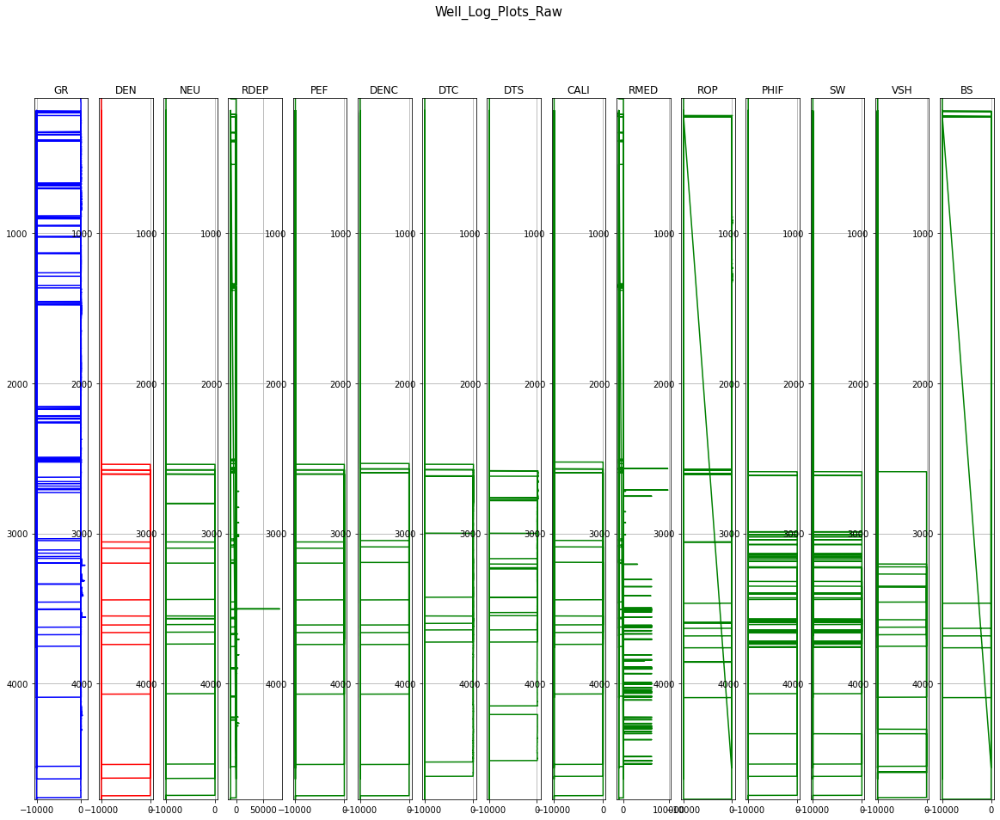

In [14]:
plt.figure(figsize=(20,15))

plt.suptitle('Well_Log_Plots_Raw', size=15)

plt.subplot(1,15,1)
plt.plot(gr, depth, color='blue')
plt.ylim(max(depth), min(depth))
plt.title('GR')
plt.grid()

plt.subplot(1,15,2)
plt.plot(den, depth, color='red')
plt.ylim(max(depth), min(depth))
plt.title('DEN')
plt.grid()

plt.subplot(1,15,3)
plt.plot(neu, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('NEU')
plt.grid()

plt.subplot(1,15,4)
plt.plot(rdep, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('RDEP')
plt.grid()

plt.subplot(1,15,5)
plt.plot(pef, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('PEF')
plt.grid()

plt.subplot(1,15,6)
plt.plot(denc, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('DENC')
plt.grid()

plt.subplot(1,15,7)
plt.plot(dtc, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('DTC')
plt.grid()

plt.subplot(1,15,8)
plt.plot(dts, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('DTS')
plt.grid()

plt.subplot(1,15,9)
plt.plot(cali, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('CALI')
plt.grid()

plt.subplot(1,15,10)
plt.plot(rmed, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('RMED')
plt.grid()

plt.subplot(1,15,11)
plt.plot(rop, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('ROP')
plt.grid()

plt.subplot(1,15,12)
plt.plot(phif, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('PHIF')
plt.grid()

plt.subplot(1,15,13)
plt.plot(sw, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('SW')
plt.grid()

plt.subplot(1,15,14)
plt.plot(vsh, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('VSH')
plt.grid()

plt.subplot(1,15,15)
plt.plot(bs, depth, color='green')
plt.ylim(max(depth), min(depth))
plt.title('BS')
plt.grid()


# set space between logs
plt.tight_layout(10)
plt.show()

1. Plot shows extremely large values and extremely small values. Possible presence of outliers 
2. Also besides gamma ray logs, no deflections were observed for depths from 0 to about 8000ft for the rest of the logs.
A possible explanation for this is the fact that log tools are usually deployed in pay zones which are usually a few 1000 feet from surface. We would assume that the actual well logging was started from depths beyond 8000ft. 

Let us further explore with boxplots

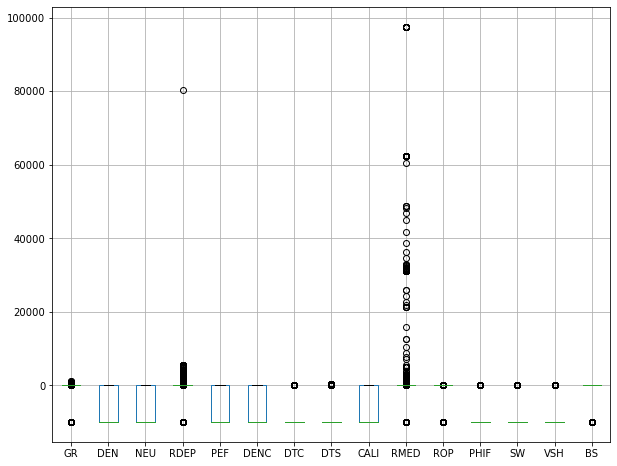

In [15]:
boxplot= rawdata.boxplot(column=['GR', 'DEN', 'NEU','RDEP','PEF','DENC','DTC','DTS','CALI','RMED','ROP','PHIF','SW','VSH','BS' ], figsize=(10,8))

#plt.figure(15,10)
#plt.show()

The simple box plots shows the following; 
1. A large number of negative values in all the log measurements, which does not auger well stemming from domain knowldehge of log values 
2. Significant number of outliers in RDEP, RMED, GR,DTC and DTS logs

Before cleaning the data and treating outliers, let us examine the distribution of the various columns in the given data

In [16]:
#sns.violinplot(x= rawdata['GR'],y= rawdata['DEPTH'], data = rawdata)

### Univariate Analysis

array([[<AxesSubplot:title={'center':'WELLNUM'}>,
        <AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'DTC'}>,
        <AxesSubplot:title={'center':'DTS'}>],
       [<AxesSubplot:title={'center':'BS'}>,
        <AxesSubplot:title={'center':'CALI'}>,
        <AxesSubplot:title={'center':'DEN'}>,
        <AxesSubplot:title={'center':'DENC'}>],
       [<AxesSubplot:title={'center':'GR'}>,
        <AxesSubplot:title={'center':'NEU'}>,
        <AxesSubplot:title={'center':'PEF'}>,
        <AxesSubplot:title={'center':'RDEP'}>],
       [<AxesSubplot:title={'center':'RMED'}>,
        <AxesSubplot:title={'center':'ROP'}>,
        <AxesSubplot:title={'center':'PHIF'}>,
        <AxesSubplot:title={'center':'SW'}>],
       [<AxesSubplot:title={'center':'VSH'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

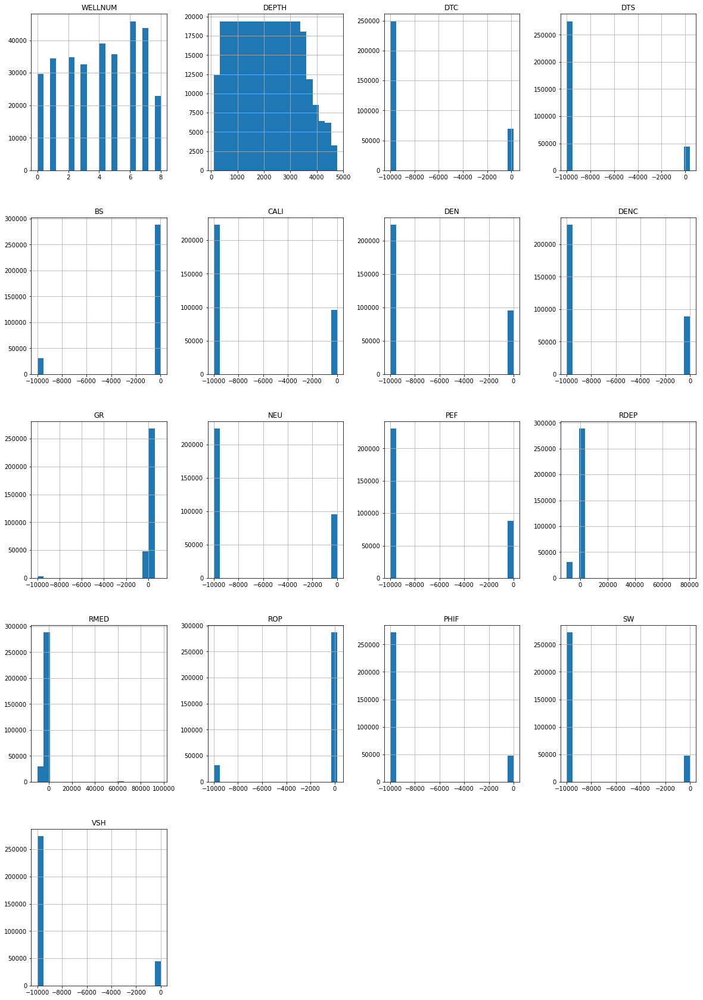

In [17]:
rawdata.hist(figsize = (20, 30), bins= 20)

### Let us discuss inference from the univariate analysis

1. Well number and well depth are uniformly and normally distributed respectively which is expected as well number is nominal. Also we expect more data to be collected at the depth of interest which in this case is around 5000 to 10000ft. 
2. DTC, DTS, CALI, DEN, DENC, BS, GR, NEU, PEF, RDEP, RMED, ROP, PHIF, SW AND VSH all show bimodality.
This means that two different distrubitions are present in the data. 
3. DTC,DTS, DEN, DENC, NEU, PEF and PHIF have a larger proportion of their distribution with average values of -999. This is unsual using domain knowledge as compression travel time, shear travel time, density and an neutron porosity logs do not usally provide such high negative values in oil and gas operations. 
Assumption: We would assume that this data was obtain from depths where the logging tools were not deployed and which are not of interest to the study. 

4. RDEP and RMED values have averages of -948 and -804 respectively which is unsual for conventional oil formations like the Volve field. Resistivity logs are usally presented on a logarithmic scale from 0.2 to 2000 Ohmm (https://glossary.oilfield.slb.com/en/terms/r/resistivity_log). 


### Basic Reservoir Engineering

1. Resistivity of resrvoir formation fluids is essential in determination of water saturation which is in turn used in estimating the hydrocarbon initially in place. 
This is usually done using the Archie's equation as shown below. The equation also shows that water saturation is related to porosity

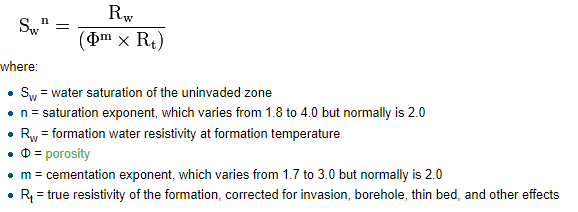

2. Sonic logs, bulk density logs and are aslo used in determining formation porosity and can be shown in the equations below

#### Porosity estimation from formation bulk density

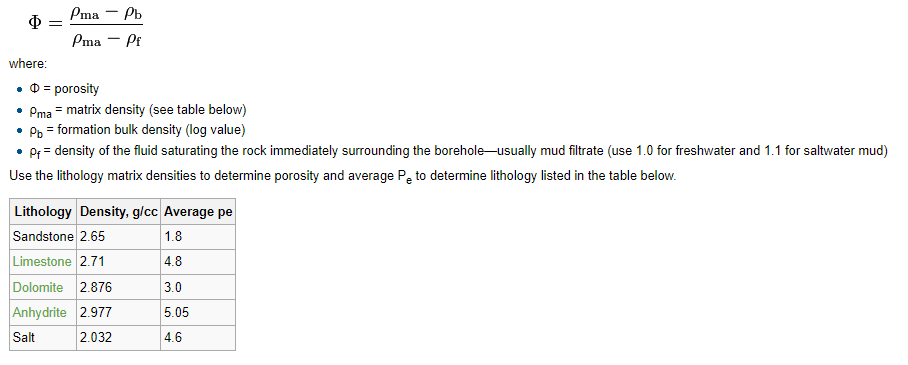

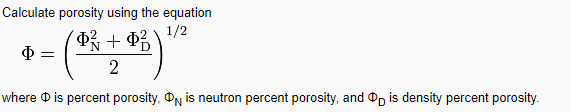

#### Porosity Estimation from travel time

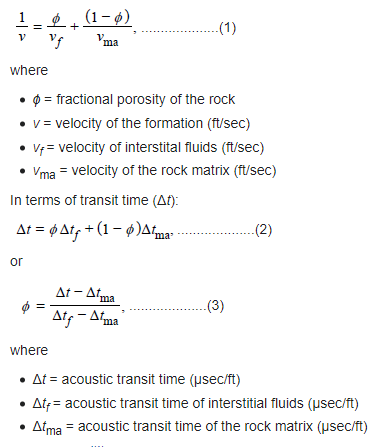

Before we do any form of data cleaning, let us determine if there are any correlations between the individual parameters in the data set

### Checking correlations between variables 

<AxesSubplot:>

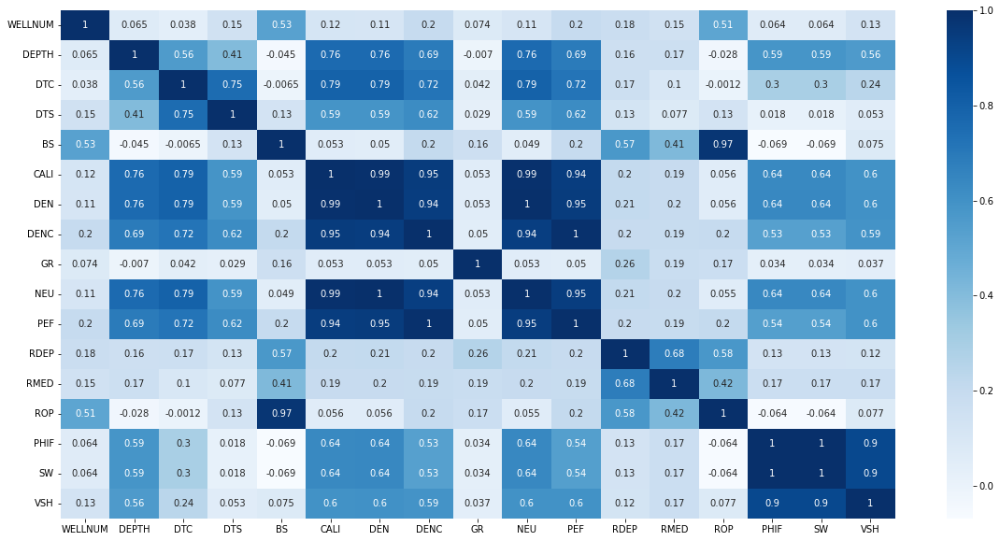

In [18]:
plt.figure(figsize=(20,10))
sns.heatmap(rawdata.corr(),cbar=True,annot=True,cmap='Blues')

Caveat: This correlations may be due to anomalies in the data. i.e. -999 values recorded.

### Positive Correlation 

1. PHIF---DEPTH, CALI, DEN, DENC, NEU, PEF, VSH, SW
2. SW---CALI, DEN, DENC, NEU, PEF, VSH
3. VSH---CALI, DTC, DEN, DENC, NEU, PEF, PHIF, SW

### Negative Correlation 

1. PHIF---BS,ROP
2. SW---BS, ROP

Due to the high level of suspected anomalies in the data, we would not look at collinearity at this stage.

Now let us clean up the data

In [19]:
rawdata.replace(['-9999', -9999], np.nan, inplace=True) # replacinhg all -999 values with nan

In [20]:
rawdata.head()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
0,0,102.156797,NaN,NaN,NaN,NaN,NaN,NaN,5.3274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,102.309197,NaN,NaN,NaN,NaN,NaN,NaN,5.8235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,102.461597,NaN,NaN,NaN,NaN,NaN,NaN,6.5228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,102.613997,NaN,NaN,NaN,NaN,NaN,NaN,7.2285,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,102.766397,NaN,NaN,NaN,NaN,NaN,NaN,9.5020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
rawdata.shape

(318967, 17)

In [22]:
rawdata.describe()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
count,318967.000000,318967.000000,69894.000000,43848.000000,287913.000000,96157.000000,95620.000000,89116.000000,315848.000000,95439.000000,88536.000000,288519.000000,288753.000000,286588.000000,47314.000000,47314.000000,45100.000000
mean,4.081012,2133.045195,77.155278,140.490795,16.856695,8.697590,2.452806,0.050244,55.288621,0.173838,5.757870,5.140624,158.102867,28.550509,0.137371,0.701001,0.307895
std,2.462805,1157.611118,15.387921,36.085217,7.071820,0.384869,0.156333,0.020949,38.602323,0.095899,2.533365,168.911711,3082.521918,18.161868,0.085265,0.350021,0.254315
min,0.000000,102.156797,1.025100,74.822400,8.500000,6.000000,1.626600,-0.982700,0.148800,-0.003400,-0.023200,0.065000,0.064900,0.000000,0.000000,0.013000,-0.248000
25%,2.000000,1145.399959,66.363775,119.019775,8.500000,8.578100,2.311100,0.043900,24.329750,0.106300,4.891800,0.743400,0.769700,19.451200,0.060000,0.336000,0.118375
50%,4.000000,2104.700016,72.396000,130.534100,17.500000,8.625000,2.506800,0.053100,55.983000,0.156900,6.143150,1.208590,1.255200,25.916100,0.133000,0.933496,0.246509
75%,6.000000,3063.998854,85.584000,144.340900,26.000000,8.687500,2.576100,0.060600,79.240600,0.218700,7.737325,2.183900,2.348500,32.220200,0.216000,1.000000,0.390100
max,8.000000,4770.601431,181.813900,388.839700,36.000000,20.330400,3.089600,0.334158,1124.440000,1.463474,13.840700,80266.800000,97543.400000,208.633000,0.403294,1.000000,3.654300


In [23]:
dfi.export(rawdata.describe(), 'dataframe1.png')

### The statistics of the data looking better.

Let us look at the missing data

In [24]:
rawdata.isna().sum()

WELLNUM         0
DEPTH           0
DTC        249073
DTS        275119
BS          31054
CALI       222810
DEN        223347
DENC       229851
GR           3119
NEU        223528
PEF        230431
RDEP        30448
RMED        30214
ROP         32379
PHIF       271653
SW         271653
VSH        273867
dtype: int64

### Lets visualize the missing data

<AxesSubplot:>

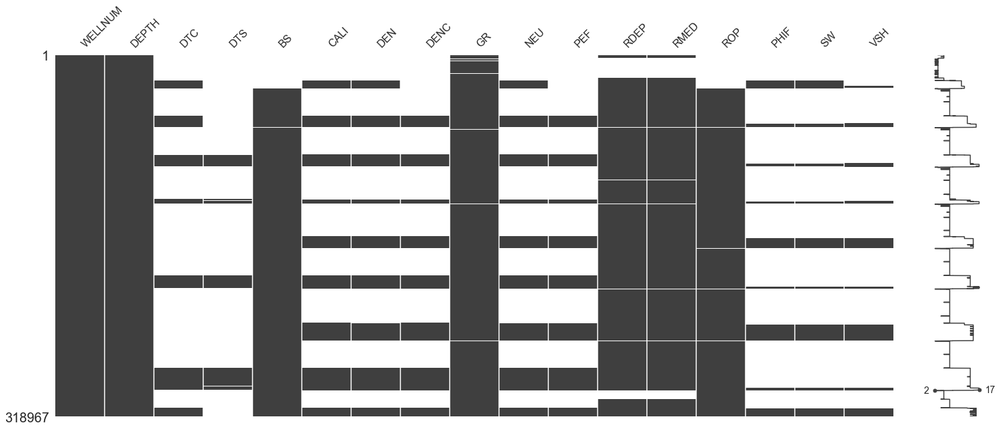

In [25]:
import missingno as msno
sns.set()
msno.matrix(rawdata)

<AxesSubplot:>

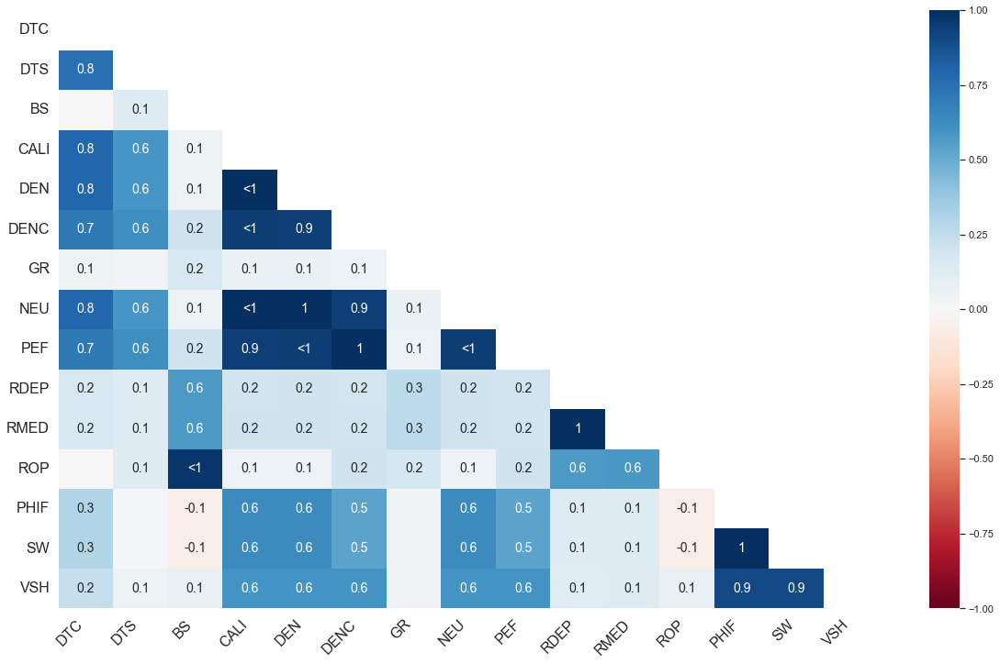

In [26]:
msno.heatmap(rawdata) ### Missing value relationships between paramters

We have a significant number of missing values 

Let us see their percentage

In [27]:
# Determine the percentage of missing variables
total = rawdata.isnull().sum().sort_values(ascending=False)
percent = (rawdata.isnull().sum()/rawdata.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(18)

,Total,Percent
DTS,275119,0.862531
VSH,273867,0.858606
PHIF,271653,0.851665
SW,271653,0.851665
DTC,249073,0.780874
PEF,230431,0.722429
DENC,229851,0.720611
NEU,223528,0.700787
DEN,223347,0.700220
CALI,222810,0.698536


**Comments**

From the above, we can see that DTS, VSH, PHIF, SW, DTC, DENC, PEF, NEU, DEN and CALI have a great amount of missing values. Hence, we need to consider domain knowledge and dropping of irrelevant columns or columns with little or no relationship with the target variables. 

First let us drop all missing values in the tagret variables

Let us create a new dataset

In [28]:
rawdata1 = rawdata.copy(deep = True)

In [29]:
col_names =  ['PHIF', 'SW', 'VSH']
rawdata1.dropna(axis=0, subset=col_names, inplace=True)
rawdata1.shape

(42309, 17)

In [30]:
rawdata1.describe()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
count,42309.000000,42309.000000,19314.000000,7198.000000,40429.0,42309.000000,42309.000000,40429.000000,42309.000000,42306.000000,40429.000000,42075.000000,42309.000000,40332.000000,42309.000000,42309.000000,42309.000000
mean,4.985866,3732.456858,76.710857,131.021627,8.5,8.662651,2.411064,0.045937,39.888234,0.181612,5.185693,25.199747,1029.768280,23.435488,0.141736,0.667124,0.275485
std,2.268441,488.988700,12.312749,14.551402,0.0,0.279134,0.160632,0.022609,24.822777,0.066775,1.715554,440.389867,7800.685663,7.759510,0.081144,0.354821,0.206619
min,0.000000,2588.971117,1.025100,74.822400,8.5,8.304600,1.626600,-0.487100,4.588597,-0.003400,-0.013100,0.129500,0.139400,0.337400,0.000000,0.013000,-0.248000
25%,4.000000,3411.199571,68.909410,123.151225,8.5,8.556900,2.264400,0.034900,20.069900,0.144110,4.583000,1.475490,1.531300,18.803225,0.068437,0.297700,0.113500
50%,6.000000,3630.201412,74.998850,131.898800,8.5,8.625000,2.419800,0.048200,35.799400,0.176400,5.414100,2.785300,3.327200,24.983250,0.141000,0.808000,0.232600
75%,6.000000,4076.800454,83.715325,138.538250,8.5,8.671900,2.544000,0.060100,52.007100,0.215500,6.096800,9.129700,11.222060,29.914800,0.217000,1.000000,0.360400
max,8.000000,4744.800112,123.253500,193.840200,8.5,11.904800,3.089600,0.257450,304.333700,0.862567,13.356600,80266.800000,62290.800000,46.895400,0.403294,1.000000,2.460104


In [31]:
rawdata1.shape

(42309, 17)

In [32]:
# The shape of the data has significantly reduced

Let us check missing data in the new data set

In [33]:
rawdata1.isna().sum()

WELLNUM        0
DEPTH          0
DTC        22995
DTS        35111
BS          1880
CALI           0
DEN            0
DENC        1880
GR             0
NEU            3
PEF         1880
RDEP         234
RMED           0
ROP         1977
PHIF           0
SW             0
VSH            0
dtype: int64

In [34]:
total = rawdata1.isnull().sum().sort_values(ascending=False)
percent = (rawdata1.isnull().sum()/rawdata.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(18)

,Total,Percent
DTS,35111,0.110077
DTC,22995,0.072092
ROP,1977,0.006198
BS,1880,0.005894
DENC,1880,0.005894
PEF,1880,0.005894
RDEP,234,0.000734
NEU,3,0.000009
WELLNUM,0,0.000000
RMED,0,0.000000


<AxesSubplot:>

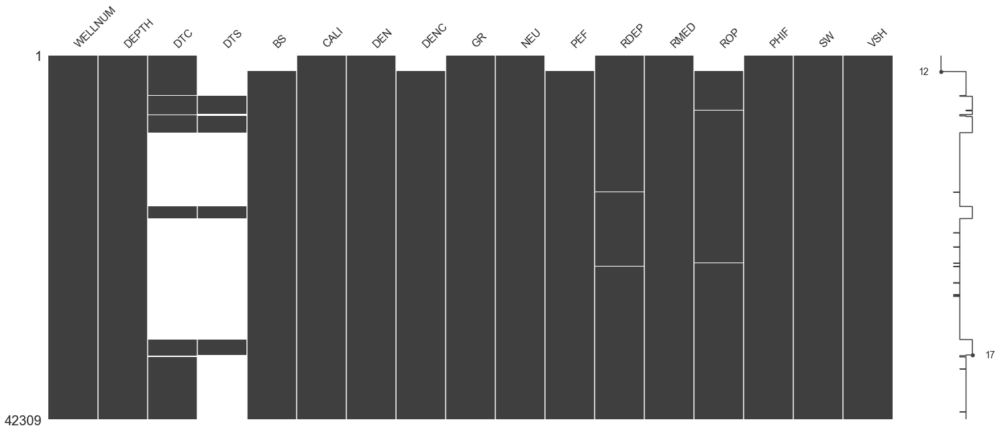

In [35]:
sns.set()
msno.matrix(rawdata1)

1. The number of missing values have reduced significantly.
2. There are however significant missing values in the compressional and shear travel times which are used in sonic porosity determination
3. to confirm this, let us heck and see if there is some form of correlation between these logs and the target variables.

In [36]:
#sns.set(style = 'ticks') # Set the background to dark
#sns.pairplot(rawdata1, vars=['DEPTH','GR', 'DTC','DTS' ,'DEN', 'DENC', 'PEF', 'RMED', 'ROP', 'CALI','NEU', 'RDEP', 'PHIF', 'SW', 'VSH'] ) # Create a matrix scatterplot

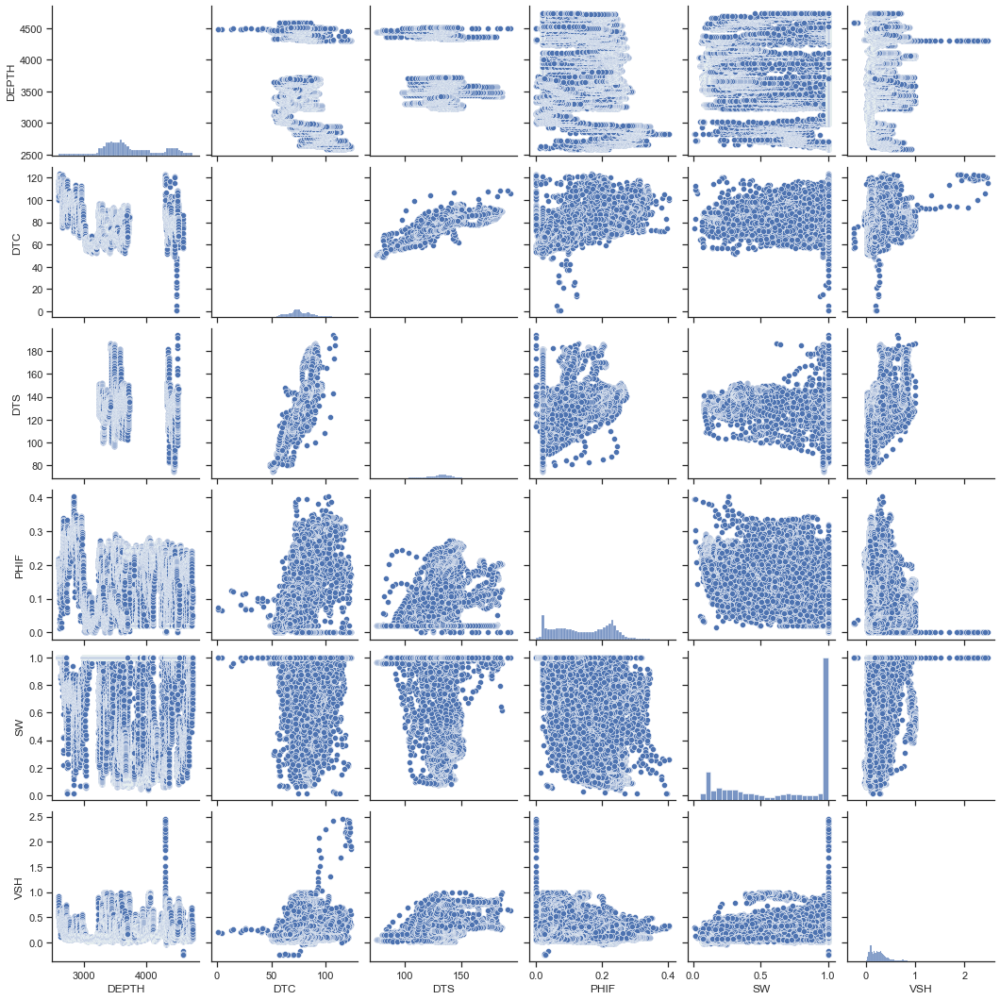

In [37]:
sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(rawdata1, vars=['DEPTH', 'DTC','DTS' ,'PHIF', 'SW', 'VSH'] ) # Create a matrix scatterplot

BIVARIATE ANALYSIS

Taking some notes from the bivariate analysis

1. DTC- has a positive correlation with PHIF, and minimal correlation with VSH and SW
2. DTS- has a slight positive correlation with VSH

Exploring the data further

<AxesSubplot:>

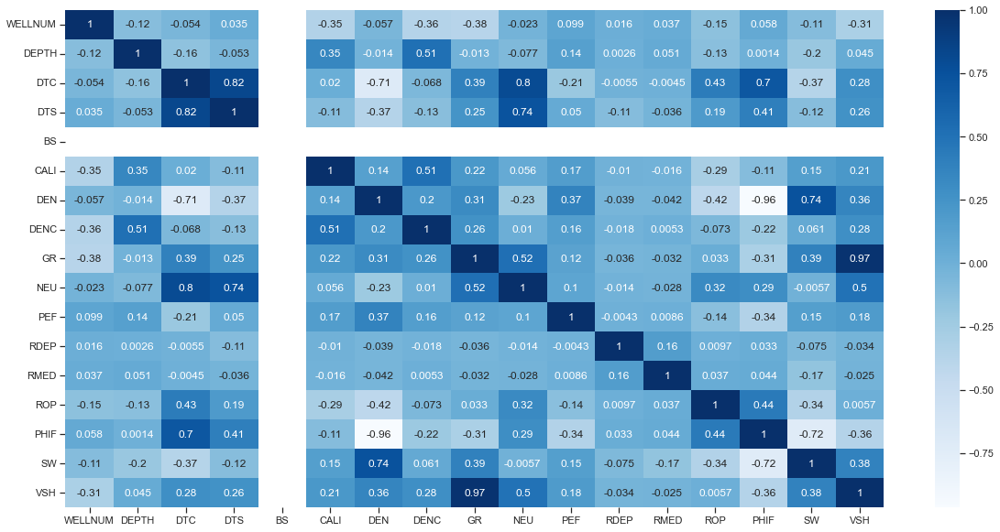

In [38]:
plt.figure(figsize=(20,10))
sns.heatmap(rawdata1.corr(),cbar=True,annot=True,cmap='Blues')

Obviously DTC and DTS have correlations with the target variables

### Let us look at the rawdata1 again

In [39]:
rawdata1.shape

(42309, 17)

### Let us check the percentage of missing values

In [40]:
rawdata1.isna().sum()

WELLNUM        0
DEPTH          0
DTC        22995
DTS        35111
BS          1880
CALI           0
DEN            0
DENC        1880
GR             0
NEU            3
PEF         1880
RDEP         234
RMED           0
ROP         1977
PHIF           0
SW             0
VSH            0
dtype: int64

In [41]:
total = rawdata1.isnull().sum().sort_values(ascending=False)
percent = (rawdata1.isnull().sum()/rawdata1.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(18)

,Total,Percent
DTS,35111,0.829871
DTC,22995,0.543501
ROP,1977,0.046728
BS,1880,0.044435
DENC,1880,0.044435
PEF,1880,0.044435
RDEP,234,0.005531
NEU,3,0.000071
WELLNUM,0,0.000000
RMED,0,0.000000


array([[<AxesSubplot:title={'center':'WELLNUM'}>,
        <AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'DTC'}>,
        <AxesSubplot:title={'center':'DTS'}>],
       [<AxesSubplot:title={'center':'BS'}>,
        <AxesSubplot:title={'center':'CALI'}>,
        <AxesSubplot:title={'center':'DEN'}>,
        <AxesSubplot:title={'center':'DENC'}>],
       [<AxesSubplot:title={'center':'GR'}>,
        <AxesSubplot:title={'center':'NEU'}>,
        <AxesSubplot:title={'center':'PEF'}>,
        <AxesSubplot:title={'center':'RDEP'}>],
       [<AxesSubplot:title={'center':'RMED'}>,
        <AxesSubplot:title={'center':'ROP'}>,
        <AxesSubplot:title={'center':'PHIF'}>,
        <AxesSubplot:title={'center':'SW'}>],
       [<AxesSubplot:title={'center':'VSH'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

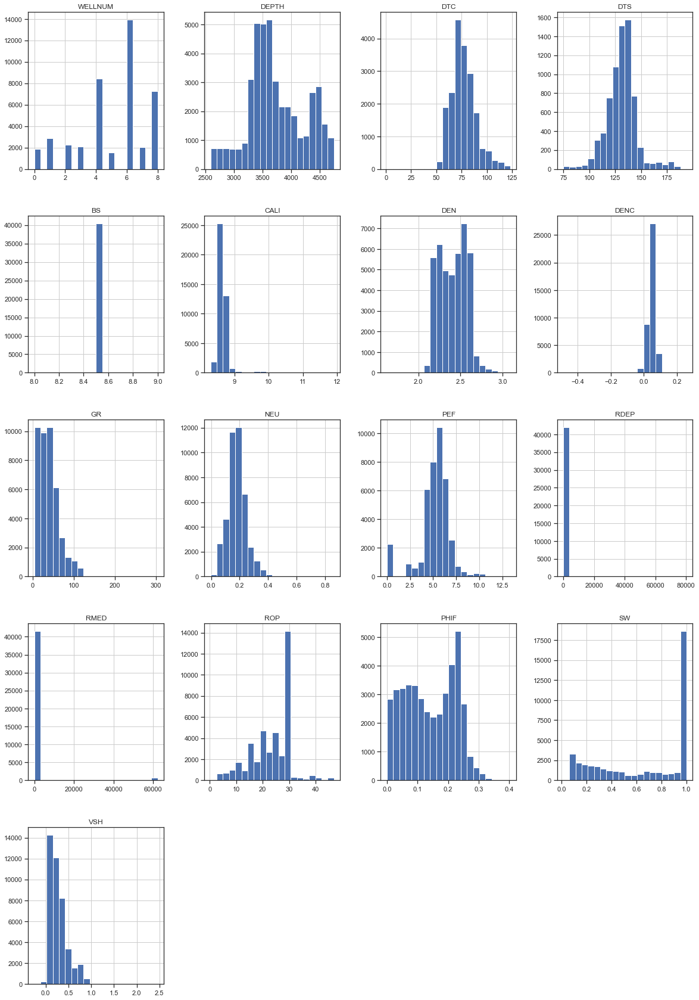

In [42]:
rawdata1.hist(figsize = (20, 30), bins= 20)

1. The number of missing values in the DTS and DTC data is greater than half of the overal data
2. Removing the missing data would make us lose most of our data


In [43]:
#rawdata1.head(20)

### Explore techniques on how to deal with the missing values.

The following techniques would be employed 

#### a. Imputation Technique

#### b. Using algorithms that accomodate missing values 

#### Data Imputation

Petroleum well logs and petrophysical data are measured in different scales and are highly variable. This is due to the significant diffference in mineralogical constituents of different rock formations encountered during well logging. The use of conventional machine learning imputation techniques like imputing mean or any other measure of central tendency would significantly affect the intergity of the data and model accuracy. 

We employ the method used by (Akinnikawe et al, 2018) were we apply simple linear regression methods to generate and inpute synthetic log values in place of the missing values.

##### Now, I would predict the missing values for DTS, DTC, PEF, DENC and ROP

#### Methodology

The method employed here is as follows; 
1. Firts, copy rawdata1 into a new dataset rawdata2
2. select rows within the data with no missing values for training of the model
3. select all rows with missing values in the target data column but no missing values in the rest of the columns for testing.
4. check for collinearity and select appropriate features.
5. Scale data, fit training data to the model and generate synthetic logs using test data

In [44]:
rawdata2=rawdata1.copy(deep = True) # copy rawdata1 in to rawdata2
# We are doin this to keep rawdata1 untouched

<AxesSubplot:>

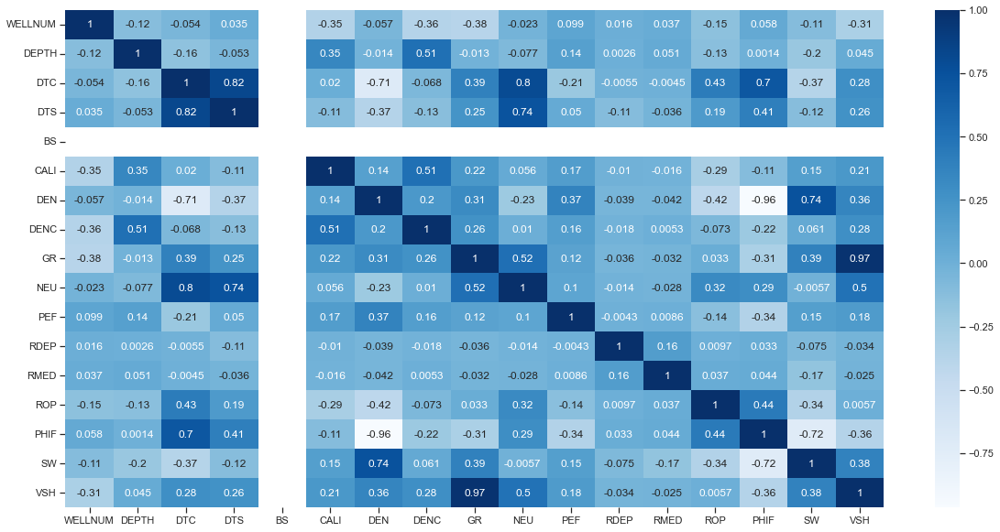

In [45]:
plt.figure(figsize=(20,10))
sns.heatmap(rawdata2.corr(),cbar=True,annot=True,cmap='Blues')

### DTS Prediction

In [46]:
predictions=rawdata2[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH', 'DEN', 'CALI','VSH','DTS']] 
# We select these paramters for the predictions because they have good correlations with the target variable and have no NAN values.

In [47]:
predictions.shape

(42309, 9)

In [48]:
#rawdata2.isna().sum()

In [49]:
rawdata2.shape

(42309, 17)

In [50]:
filt=predictions[predictions["DTS"].isna()] #### Selecting all rows with NAN values for DTS

In [51]:
filt.shape

(35111, 9)

In [52]:
predictions_train= predictions.dropna(how='any', inplace=False)

In [53]:
predictions_train.head() ### All rows with no missing values for training data

,RMED,SW,PHIF,GR,DEPTH,DEN,CALI,VSH,DTS
96439,1.9640,0.6187,0.1279,75.1668,3429.399178,2.4477,8.625,1.0000,186.7906
96440,0.8145,0.6446,0.1248,71.3828,3429.499762,2.4529,8.625,0.9452,185.7127
96441,0.5584,0.7973,0.1176,65.6385,3429.600346,2.4648,8.625,0.8582,184.6462
96442,0.5147,1.0000,0.1036,58.8981,3429.700930,2.4881,8.625,0.7560,183.5797
96443,0.5328,1.0000,0.0813,53.5140,3429.801514,2.5250,8.625,0.6745,182.9750


#### Check for collinearity

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()# Create an empty dataFrame 
vif_data["feature"] = predictions_train.columns
vif_data["VIF"] = [variance_inflation_factor(predictions_train.values, i) for i in range(len(predictions_train.columns))]
vif_data

,feature,VIF
0,RMED,1.025357
1,SW,22.446077
2,PHIF,50.054616
3,GR,85.835371
4,DEPTH,97.609606
5,DEN,3358.722712
6,CALI,4209.492195
7,VSH,60.675388
8,DTS,164.220538


#### Almost all the features are highly correlated. However at this stage, we would define a threshold value of 100

In [55]:
train_predict=predictions_train[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH','DTS']]

In [56]:
train_predict.isna().sum()

RMED     0
SW       0
PHIF     0
GR       0
DEPTH    0
VSH      0
DTS      0
dtype: int64

In [57]:
train_predict.shape

(7198, 7)

In [58]:
filt.head()

,RMED,SW,PHIF,GR,DEPTH,DEN,CALI,VSH,DTS
27573,2.4927,1.0,0.0,88.8573,4304.281862,2.5777,9.9048,0.751631,NaN
27574,2.4685,1.0,0.0,120.8949,4304.434262,2.4748,9.9912,1.032475,NaN
27575,2.3742,1.0,0.0,153.5195,4304.586662,2.3338,9.9048,1.312757,NaN
27576,2.4142,1.0,0.0,182.8531,4304.739062,2.2358,9.9048,1.682292,NaN
27577,2.4077,1.0,0.0,256.1960,4304.891462,2.2278,9.8095,1.924398,NaN


In [59]:
filt.shape

(35111, 9)

In [60]:
test_data=filt[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']] ## Filt data would be used as the test set

In [61]:
test_data.head()

,RMED,SW,PHIF,GR,DEPTH,VSH
27573,2.4927,1.0,0.0,88.8573,4304.281862,0.751631
27574,2.4685,1.0,0.0,120.8949,4304.434262,1.032475
27575,2.3742,1.0,0.0,153.5195,4304.586662,1.312757
27576,2.4142,1.0,0.0,182.8531,4304.739062,1.682292
27577,2.4077,1.0,0.0,256.1960,4304.891462,1.924398


In [62]:
test_data.shape

(35111, 6)

In [63]:
from sklearn import neighbors 
K_reg = neighbors.KNeighborsRegressor(n_neighbors = 10)

In [64]:
#ALL features except DTS
train_data_x =train_predict[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']]

In [65]:
train_data_x.head()

,RMED,SW,PHIF,GR,DEPTH,VSH
96439,1.9640,0.6187,0.1279,75.1668,3429.399178,1.0000
96440,0.8145,0.6446,0.1248,71.3828,3429.499762,0.9452
96441,0.5584,0.7973,0.1176,65.6385,3429.600346,0.8582
96442,0.5147,1.0000,0.1036,58.8981,3429.700930,0.7560
96443,0.5328,1.0000,0.0813,53.5140,3429.801514,0.6745


##### Scaling training data

In [66]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

train_data_x_np =train_data_x[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
train_data_x_scaled = scaler.fit_transform(train_data_x_np)                              
train_data_x_scaled_df = pd.DataFrame (train_data_x_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [67]:
train_data_x_scaled_df.head()

,RMED,SW,PHIF,GR,DEPTH,VSH
0,-0.046263,-0.781751,0.118075,1.233189,-0.704200,3.302186
1,-0.046699,-0.687795,0.072880,1.066924,-0.703960,3.037838
2,-0.046797,-0.133853,-0.032091,0.814526,-0.703720,2.618162
3,-0.046813,0.601471,-0.236200,0.518361,-0.703481,2.125164
4,-0.046806,0.601471,-0.561317,0.281790,-0.703241,1.732019


<AxesSubplot:title={'center':'After Standard Scaler'}, xlabel='RMED', ylabel='Density'>

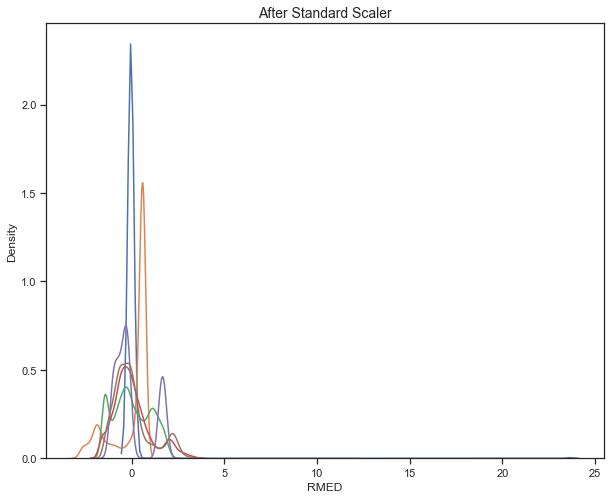

In [68]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After Standard Scaler', fontsize = 14)

sns.kdeplot(train_data_x_scaled_df['RMED'], ax=ax1)
sns.kdeplot(train_data_x_scaled_df['SW'], ax=ax1)
sns.kdeplot(train_data_x_scaled_df['PHIF'], ax=ax1)
sns.kdeplot(train_data_x_scaled_df['GR'], ax=ax1)
sns.kdeplot(train_data_x_scaled_df['DEPTH'], ax=ax1)
sns.kdeplot(train_data_x_scaled_df['VSH'], ax=ax1)

In [69]:
#OnLy DTS
#train_data_y =predictions_train.iloc[:,8]# all rows and column 7 ; NB columns start from 0

In [70]:
train_data_y= train_predict[['DTS']]

In [71]:
train_data_y.head()

,DTS
96439,186.7906
96440,185.7127
96441,184.6462
96442,183.5797
96443,182.9750


In [72]:
x_train=train_data_x_scaled_df.to_numpy()

In [73]:
#x_train

In [74]:
#y_train.shape

In [75]:
y_train=train_data_y.to_numpy()

In [76]:
K_reg.fit(x_train,y_train)

KNeighborsRegressor(n_neighbors=10)

In [77]:
pred_y=K_reg.predict(x_train)

In [78]:
#linreg_1 = neighbors.KNeighborsRegressor(n_neighbors = 10)
train_R2 = K_reg.score(x_train, y_train)
print(train_R2) ### The correlation is not the best, but at this stage we would maintain this

0.7978364079068784


In [79]:
# scale test data
test_data_np =test_data[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
test_data_scaled = scaler.fit_transform(test_data_np)                              
test_data_scaled_df = pd.DataFrame (test_data_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [80]:
x_test=test_data_scaled_df.to_numpy()

In [81]:
x_test.shape

(35111, 6)

In [82]:
#DTS_predicted['DTS']=pd.DataFrame(linreg.predict(x_test))

In [83]:
predicted_dee=K_reg.predict(x_test)

In [84]:
predicted_df=pd.DataFrame(predicted_dee)

In [85]:
predicted_df

,0
0,123.43013
1,129.89776
2,131.51970
3,134.26538
4,134.26538
...,...
35106,115.60906
35107,114.60627
35108,115.83357
35109,116.91990


In [86]:
predicted_df.isna().sum()

0    0
dtype: int64

In [87]:
predicted_df_list=predicted_df.values.tolist()

In [88]:
len(predicted_df_list)

35111

In [89]:
#predicted_df

In [90]:
#rawdata2.DTS.fillna(1, inplace=True)

In [91]:
rawdata1.loc[rawdata1.DTS.isna(),'DTS']=predicted_df_list ### appending the predicted values to the rawdata1 dataset

In [92]:
rawdata1.isna().sum()

WELLNUM        0
DEPTH          0
DTC        22995
DTS            0
BS          1880
CALI           0
DEN            0
DENC        1880
GR             0
NEU            3
PEF         1880
RDEP         234
RMED           0
ROP         1977
PHIF           0
SW             0
VSH            0
dtype: int64

In [93]:
rawdata1.head()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP,PHIF,SW,VSH
27573,0,4304.281862,89.6461,123.43013,NaN,9.9048,2.5777,NaN,88.8573,0.277790,NaN,2.6310,2.4927,NaN,0.0,1.0,0.751631
27574,0,4304.434262,96.0152,129.89776,NaN,9.9912,2.4748,NaN,120.8949,0.294806,NaN,2.4760,2.4685,NaN,0.0,1.0,1.032475
27575,0,4304.586662,104.0457,131.51970,NaN,9.9048,2.3338,NaN,153.5195,0.447361,NaN,2.4359,2.3742,NaN,0.0,1.0,1.312757
27576,0,4304.739062,113.5010,134.26538,NaN,9.9048,2.2358,NaN,182.8531,0.579637,NaN,2.4065,2.4142,NaN,0.0,1.0,1.682292
27577,0,4304.891462,117.7817,134.26538,NaN,9.8095,2.2278,NaN,256.1960,0.556317,NaN,2.3365,2.4077,NaN,0.0,1.0,1.924398


In [94]:
##rawdata2.isna().sum()

1. We have successfully replaced all the nan values in rawdata1
2. Let us repeat the process for DTC

### Predicting the values for DTC

In [95]:
predictions1=rawdata2[['RMED','SW','PHIF','GR','DEPTH','DEN','CALI','VSH','DTC']]

In [96]:
filt1=predictions1[predictions1["DTC"].isna()]

In [97]:
filt1.shape

(22995, 9)

In [98]:
predictions1_train=predictions1.dropna(how='any', inplace=False)

In [99]:
predictions1_train.head()

,RMED,SW,PHIF,GR,DEPTH,DEN,CALI,VSH,DTC
27573,2.4927,1.0,0.0,88.8573,4304.281862,2.5777,9.9048,0.751631,89.6461
27574,2.4685,1.0,0.0,120.8949,4304.434262,2.4748,9.9912,1.032475,96.0152
27575,2.3742,1.0,0.0,153.5195,4304.586662,2.3338,9.9048,1.312757,104.0457
27576,2.4142,1.0,0.0,182.8531,4304.739062,2.2358,9.9048,1.682292,113.5010
27577,2.4077,1.0,0.0,256.1960,4304.891462,2.2278,9.8095,1.924398,117.7817


In [100]:
predictions1_train.shape

(19314, 9)

In [101]:
# check for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data1 = pd.DataFrame()# Create an empty dataFrame 
vif_data1["feature"] = predictions1_train.columns
vif_data1["VIF"] = [variance_inflation_factor(predictions1_train.values, i) for i in range(len(predictions1_train.columns))]
vif_data1

,feature,VIF
0,RMED,1.014823
1,SW,29.774513
2,PHIF,21.078139
3,GR,64.049609
4,DEPTH,70.057482
5,DEN,611.121316
6,CALI,705.695843
7,VSH,50.268853
8,DTC,127.130726


In [102]:
test_data1=filt1[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']]

In [103]:
K_reg1 = neighbors.KNeighborsRegressor(n_neighbors = 10)

In [104]:
train_data_x1 =predictions1_train[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']]

In [105]:
train_data_x1_np =train_data_x1[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
train_data_x1_scaled = scaler.fit_transform(train_data_x1_np)                              
train_data_x1_scaled_df = pd.DataFrame (train_data_x1_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [106]:
train_data_y1= predictions1_train[['DTC']]

In [107]:
x_train1=train_data_x1_scaled_df.to_numpy()

In [108]:
y_train1=train_data_y1.to_numpy()

In [109]:
K_reg1.fit(x_train1,y_train1)

KNeighborsRegressor(n_neighbors=10)

In [110]:
train1_R2 = K_reg1.score(x_train1, y_train1)
print(train1_R2)

0.889578509477796


In [111]:
# scale test data
test_data1_np =test_data1[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
test_data1_scaled = scaler.fit_transform(test_data1_np)                              
test_data1_scaled_df = pd.DataFrame (test_data1_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [112]:
x_test1=test_data1_scaled_df.to_numpy()

In [113]:
y_predd=K_reg1.predict(x_train1)

In [114]:
predicted_dep=K_reg1.predict(x_test1)

predicted_df1=pd.DataFrame(predicted_dep)

In [115]:
from math import sqrt
from sklearn.metrics import mean_squared_error

In [116]:
RMSE_= sqrt(mean_squared_error(y_predd, y_train1))
RMSE_

4.091387186046182

In [117]:
predicted_df1.shape

(22995, 1)

In [118]:
predicted_df1.head()

,0
0,77.65385
1,78.36066
2,78.36066
3,78.59064
4,78.72275


In [119]:
predicted_df1.rename(columns={0: "DTC"}, inplace=True)

In [120]:
predicted_df1.isna().sum()

DTC    0
dtype: int64

In [121]:
predicted_df1_list=predicted_df1.values.tolist()

In [122]:
rawdata1.loc[rawdata1.DTC.isna(),'DTC']=predicted_df1_list

In [123]:
rawdata1.isna().sum()

WELLNUM       0
DEPTH         0
DTC           0
DTS           0
BS         1880
CALI          0
DEN           0
DENC       1880
GR            0
NEU           3
PEF        1880
RDEP        234
RMED          0
ROP        1977
PHIF          0
SW            0
VSH           0
dtype: int64

In [124]:
#rawdata2.isna().sum()

In [125]:
# DTC missing values have also been removed in rawdata1

### Lets repeat the process for corrected density and photoelectric factor

### DENC

In [126]:
predictions3=rawdata2[['RMED','SW','PHIF','GR','DEPTH','DEN','CALI','VSH','DENC']]

In [127]:
filt_denc=predictions3[predictions3["DENC"].isna()]

In [128]:
predictions3_train=predictions3.dropna(how='any', inplace=False)

In [129]:
predictions3_train.shape

(40429, 9)

In [130]:
# Multicollinearity
vif_data2 = pd.DataFrame()# Create an empty dataFrame 
vif_data2["feature"] = predictions3_train.columns
vif_data2["VIF"] = [variance_inflation_factor(predictions3_train.values, i) for i in range(len(predictions3_train.columns))]
vif_data2

,feature,VIF
0,RMED,1.067485
1,SW,13.128926
2,PHIF,54.729801
3,GR,99.076585
4,DEPTH,117.654630
5,DEN,3177.270736
6,CALI,4174.546969
7,VSH,76.907728
8,DENC,8.441424


In [131]:
train_data_x_denc = predictions3_train[['RMED','SW','PHIF','GR','DEPTH','VSH']]

In [132]:
# Scale training data
train_data_x_denc_np =train_data_x_denc[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
train_data_x_denc_scaled = scaler.fit_transform(train_data_x_denc_np)                              
train_data_x_denc_scaled_df = pd.DataFrame (train_data_x_denc_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [133]:
train_data_y_denc= predictions3_train[['DENC']]

In [134]:
x_train_denc=train_data_x_denc_scaled_df.to_numpy()

y_train_denc=train_data_y_denc.to_numpy()

In [135]:
filt_denc.shape

(1880, 9)

In [136]:
test_data_denc=filt_denc[['RMED','SW','PHIF','GR','DEPTH','VSH']]

In [137]:
K_reg2 = neighbors.KNeighborsRegressor(n_neighbors = 10)

In [138]:
K_reg2.fit(x_train_denc,y_train_denc)

KNeighborsRegressor(n_neighbors=10)

In [139]:
train1_R2_denc = K_reg2.score(x_train_denc, y_train_denc)
print(train1_R2_denc)

0.7525974595615209


In [140]:
#Scaling test data
test_data_denc_np =test_data_denc[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
test_data_denc_scaled = scaler.fit_transform(test_data_denc_np)                              
test_data_denc_scaled_df = pd.DataFrame (test_data_denc_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [141]:
x_test_denc=test_data_denc_scaled_df.to_numpy()

In [142]:
predicted_denc=K_reg2.predict(x_test_denc)

predicted_df_denc=pd.DataFrame(predicted_denc)

In [143]:
predicted_df_denc.head()

,0
0,0.045671
1,0.035110
2,0.043650
3,0.044020
4,0.051010


In [144]:
predicted_df_denc.rename(columns={0: "DENC"}, inplace=True)

In [145]:
predicted_df_denc_list=predicted_df_denc.values.tolist()

In [146]:
rawdata1.loc[rawdata1.DENC.isna(),'DENC']=predicted_df_denc_list

In [147]:
rawdata1.isna().sum()

WELLNUM       0
DEPTH         0
DTC           0
DTS           0
BS         1880
CALI          0
DEN           0
DENC          0
GR            0
NEU           3
PEF        1880
RDEP        234
RMED          0
ROP        1977
PHIF          0
SW            0
VSH           0
dtype: int64

In [148]:
#rawdata2.isna().sum()

### Repeat for PEF

In [149]:
predictions_pef=rawdata2[['RMED','SW','PHIF','GR','DEPTH','DEN','CALI','VSH','PEF']]

In [150]:
filt_pef=predictions_pef[predictions_pef["PEF"].isna()]

In [151]:
predictions_pef_train=predictions_pef.dropna(how='any', inplace=False)

In [152]:
# Multicollinearity
vif_data3 = pd.DataFrame()# Create an empty dataFrame 
vif_data3["feature"] = predictions_pef_train.columns
vif_data3["VIF"] = [variance_inflation_factor(predictions_pef_train.values, i) for i in range(len(predictions_pef_train.columns))]
vif_data3

,feature,VIF
0,RMED,1.067233
1,SW,13.290670
2,PHIF,52.110512
3,GR,97.211471
4,DEPTH,90.930344
5,DEN,3195.413581
6,CALI,4172.918972
7,VSH,77.324753
8,PEF,12.703915


In [153]:
train_data_x_pef= predictions_pef_train[['RMED','SW','PHIF','GR','DEPTH','VSH']]

In [154]:
# Scale training data
train_data_x_pef_np =train_data_x_pef[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
train_data_x_pef_scaled = scaler.fit_transform(train_data_x_pef_np)                              
train_data_x_pef_scaled_df = pd.DataFrame (train_data_x_pef_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [155]:
train_data_y_pef= predictions_pef_train[['PEF']]

In [156]:
x_train_pef=train_data_x_pef_scaled_df.to_numpy()

y_train_pef=train_data_y_pef.to_numpy()

In [157]:
test_data_pef=filt_pef[['RMED','SW','PHIF','GR','DEPTH','VSH']]

In [158]:
#Scaling test data
test_data_pef_np =test_data_pef[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
test_data_pef_scaled = scaler.fit_transform(test_data_pef_np)                              
test_data_pef_scaled_df = pd.DataFrame (test_data_pef_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [159]:
x_test_pef=test_data_pef_scaled_df.to_numpy()

In [160]:
K_reg3 = neighbors.KNeighborsRegressor(n_neighbors = 10)

In [161]:
K_reg3.fit(x_train_pef,y_train_pef)

KNeighborsRegressor(n_neighbors=10)

In [162]:
train1_R2_pef = K_reg3.score(x_train_pef, y_train_pef)
print(train1_R2_pef)

0.8764956295524449


In [163]:
predicted_pef=K_reg3.predict(x_test_pef)

predicted_df_pef=pd.DataFrame(predicted_pef)

In [164]:
predicted_df_pef.head()

,0
0,7.503007
1,7.492670
2,7.300320
3,7.610830
4,7.322220


In [165]:
predicted_df_pef.rename(columns={0: "PEF"}, inplace=True)

In [166]:
predicted_df_pef

,PEF
0,7.503007
1,7.492670
2,7.300320
3,7.610830
4,7.322220
...,...
1875,6.367550
1876,6.367550
1877,6.367550
1878,6.367550


In [167]:
predicted_df_pef_list=predicted_df_pef.values.tolist()

In [168]:
#predicted_df_pef_list

In [169]:
rawdata1.loc[rawdata1.PEF.isna(),'PEF']=predicted_df_pef_list

In [170]:
rawdata1.isna().sum()

WELLNUM       0
DEPTH         0
DTC           0
DTS           0
BS         1880
CALI          0
DEN           0
DENC          0
GR            0
NEU           3
PEF           0
RDEP        234
RMED          0
ROP        1977
PHIF          0
SW            0
VSH           0
dtype: int64

### Prediction of Inputation values for ROP

In [171]:
predictions_rop=rawdata2[['RMED','SW','PHIF','GR','DEPTH','DEN','CALI','VSH','ROP']]

In [172]:
filt_rop=predictions_rop[predictions_rop["ROP"].isna()]

In [173]:
predictions_rop_train=predictions_rop.dropna(how='any', inplace=False)

In [174]:
# Multicollinearity
vif_data4 = pd.DataFrame()# Create an empty dataFrame 
vif_data4["feature"] = predictions_rop_train.columns
vif_data4["VIF"] = [variance_inflation_factor(predictions_rop_train.values, i) for i in range(len(predictions_rop_train.columns))]
vif_data4

,feature,VIF
0,RMED,1.067133
1,SW,13.379292
2,PHIF,55.566725
3,GR,95.074599
4,DEPTH,92.275478
5,DEN,3161.986088
6,CALI,4140.901836
7,VSH,75.508208
8,ROP,13.805765


In [175]:
train_data_x_rop= predictions_rop_train[['RMED','SW','PHIF','GR','DEPTH','VSH']]

In [176]:
# Scale training data
train_data_x_rop_np =train_data_x_rop[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
train_data_x_rop_scaled = scaler.fit_transform(train_data_x_rop_np)                              
train_data_x_rop_scaled_df = pd.DataFrame (train_data_x_rop_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])

In [177]:
train_data_y_rop= predictions_rop_train[['ROP']]

In [178]:
x_train_rop=train_data_x_rop_scaled_df.to_numpy()

y_train_rop=train_data_y_rop.to_numpy()

In [179]:
test_data_rop=filt_rop[['RMED','SW','PHIF','GR','DEPTH','VSH']]



In [180]:
#Scaling test data
test_data_rop_np =test_data_rop[['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH']].to_numpy()                    
test_data_rop_scaled = scaler.fit_transform(test_data_rop_np)                              
test_data_rop_scaled_df = pd.DataFrame (test_data_rop_scaled, columns = ['RMED', 'SW', 'PHIF', 'GR', 'DEPTH','VSH'])


In [181]:
x_test_rop=test_data_rop_scaled_df.to_numpy()

K_reg4 = neighbors.KNeighborsRegressor(n_neighbors = 10)

K_reg4.fit(x_train_rop,y_train_rop)

KNeighborsRegressor(n_neighbors=10)

In [182]:
predicted_rop=K_reg4.predict(x_test_rop)

predicted_df_rop=pd.DataFrame(predicted_rop)

In [183]:
predicted_df_rop.head()

,0
0,25.13569
1,25.83757
2,21.01980
3,19.81939
4,18.09344


In [184]:
predicted_df_rop.rename(columns={0: "ROP"}, inplace=True)

In [185]:
predicted_df_rop_list=predicted_df_rop.values.tolist()

rawdata1.loc[rawdata1.ROP.isna(),'ROP']=predicted_df_rop_list

In [186]:
rawdata1.isna().sum()

WELLNUM       0
DEPTH         0
DTC           0
DTS           0
BS         1880
CALI          0
DEN           0
DENC          0
GR            0
NEU           3
PEF           0
RDEP        234
RMED          0
ROP           0
PHIF          0
SW            0
VSH           0
dtype: int64

### Before we proceed, Let us go through our data one more time 

1. rawdata: The original data consisting all data points as obtained from the vogue field. 
2. rawdata1: Original data after replacing -999 values with NAN values based on domain knowledge and removing missing values
3. rawdata2: modified rawdata1 with large missing values inputed by linear regression predictions.

We would create a new dataset with all paramters that affect the target variables based on domain knowledge called rawdata3

### Let us visualize rawdata2

In [187]:
def log_plot(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = logs.DEPTH.max()
    
    f, ax = plt.subplots(nrows=1, ncols=11, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.DEN, logs.DEPTH, color='red')
    ax[2].plot(logs.DENC, logs.DEPTH, color='blueviolet')
    ax[3].plot(logs.NEU, logs.DEPTH, color='chocolate')
    ax[4].plot(logs.PEF, logs.DEPTH, color='cyan')
    ax[5].plot(logs.RDEP, logs.DEPTH, color='crimson')
    ax[6].plot(logs.RMED, logs.DEPTH, color='magenta')
    ax[7].plot(logs.ROP, logs.DEPTH, color='olive')
    ax[8].plot(logs.PHIF, logs.DEPTH, color='teal')
    ax[9].plot(logs.SW, logs.DEPTH, color='gray')
    ax[10].plot(logs.VSH, logs.DEPTH, color='deepskyblue')
  
    
    
    
    
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 0,color = 'blue')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 1,color = 'red')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 2,color = 'green')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 3,color = 'purple')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 4,color = 'brown')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 5,color = 'gray')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 6,color = 'yellow')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 7,color = 'navy')
    #ax[15].fill_betweenx(logs.DEPTH, x1 = 0, x2=10, where= logs.WELLNUM == 8,color = 'orange')

                

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 10)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(m)",fontsize = 16)
    ax[1].set_xlabel("DEN", fontsize = 10)
    ax[1].set_xlim(logs.DEN.min(),logs.DEN.max())
    ax[2].set_xlabel("DENC", fontsize = 10)
    ax[2].set_xlim(logs.DENC.min(),logs.DENC.max())
    ax[3].set_xlabel("NEU", fontsize = 10)
    ax[3].set_xlim(logs.NEU.min(),logs.NEU.max())
    ax[4].set_xlabel("PEF", fontsize = 10)
    ax[4].set_xlim(logs.PEF.min(),logs.PEF.max())
    ax[5].set_xlabel("RDEP", fontsize = 10)
    ax[5].set_xlim(logs.RDEP.min(),logs.RDEP.max())
    ax[6].set_xlabel("RMED", fontsize = 10)
    ax[6].set_xlim(logs.RMED.min(),logs.RMED.max())
    ax[7].set_xlabel("ROP", fontsize = 10)
    ax[7].set_xlim(logs.ROP.min(),logs.ROP.max())
    ax[8].set_xlabel("PHIF", fontsize = 10)
    ax[8].set_xlim(logs.PHIF.min(),logs.PHIF.max())
    ax[9].set_xlabel("SW", fontsize = 10)
    ax[9].set_xlim(logs.SW.min(),logs.SW.max())
    ax[10].set_xlabel("VSH", fontsize = 10)
    ax[10].set_xlim(logs.VSH.min(),logs.VSH.max())
    
    #ax[15].set_xlabel("WELLNUM", fontsize = 10)
    
#    ax[15].set_xlim(logs.WELLNUM.min(),logs.WELLNUM.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]); ax[4].set_yticklabels([]);
    ax[5].set_yticklabels([]); ax[6].set_yticklabels([]);
    ax[7].set_yticklabels([]); ax[8].set_yticklabels([]);
    ax[9].set_yticklabels([]); ax[10].set_yticklabels([]);
    #ax[11].set_yticklabels([]); #ax[12].set_yticklabels([]);
    #ax[13].set_yticklabels([]); ax[14].set_yticklabels([]);
    #ax[15].set_yticklabels([]); #ax[16].set_yticklabels([])
    #legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0')
                       #Patch(facecolor='red', edgecolor='red',   label='1'),
                       #Patch(facecolor='green', edgecolor='green', label='2'),
                       #Patch(facecolor='purple', edgecolor='purple', label='3'),
                       #Patch(facecolor='brown', edgecolor='brown', label='4'),
                       #Patch(facecolor='gray', edgecolor='gray', label='5'),
                       #Patch(facecolor='yellow', edgecolor='yellow', label='6'),
                       #Patch(facecolor='navy', edgecolor='navy', label='7'),
                       #Patch(facecolor='orange', edgecolor='orange', label='8')]
                             
    #ax[16].legend(handles=legend_elements, loc='best')
    
    f.suptitle('Well Logs', fontsize=20,y=0.94)

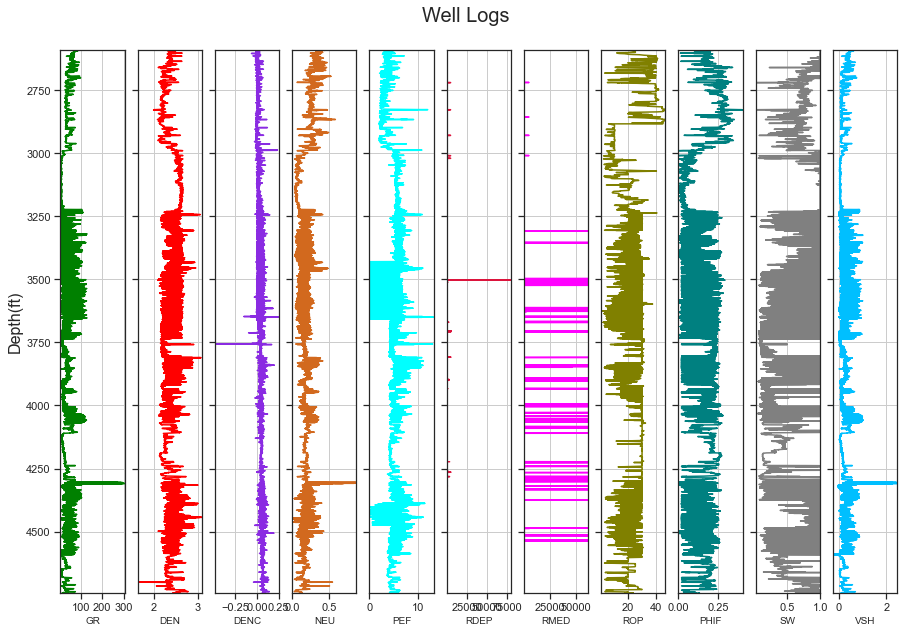

In [188]:
 log_plot(rawdata1)

In [189]:
rawdata1.shape

(42309, 17)

1. We create a new dataset called rawdata3
2. In this dataset, BS and WELLNUM were left out becuase they do not highly correlate with the target variable

In [190]:
rawdata3=rawdata1[['RMED','RDEP','SW','PHIF','GR','NEU','DEPTH','DTS','DTC','DEN','DENC','CALI','VSH','PEF','ROP']]
#BS and WELLNUM were left out becuase they do not highly correlate with the target variable

In [191]:
rawdata3.isna().sum()

RMED       0
RDEP     234
SW         0
PHIF       0
GR         0
NEU        3
DEPTH      0
DTS        0
DTC        0
DEN        0
DENC       0
CALI       0
VSH        0
PEF        0
ROP        0
dtype: int64

###### Now let us drop all the missing data in rawdata3, we would store this in a new dataset called rawdata_new

In [192]:
rawdata_new=rawdata3.dropna(how='any', inplace=False)

In [193]:
rawdata_new.isna().sum()### We clean missing values in rawdata3 to obtain rawdata_new

RMED     0
RDEP     0
SW       0
PHIF     0
GR       0
NEU      0
DEPTH    0
DTS      0
DTC      0
DEN      0
DENC     0
CALI     0
VSH      0
PEF      0
ROP      0
dtype: int64

#### rawdata_new is our new dataset which we would use for training of the model

### Lets analyze and visualize our new dataset

In [194]:
rawdata_new.shape

(42072, 15)

In [195]:
total = rawdata_new.isnull().sum().sort_values(ascending=False)
percent = (rawdata_new.isnull().sum()/rawdata_new.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(18)

,Total,Percent
RMED,0,0.0
RDEP,0,0.0
SW,0,0.0
PHIF,0,0.0
GR,0,0.0
NEU,0,0.0
DEPTH,0,0.0
DTS,0,0.0
DTC,0,0.0
DEN,0,0.0


<AxesSubplot:>

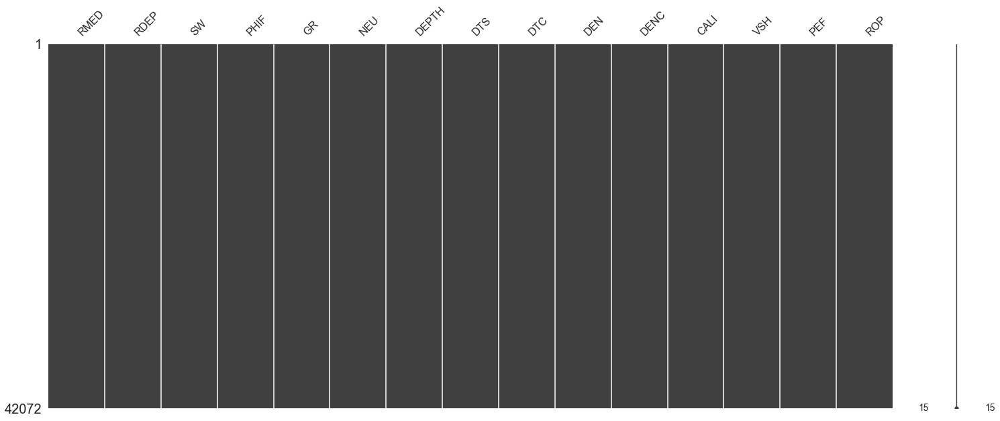

In [196]:
sns.set()
msno.matrix(rawdata_new)

In [197]:
# Statistics of the data 
rawdata_new.describe()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP
count,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000
mean,751.817593,25.201381,0.669053,0.141716,39.925769,0.181695,3731.042448,129.666065,77.657699,2.411121,0.046166,8.662779,0.275740,5.199298,23.394339
std,6637.276219,440.405525,0.354409,0.081228,24.868544,0.066884,489.613602,11.410070,10.310505,0.160803,0.022325,0.279899,0.207018,1.704930,7.691658
min,0.139400,0.129500,0.013000,0.000000,4.588597,-0.003400,2588.971117,74.822400,1.025100,1.626600,-0.487100,8.304600,-0.248000,-0.013100,0.337400
25%,1.523700,1.475500,0.300000,0.068200,20.020650,0.144200,3409.998659,122.728105,71.838910,2.264300,0.035400,8.556900,0.113200,4.604095,18.735050
50%,3.286912,2.785450,0.813400,0.141000,35.851850,0.176500,3628.198876,130.901545,76.531990,2.419700,0.048400,8.625000,0.233000,5.427910,24.971050
75%,10.936625,9.130000,1.000000,0.217000,52.064752,0.215700,4068.925184,137.067782,83.042510,2.544321,0.060100,8.671900,0.360625,6.111047,29.908000
max,62290.800000,80266.800000,1.000000,0.403294,304.333700,0.862567,4744.800112,193.840200,123.253500,3.089600,0.257450,11.904800,2.460104,13.356600,46.895400


145.9885322677028
9.05900251084225
1.5262268171282791
0.8733368526597695


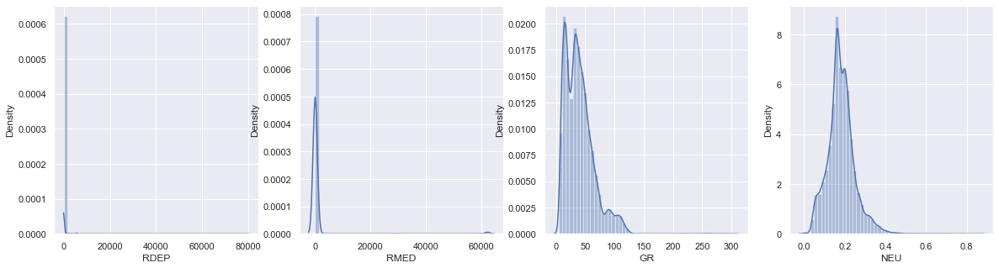

In [198]:
plt.figure(figsize = (20,5)) 
plt.subplot(1, 4, 1)  
sns.distplot(rawdata_new['RDEP'])
print(rawdata_new['RDEP'].skew())

plt.subplot(1, 4, 2)  
sns.distplot(rawdata_new['RMED'])
print(rawdata_new['RMED'].skew())

plt.subplot(1, 4, 3)  
sns.distplot(rawdata_new['GR'])
print(rawdata_new['GR'].skew())

plt.subplot(1, 4, 4)  
sns.distplot(rawdata_new['NEU'])
print(rawdata_new['NEU'].skew())

1. RDEP is almost uniformly distributed 
2. RMED and GR are right-skewed

0.05321373999968673
0.6685632962316985
0.11983641287598834
-0.595016883083922


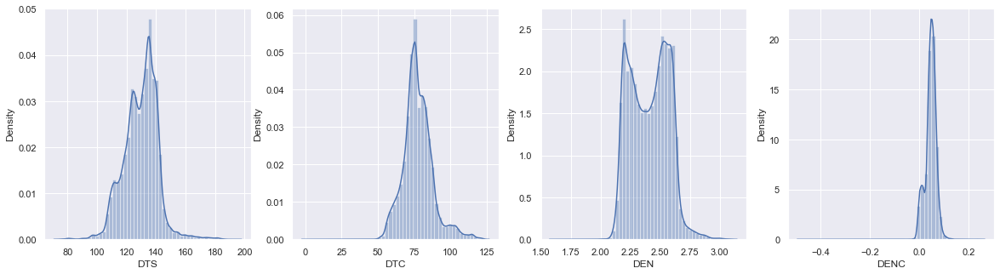

In [199]:
plt.figure(figsize = (20,5)) 
plt.subplot(1, 4, 1)  
sns.distplot(rawdata_new['DTS'])
print(rawdata_new['DTS'].skew())

plt.subplot(1, 4, 2)  
sns.distplot(rawdata_new['DTC'])
print(rawdata_new['DTC'].skew())

plt.subplot(1, 4, 3)  
sns.distplot(rawdata_new['DEN'])
print(rawdata_new['DEN'].skew())

plt.subplot(1, 4, 4)  
sns.distplot(rawdata_new['DENC'])
print(rawdata_new['DENC'].skew())

1. NEU, DTS and DTC are fairly normally distributed

-1.0973765726274136
0.05321373999968673
6.901334767216428
1.7292309373870278


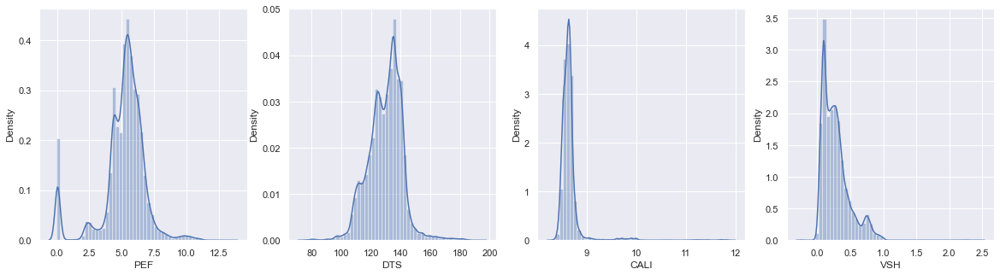

In [200]:
plt.figure(figsize = (20,5)) 

plt.subplot(1, 4, 1)  
sns.distplot(rawdata_new['PEF'])
print(rawdata_new['PEF'].skew())

plt.subplot(1, 4, 2)  
sns.distplot(rawdata_new['DTS'])
print(rawdata_new['DTS'].skew())

plt.subplot(1, 4, 3)  
sns.distplot(rawdata_new['CALI'])
print(rawdata_new['CALI'].skew())

plt.subplot(1, 4, 4)  
sns.distplot(rawdata_new['VSH'])
print(rawdata_new['VSH'].skew())

1. Density log (DEN) is bimodal, Corrected density log (DENC) is fairly normally distributed and Photoelectric factor (PEF) bimodal as well 

0.17565140995179881
0.019139239548716217
-0.44427048625401516
-0.4633657652518074


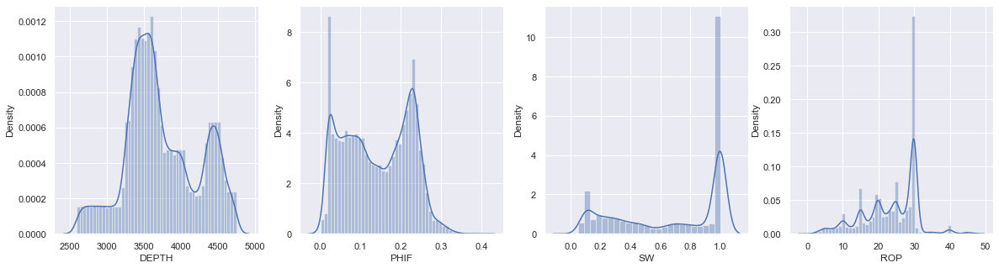

In [201]:
plt.figure(figsize = (20,5)) 
plt.subplot(1, 4, 1)  
sns.distplot(rawdata_new['DEPTH'])
print(rawdata_new['DEPTH'].skew())

plt.subplot(1, 4, 2)  
sns.distplot(rawdata_new['PHIF'])
print(rawdata_new['PHIF'].skew())

plt.subplot(1, 4, 3)  
sns.distplot(rawdata_new['SW'])
print(rawdata_new['SW'].skew())

plt.subplot(1, 4, 4)  
sns.distplot(rawdata_new['ROP'])
print(rawdata_new['ROP'].skew())

1. DTS is failry normal, CALI is right skewed and VSH is right-skewed as well

1. All four paramters have more than one modes

#### Boxplots

<AxesSubplot:>

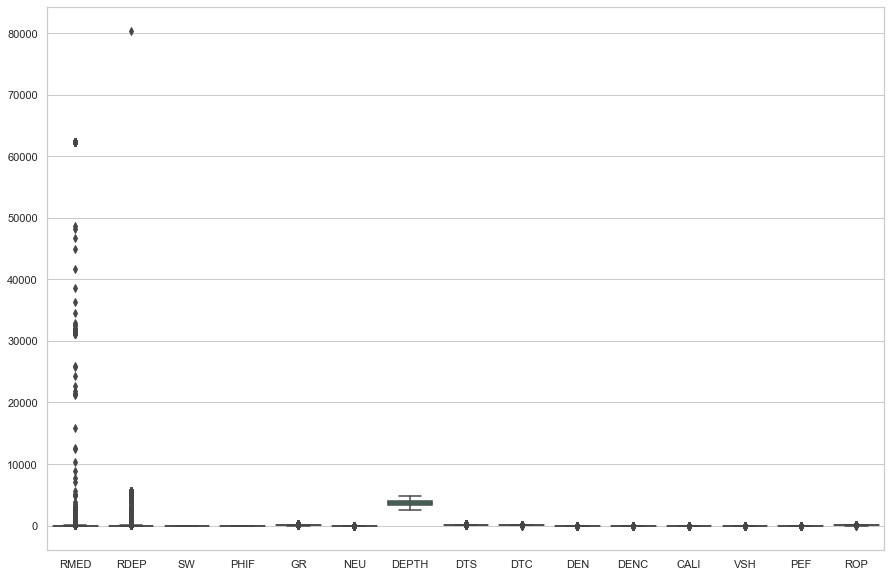

In [202]:
plt.figure(figsize=(15,10))
sns.set(style="whitegrid")
sns.boxplot(data=rawdata_new)
#plt.show()

1. Plotting all the boxplots does not reveal the true nature of the individual datasets due to large variations in the measurements. 
2. Let us plot them idividually

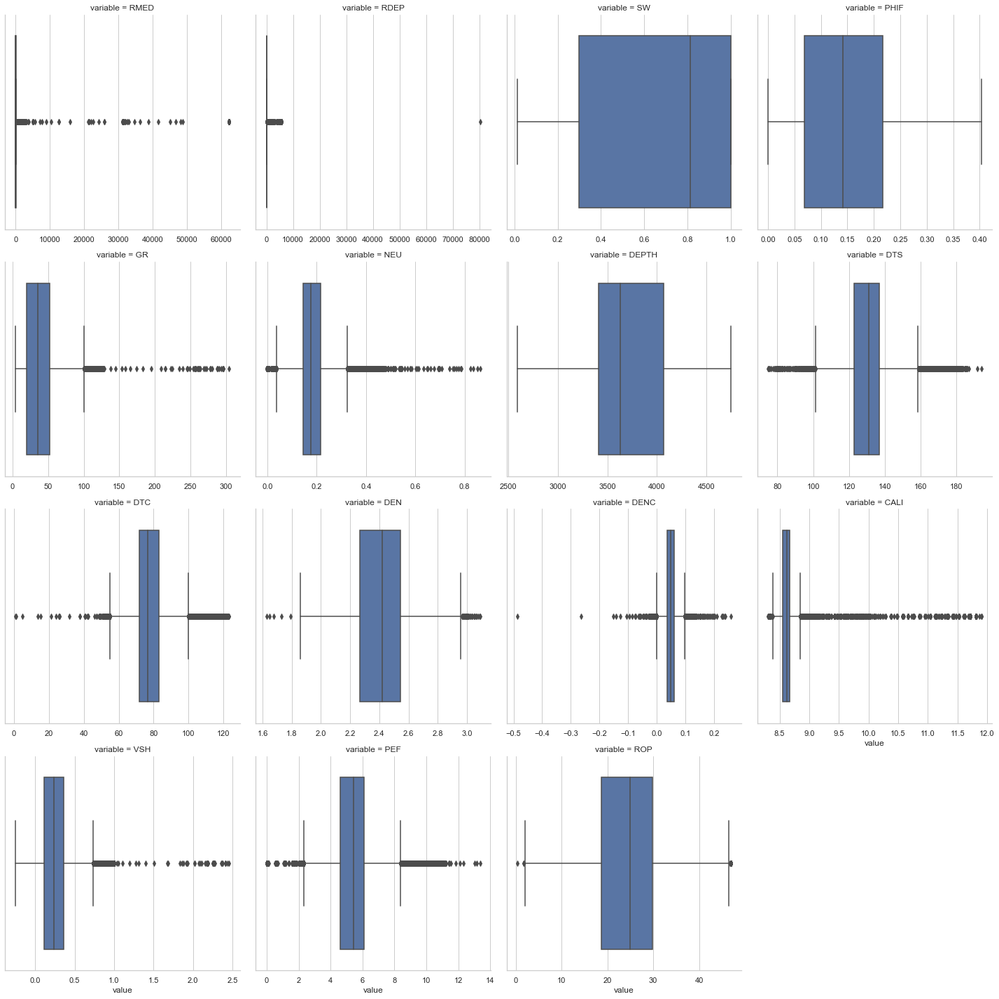

In [203]:
box_melt_rawdata_new = rawdata_new.melt(var_name='variable', value_name='value')
g = sns.catplot(data = box_melt_rawdata_new, x = 'value', col = 'variable', kind = 'box', sharex = False, col_wrap = 4)

In [204]:
#columns = ['RMED','RDEP','SW','PHIF','GR','NEU','DEPTH','DTS','DTC','DEN','DENC','CALI','VSH','PEF']
#def plot_boxplots(rawdata_new, cols):
#    for col in cols:
#        plt.figure(figsize = (10,5))
#        sns.boxplot(col, data=rawdata_new, palette="Set1")
#        plt.show()

#plot_boxplots(rawdata_new, columns)

### VIOLIN PLOTS

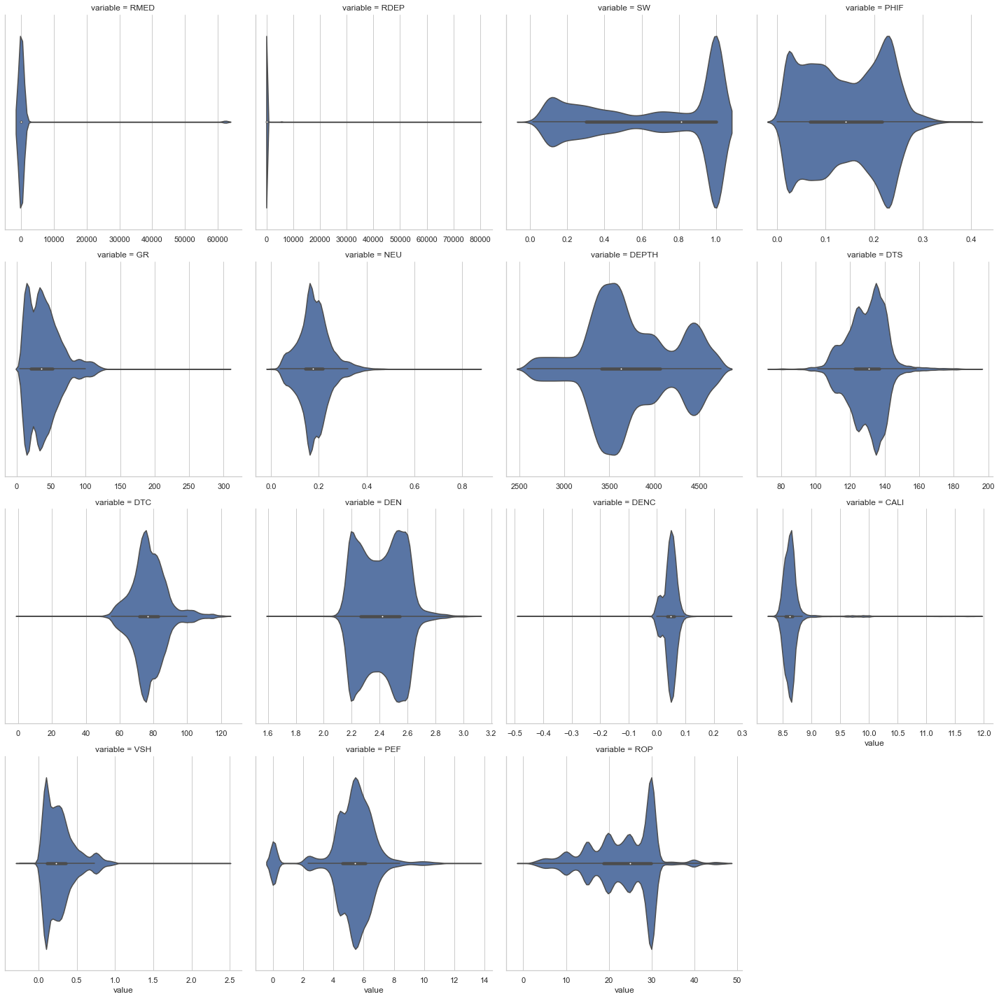

In [205]:
viol_melt_rawdata_new = rawdata_new.melt(var_name='variable', value_name='value')
g = sns.catplot(data = viol_melt_rawdata_new, x = 'value', col = 'variable', kind = 'violin', sharex = False, col_wrap = 4)

In [206]:
#columns = ['RMED','RDEP','SW','PHIF','GR','NEU','DEPTH','DTS','DTC','DEN','DENC','CALI','VSH','PEF']
#def plot_violinplots(rawdata_new, cols):
  #  for col in cols:
  #      plt.figure(figsize = (10,5))
  #      sns.violinplot(col, data=rawdata_new, palette="Set1")
  #      plt.show()

#plot_violinplots(rawdata_new, columns)

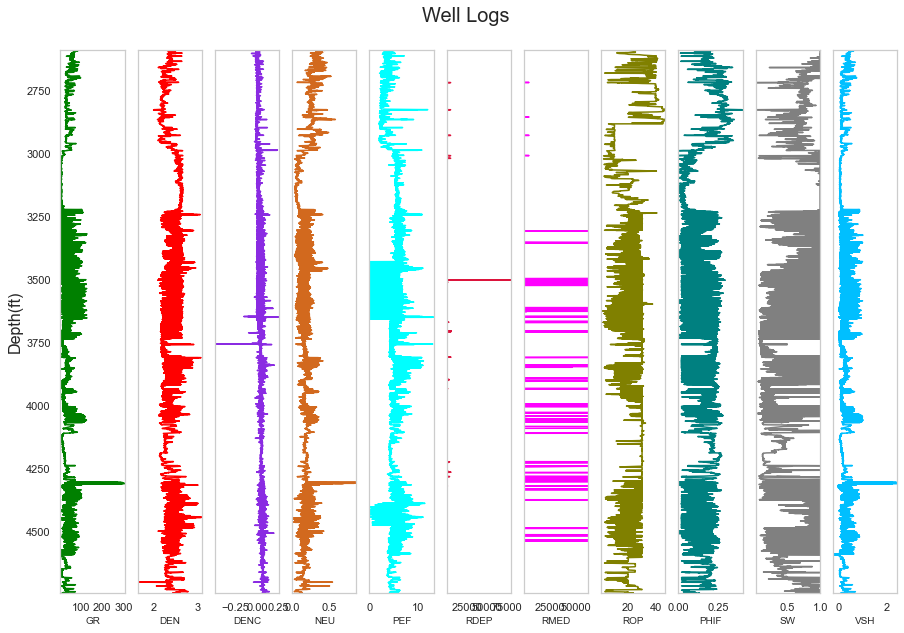

In [207]:
 log_plot(rawdata_new)

In [208]:
rawdata_new.describe()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP
count,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000,42072.000000
mean,751.817593,25.201381,0.669053,0.141716,39.925769,0.181695,3731.042448,129.666065,77.657699,2.411121,0.046166,8.662779,0.275740,5.199298,23.394339
std,6637.276219,440.405525,0.354409,0.081228,24.868544,0.066884,489.613602,11.410070,10.310505,0.160803,0.022325,0.279899,0.207018,1.704930,7.691658
min,0.139400,0.129500,0.013000,0.000000,4.588597,-0.003400,2588.971117,74.822400,1.025100,1.626600,-0.487100,8.304600,-0.248000,-0.013100,0.337400
25%,1.523700,1.475500,0.300000,0.068200,20.020650,0.144200,3409.998659,122.728105,71.838910,2.264300,0.035400,8.556900,0.113200,4.604095,18.735050
50%,3.286912,2.785450,0.813400,0.141000,35.851850,0.176500,3628.198876,130.901545,76.531990,2.419700,0.048400,8.625000,0.233000,5.427910,24.971050
75%,10.936625,9.130000,1.000000,0.217000,52.064752,0.215700,4068.925184,137.067782,83.042510,2.544321,0.060100,8.671900,0.360625,6.111047,29.908000
max,62290.800000,80266.800000,1.000000,0.403294,304.333700,0.862567,4744.800112,193.840200,123.253500,3.089600,0.257450,11.904800,2.460104,13.356600,46.895400


### Pairplots 

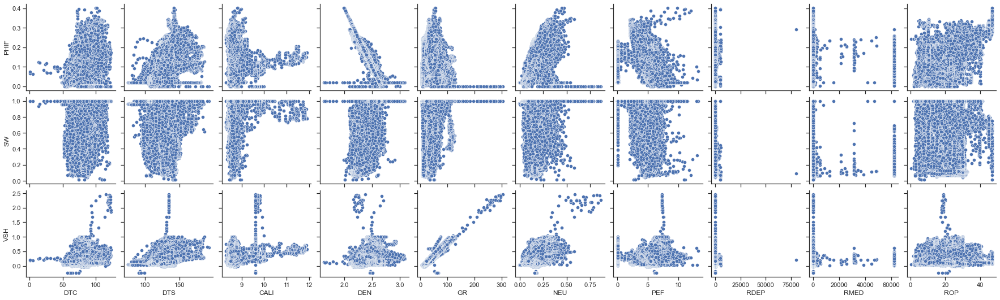

In [209]:
sns.set(style = 'ticks')
sns.pairplot(rawdata_new, x_vars = ['DTC', 'DTS', 'CALI', 'DEN', 'GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'ROP'], y_vars = ['PHIF','SW','VSH']);

1. The distributions plotted above show some significant number of outliers. Let us explore them .

In [210]:
#!pip install pandas-profiling

In [211]:
#from pandas_profiling import ProfileReport
#design_report = ProfileReport(rawdata_new)
#design_report.to_file(output_file='Lith_report_profile.html')

In [212]:
#!pip install sweetviz

In [213]:
#import sweetviz as sv
#sweet_report = sv.analyze(rawdata_new)
#sweet_report.show_html('Lith_report_sweet.html')

### Outlier Detection and Removal 

In [214]:
# Use isolation forest to detect outliers

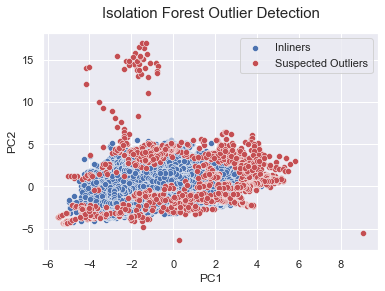

In [215]:
# Use Isolation Forest to detect the prescence of outliers
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set_style("darkgrid")

XI = rawdata_new.values #returns a numpy array with the underlying data without column names nor indeces. 

iforest = IsolationForest(n_estimators=100, max_samples='auto', 
                          contamination=0.03, max_features=1.0, 
                          bootstrap=False, n_jobs=-1, random_state=1)

# Returns 1 of inliers, -1 for outliers
pred = iforest.fit_predict(XI)

# Extract outliers
outlier_index = np.where(pred==-1)
outlier_values = XI[outlier_index] # The anomalies are predicted with values of -1. 

# Feature scaling 
sc=StandardScaler()
XI_scaled = sc.fit_transform(XI)
outlier_values_scaled = sc.transform(outlier_values)

#Apply PCA to reduce the dimensionality
pca = PCA(n_components=2)
XI_pca = pca.fit_transform(XI_scaled)
outlier_values_pca = pca.transform(outlier_values_scaled)

# Plot the data
sns.scatterplot(x=XI_pca[:,0], y=XI_pca[:,1])
sns.scatterplot(x=outlier_values_pca[:,0], 
                y=outlier_values_pca[:,1], color='r')
plt.title("Isolation Forest Outlier Detection", 
           fontsize=15, pad=15)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(['Inliners','Suspected Outliers'])

In [216]:
#pred_df=pd.DataFrame(pred, columns=['Predictions'])

In [217]:
#pred_df

### Let us try DB-SCAN

from sklearn.cluster import DBSCAN

DI = rawdata_new.values #returns a numpy array with the underlying data without column names nor indeces.
# Create DBSCAN model with parameters
DB_model = DBSCAN(eps=0.5,min_samples=2) #metric= 'euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)

pred_DB = DB_model.fit_predict(DI)
# Extract outliers
outlier_index1 = np.where(pred_DB==-1)
outlier_values1 = DI[outlier_index1] # The anomalies are predicted with values of -1. 

# Feature scaling 
sc=StandardScaler()
DI_scaled1 = sc.fit_transform(DI)
outlier_values_scaled1 = sc.transform(outlier_values1)

#Apply PCA to reduce the dimensionality
pca = PCA(n_components=2)
DI_pca1 = pca.fit_transform(DI_scaled1)
outlier_values_pca1 = pca.transform(outlier_values_scaled1)

# Plot the data
sns.scatterplot(x=DI_pca1[:,0], y=DI_pca1[:,1])
sns.scatterplot(x=outlier_values_pca1[:,0], 
               y=outlier_values_pca1[:,1], color='r')
plt.title("Isolation Forest Outlier Detection", 
           fontsize=15, pad=15)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(['Inliners','Suspected Outliers'])


##### DB Scan works best for nominal data

In [218]:
#pred_DB_df= pd.DataFrame(pred_DB, columns=['Predictions'])

In [219]:
#pred_DB_df.describe()

The isolation forest method has shown that indeed we have a significant number of outliers. 

1. We have significant number of outliers in the following logs; NEU, GR, RMED, CALI, VSH, PEF, DENC, DTS and DTC as seen in the plots. 

### Outlier Removal Techniques

1. We are going to address two outlier removal techniques and see the effects of both of them in model prediction 

a. The Z-score method
b. The percentile method. 

### Z-score

1. Let us define a new dataset cleaned based on the z-score of all paramters in the data.

In [220]:
from scipy import stats
rawd_zscore= rawdata_new[(np.abs(stats.zscore(rawdata_new)) < 3).all(axis=1)]

##### We just cleaned up the dataset rawdata_new to contain values with z-score <2.5 for all columns

Let us look at the shapes of rawdata_new and rawd_zscore

In [221]:
rawdata_new.shape

(42072, 15)

In [222]:
rawd_zscore.shape # The data size has been significantly reduced

(36526, 15)

In [223]:
# We have a significant reduction in the data size, now lets visualize

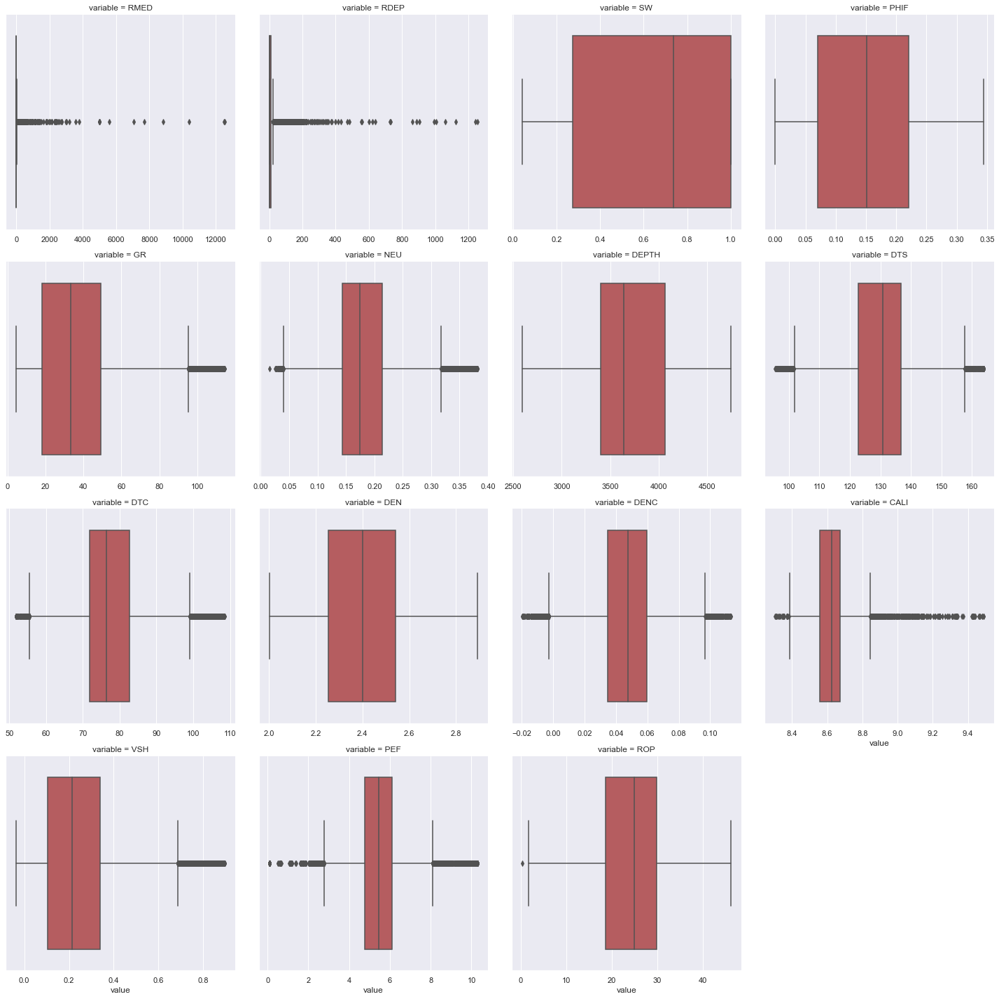

In [224]:
zcore_melt = rawd_zscore.melt(var_name='variable', value_name='value')
g = sns.catplot(data = zcore_melt, x = 'value', col = 'variable', kind = 'box', sharex = False, col_wrap = 4, color='r')

#### Let us see what the pairplots shows

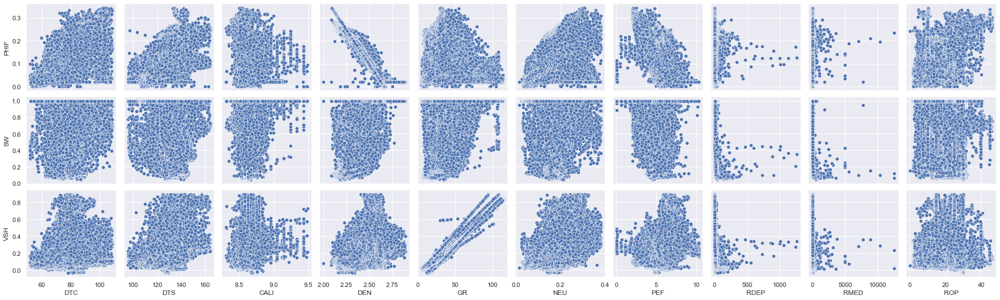

In [225]:
sns.pairplot(rawd_zscore, x_vars = ['DTC', 'DTS', 'CALI', 'DEN', 'GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'ROP'], y_vars = ['PHIF','SW','VSH']);

In [226]:
# Lets cross-check with the isolation forest algorithm 


In [227]:
# We can see that the number of outliers have significantly reduced.

In [228]:
#from scipy import stats
#Selecting a subset of the dataset with significant outliers
#subset_rawdata_new= rawdata_new[['NEU', 'GR', 'RMED', 'CALI', 'VSH', 'PEF', 'DENC', 'DTS', 'DTC','RDEP']]

#subset_rawdata_new = subset_rawdata_new[(np.abs(stats.zscore(subset_rawdata_new)) < 10).all(axis=1)]

# We define a new data set called rawdata_new_z_scored with the z-scored data. 
#rawdata_new_z_scored = rawdata_new.merge(subset_rawdata_new,on=['NEU', 'GR', 'RMED', 'CALI', 'VSH', 'PEF', 'DENC', 'DTS', 'DTC','RDEP'])

In [229]:
### Let us see the effects of outlier removal 

#columns = ['RMED','RDEP','SW','PHIF','GR','NEU','DEPTH','DTS','DTC','DEN','DENC','CALI','VSH','PEF']
#def plot_boxplots(rawd_zscore, cols):
 #   for col in cols:
#        plt.figure(figsize = (10,5))
#        sns.boxplot(col, data=rawd_zscore, palette="Set1")
 #       plt.show()

#plot_boxplots(rawd_zscore, columns)

#### outliers have been significantly removed. 

In [230]:
rawdata_new.shape # Lets check the shape of rawdata_new and compare with rawd_zscore

(42072, 15)

In [231]:
rawd_zscore.shape ## A significant amount of the data has been removed; About 2781

(36526, 15)

### Percentile Method

In [232]:
# Let us define the maximum threshold for all the parameters
#max_threshold=rawdata_new.quantile(0.95)

In [233]:
#max_threshold

In [234]:
#min_threshold = rawdata_new.quantile(0.05)

In [235]:
#min_threshold

In [236]:
#rawdata_quant=rawdata_new[rawdata_new['']<max_threshold

In [237]:
#np_max_threshold=max_threshold.to_numpy()

In [238]:
#max_threshold_df=pd.DataFrame(np_max_threshold, columns=['Values'])

In [239]:
#max_threshold_df.head()

In [240]:
#max_threshold_df.rename(index={0:'RMED'})

In [241]:
#min_threshold_df.set_index("Logs", inplace = True)
#rawdata_new[rawdata_new['DEPTH']<max_threshold['name of the index','Name of the column with the values']]

In [242]:
#max_threshold.set_index("DEPTH", inplace = True)

In [243]:
### Continue later. 

In [244]:
#max_threshold.set_index("DEPTH", inplace = True)
#rawdata_new[rawdata_new['DEPTH']<max_threshold['name of the index','Name of the column with the values']]

In [245]:
#max_threshold.set_index("name of the index", inplace = True)
#rawdata_new[rawdata_new['DEPTH']<max_threshold['name of the index','Name of the column with the values']]

### Test Data Preparation

In [645]:
test_raw= pd.read_csv('Test.csv')

In [646]:
test_raw.shape

(11275, 14)

##### The data has 11274 rows and 14 columns

In [647]:
test_raw.describe()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP
count,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000,11275.000000
mean,102.011086,12643.576541,-509.077755,-6479.740939,8.525942,8.534996,-70.324669,-72.694420,65.895769,-3.336822,-68.613773,-36.236767,-32.681697,-4303.156711
std,1.643594,2516.270914,2368.360461,4829.300710,0.310837,0.189920,849.853859,849.651005,56.261780,188.312731,850.001489,867.608657,879.483078,4976.927245
min,100.000000,10177.500000,-9999.000000,-9999.000000,8.500000,8.250000,-9999.000000,-9999.000000,3.985964,-9999.000000,-9999.000000,-9999.000000,-9999.000000,-9999.000000
25%,100.000000,10869.500000,72.247600,-9999.000000,8.500000,8.358610,2.269458,0.003207,30.106430,0.163874,3.064271,1.719360,1.685470,-9999.000000
50%,101.000000,11343.000000,81.822500,-9999.000000,8.500000,8.512500,2.443988,0.019000,53.767100,0.202947,3.892648,2.839570,2.732343,19.016170
75%,104.000000,16034.250000,88.451850,139.140850,8.500000,8.651935,2.538193,0.041436,94.247650,0.241950,5.017876,8.112067,7.816489,28.633825
max,104.000000,17443.500000,125.394000,190.263000,12.250000,9.314860,3.201297,0.192256,1711.420000,0.732381,15.135460,5000.000000,5000.000000,300.110700


In [648]:
test_raw.isna().sum()

WELLNUM    0
DEPTH      0
DTC        0
DTS        0
BS         0
CALI       0
DEN        0
DENC       0
GR         0
NEU        0
PEF        0
RDEP       0
RMED       0
ROP        0
dtype: int64

In [649]:
test_raw.head(20)

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP
0,100,15912.5,65.46309,-9999.0,8.5,8.275658,2.545791,0.051429,9.791040,0.134139,5.858729,2.881351,2.645010,262.2817
1,100,15913.0,64.56976,-9999.0,8.5,8.275658,2.524871,0.043547,11.278870,0.111488,6.021325,2.881351,2.645010,262.0370
2,100,15913.5,64.43656,-9999.0,8.5,8.275658,2.507431,0.037683,9.954506,0.112143,6.060280,3.027379,2.928987,261.9881
3,100,15914.0,65.03485,-9999.0,8.5,8.275658,2.575224,0.064832,8.630137,0.114846,6.202412,3.054653,2.974949,261.7196
4,100,15914.5,65.13235,-9999.0,8.5,8.286819,2.550074,0.017329,7.305769,0.116967,5.179704,3.054653,2.974949,261.5247
5,100,15915.0,64.32072,-9999.0,8.5,8.286819,2.550074,0.017329,8.467904,0.116962,5.179704,3.045108,2.975753,261.4274
6,100,15915.5,63.38940,-9999.0,8.5,8.286819,2.550074,0.017329,9.630041,0.125625,5.179704,3.045360,2.968783,261.4274
7,100,15916.0,65.38040,-9999.0,8.5,8.334252,2.550074,0.017329,10.792180,0.136781,5.179704,3.045360,2.968783,261.1357
8,100,15916.5,68.65218,-9999.0,8.5,8.334252,2.550074,0.017329,11.267710,0.136785,5.179704,3.047688,2.979694,261.1843
9,100,15917.0,69.54514,-9999.0,8.5,8.334252,2.548068,0.014733,11.743250,0.120607,5.188026,3.061228,2.970245,261.0872


In [650]:
test_raw['DEPTH']= test_raw['DEPTH'].div(3.28084) 

##### Cleaning Test Data

1. Replace all the -999 values with 'NAN' just like the training datatset

In [651]:
test_raw.replace(['-9999', -9999], np.nan, inplace=True) # replacinhg all -999 values with nan

In [652]:
test_raw.isna().sum()

WELLNUM       0
DEPTH         0
DTC         661
DTS        7364
BS            0
CALI          0
DEN          82
DENC         82
GR            0
NEU           4
PEF          82
RDEP         77
RMED         77
ROP        4881
dtype: int64

In [653]:
test_raw.shape

(11275, 14)

<AxesSubplot:>

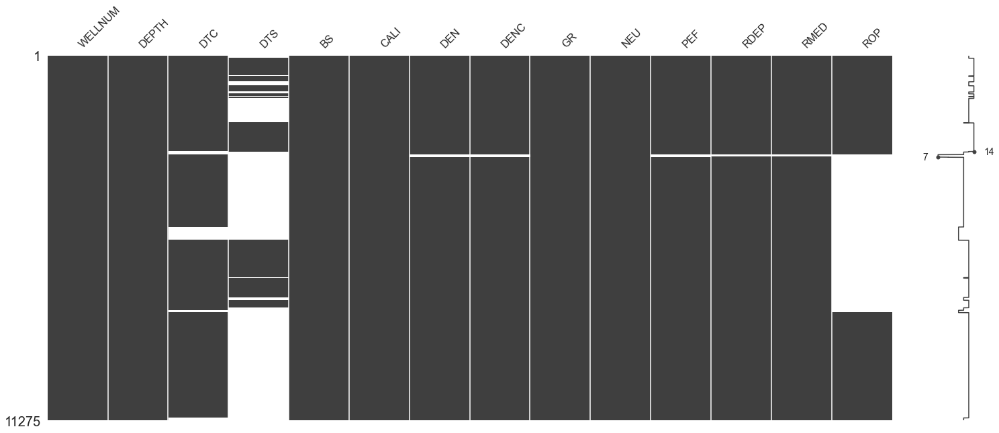

In [654]:
# Let us visualize the missing values
sns.set()
msno.matrix(test_raw)

In [655]:
# Determine the percentage of missing variables
total = test_raw.isnull().sum().sort_values(ascending=False)
percent1 = (test_raw.isnull().sum()/test_raw.isnull().count()).sort_values(ascending=False)
missing_data1 = pd.concat([total, percent1], axis=1, keys=['Total', 'Percent'])
missing_data1.head(18)

,Total,Percent
DTS,7364,0.653126
ROP,4881,0.432905
DTC,661,0.058625
DEN,82,0.007273
DENC,82,0.007273
PEF,82,0.007273
RDEP,77,0.006829
RMED,77,0.006829
NEU,4,0.000355
WELLNUM,0,0.000000


#### Missing values
1.  Missing values can be found in DTS, ROP, and DTC; and minute missing values PEF,RDEP, RMED, DEN, DENC
2. We would remove minute missing values, and predict major missing values

In [656]:
#### First remove all minute missing data
colss= ['DEN', 'DENC', 'PEF','RDEP','RMED','NEU']
test_raw.dropna(axis=0, subset=colss, inplace=True)
test_raw.shape

(11189, 14)

1. We would repeat the same steps as seen in the training dataset for the test dataset

<AxesSubplot:>

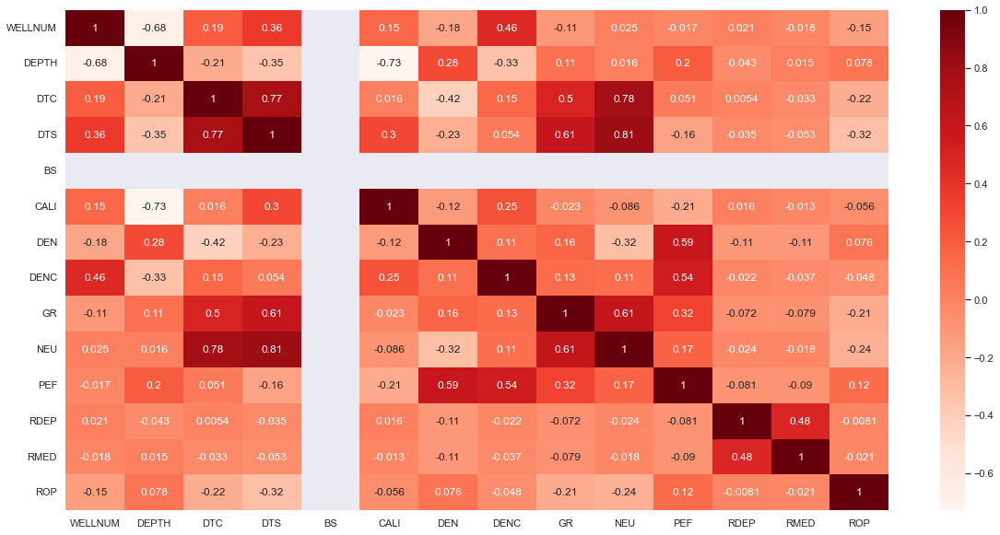

In [657]:
plt.figure(figsize=(20,10))
sns.heatmap(test_raw.corr(),cbar=True,annot=True,cmap='Reds')

In [658]:
### We make a copy of test_raw

In [659]:
test_raw1=test_raw.copy(deep= True)
# We copy testraw into a new dataset called test_raw1

#### Predicting Missing values for DTS

In [660]:
predictions_test=test_raw1[['RMED', 'GR', 'DEPTH', 'DEN', 'CALI','DTS']] 
# We select these paramters for the predictions because they have good correlations with the target variable and have no NAN values.

In [661]:
predictions_test.shape

(11189, 6)

In [662]:
filt_dts=predictions_test[predictions_test["DTS"].isna()] #### Selecting all rows with NAN values for DTS

In [663]:
filt_dts.head()

,RMED,GR,DEPTH,DEN,CALI,DTS
0,2.645010,9.791040,4850.129845,2.545791,8.275658,NaN
1,2.645010,11.278870,4850.282245,2.524871,8.275658,NaN
2,2.928987,9.954506,4850.434645,2.507431,8.275658,NaN
3,2.974949,8.630137,4850.587045,2.575224,8.275658,NaN
4,2.974949,7.305769,4850.739445,2.550074,8.286819,NaN


In [664]:
filt_dts.isna().sum()

RMED        0
GR          0
DEPTH       0
DEN         0
CALI        0
DTS      7279
dtype: int64

##### All the DTS values here are NAN values and these are what is to be predicted

In [665]:
dts_predictions_train=predictions_test.dropna(how='any', inplace=False)

In [666]:
dts_predictions_train.shape

(3910, 6)

In [667]:
dts_predictions_train.head() ## We would use this data in training the model to predict DTS

,RMED,GR,DEPTH,DEN,CALI,DTS
86,2.235727,13.45821,4863.236244,2.441226,8.334252,144.5682
87,2.239118,14.56724,4863.388644,2.439294,8.334252,143.4256
88,2.236284,14.23011,4863.541044,2.508114,8.334252,142.4907
89,2.246675,13.89299,4863.693444,2.505975,8.334252,141.5540
90,2.380001,13.55586,4863.845844,2.525329,8.334252,140.6862


In [668]:
# Multicollinearity
vif_data2 = pd.DataFrame()# Create an empty dataFrame 
vif_data2["feature"] = dts_predictions_train.columns
vif_data2["VIF"] = [variance_inflation_factor(dts_predictions_train.values, i) for i in range(len(dts_predictions_train.columns))]
vif_data2

,feature,VIF
0,RMED,1.045678
1,GR,6.529550
2,DEPTH,31.091269
3,DEN,367.532140
4,CALI,678.234777
5,DTS,217.698837


##### Using a VIF threshold of 100, We take CALI and DEN out of the predictors

In [669]:
train_data_x_dts_a = dts_predictions_train[['RMED', 'GR', 'DEPTH']]

In [670]:
# Scale training data
train_data_x_DTS_np =train_data_x_dts_a[['RMED', 'GR', 'DEPTH']].to_numpy()                    
train_data_x_DTS_scaled = scaler.fit_transform(train_data_x_DTS_np)                              
train_data_x_DTS_scaled_df = pd.DataFrame (train_data_x_DTS_scaled, columns = ['RMED', 'GR', 'DEPTH'])

In [671]:
train_data_x_DTS_scaled_df.head()

,RMED,GR,DEPTH
0,-0.101281,-0.953386,0.756543
1,-0.101272,-0.924085,0.756713
2,-0.101279,-0.932992,0.756883
3,-0.101252,-0.941899,0.757053
4,-0.100903,-0.950806,0.757223


In [672]:
train_data_y_DTS= dts_predictions_train[['DTS']]

In [673]:
x_train_DTS=train_data_x_DTS_scaled_df.to_numpy()

y_train_DTS=train_data_y_DTS.to_numpy()

In [674]:
filt_dts.shape

(7279, 6)

In [675]:
test_data_DTS=filt_dts[['RMED', 'GR', 'DEPTH']]

In [676]:
#test_data_DTS.isna().sum()

In [677]:
#### Machine Learning Model
K_reg_DTS = neighbors.KNeighborsRegressor(n_neighbors = 10)

In [678]:
K_reg_DTS.fit(x_train_DTS,y_train_DTS)

KNeighborsRegressor(n_neighbors=10)

In [679]:
train1_R2_DTS1 = K_reg_DTS.score(x_train_DTS, y_train_DTS)
print(train1_R2_DTS1)

0.8399900630382218


In [680]:
#Scaling test data
test_data_DTS_np =test_data_DTS[['RMED','GR', 'DEPTH']].to_numpy()                    
test_data_DTS_scaled = scaler.fit_transform(test_data_DTS_np)                              
test_data_DTS_scaled_df = pd.DataFrame (test_data_DTS_scaled, columns = ['RMED', 'GR', 'DEPTH'])

In [681]:
x_test_DTS=test_data_DTS_scaled_df.to_numpy()

In [682]:
predicted_DTS=K_reg_DTS.predict(x_test_DTS)

predicted_df_DTS=pd.DataFrame(predicted_DTS)

In [683]:
predicted_df_DTS.head(20)

,0
0,136.73971
1,136.73971
2,136.73971
3,136.73971
4,136.73971
5,136.73971
6,136.73971
7,136.73971
8,136.73971
9,136.73971


In [684]:
predicted_df_DTS.rename(columns={0: "DTS"}, inplace=True)

In [685]:
predicted_df_DTS_list=predicted_df_DTS.values.tolist()

In [686]:
test_raw.loc[test_raw.DTS.isna(),'DTS']=predicted_df_DTS_list

In [687]:
test_raw.isna().sum()

WELLNUM       0
DEPTH         0
DTC         661
DTS           0
BS            0
CALI          0
DEN           0
DENC          0
GR            0
NEU           0
PEF           0
RDEP          0
RMED          0
ROP        4799
dtype: int64

#### Predicting DTC

In [688]:
predictions_test_dtc=test_raw1[['RMED', 'GR', 'DEPTH', 'DEN', 'CALI','DTC']] 
# We select these paramters for the predictions because they have good correlations with the target variable and have no NAN values.

In [689]:
predictions_test_dtc.shape

(11189, 6)

In [690]:
filt_dtc=predictions_test_dtc[predictions_test_dtc["DTC"].isna()] #### Selecting all rows with NAN values for DTS

In [691]:
filt_dtc.head() ### Selecting all the rows with DTC values equal to NAN

,RMED,GR,DEPTH,DEN,CALI,DTC
2965,1.866879,96.85349,5301.99583,2.577677,8.318447,NaN
2966,1.833631,97.27216,5302.14823,2.578374,8.318093,NaN
2967,1.836340,97.11747,5302.30063,2.567743,8.308908,NaN
2968,1.809502,99.88741,5302.45303,2.565326,8.327161,NaN
2969,1.797831,100.82920,5302.60543,2.568822,8.320154,NaN


In [692]:
filt_dtc.isna().sum()

RMED       0
GR         0
DEPTH      0
DEN        0
CALI       0
DTC      661
dtype: int64

In [693]:
dtc_predictions_train=predictions_test_dtc.dropna(how='any', inplace=False)
dtc_predictions_train.shape

(10528, 6)

In [694]:
dtc_predictions_train.head()

,RMED,GR,DEPTH,DEN,CALI,DTC
0,2.645010,9.791040,4850.129845,2.545791,8.275658,65.46309
1,2.645010,11.278870,4850.282245,2.524871,8.275658,64.56976
2,2.928987,9.954506,4850.434645,2.507431,8.275658,64.43656
3,2.974949,8.630137,4850.587045,2.575224,8.275658,65.03485
4,2.974949,7.305769,4850.739445,2.550074,8.286819,65.13235


In [695]:
# Multicollinearity
vif_data2_dtc = pd.DataFrame()# Create an empty dataFrame 
vif_data2_dtc["feature"] = dtc_predictions_train.columns
vif_data2_dtc["VIF"] = [variance_inflation_factor(dtc_predictions_train.values, i) for i in range(len(dtc_predictions_train.columns))]
vif_data2_dtc

,feature,VIF
0,RMED,1.037426
1,GR,3.614758
2,DEPTH,29.156951
3,DEN,356.239531
4,CALI,509.147691
5,DTC,91.363656


##### Using a VIF threshold of 100, We take CALI and DEN out of the predictors

In [696]:
train_data_x_dtc_a = dtc_predictions_train[['RMED', 'GR', 'DEPTH']]

In [697]:
# Scale training data
train_data_x_DTC_np =train_data_x_dtc_a[['RMED', 'GR', 'DEPTH']].to_numpy()                    
train_data_x_DTC_scaled = scaler.fit_transform(train_data_x_DTC_np)                              
train_data_x_DTC_scaled_df = pd.DataFrame (train_data_x_DTC_scaled, columns = ['RMED', 'GR', 'DEPTH'])

In [698]:
train_data_x_DTC_scaled_df.head()

,RMED,GR,DEPTH
0,-0.113846,-0.954720,1.275358
1,-0.113846,-0.929051,1.275555
2,-0.112933,-0.951899,1.275752
3,-0.112786,-0.974748,1.275949
4,-0.112786,-0.997597,1.276146


In [699]:
train_data_y_DTC= dtc_predictions_train[['DTC']]

In [700]:
#train_data_y_DTC.head()

In [701]:
x_train_DTC=train_data_x_DTC_scaled_df.to_numpy()

y_train_DTC=train_data_y_DTC.to_numpy()

In [702]:
filt_dtc.shape

(661, 6)

In [703]:
test_data_DTC=filt_dtc[['RMED', 'GR', 'DEPTH']]

K_reg_DTC = neighbors.KNeighborsRegressor(n_neighbors = 10)

K_reg_DTC.fit(x_train_DTC,y_train_DTC)

KNeighborsRegressor(n_neighbors=10)

In [704]:
train1_R2_DTC1 = K_reg_DTC.score(x_train_DTC, y_train_DTC)
print(train1_R2_DTC1)

0.8724691756677782


In [705]:
#Scaling test data
test_data_DTC_np =test_data_DTC[['RMED','GR', 'DEPTH']].to_numpy()                    
test_data_DTC_scaled = scaler.fit_transform(test_data_DTC_np)                              
test_data_DTC_scaled_df = pd.DataFrame (test_data_DTC_scaled, columns = ['RMED', 'GR', 'DEPTH'])

x_test_DTC=test_data_DTC_scaled_df.to_numpy()

predicted_DTC=K_reg_DTC.predict(x_test_DTC)

predicted_df_DTC=pd.DataFrame(predicted_DTC)

In [706]:
#predicted_df_DTC.head(20)

In [707]:
predicted_df_DTC.rename(columns={0: "DTC"}, inplace=True)

In [708]:
predicted_df_DTC_list=predicted_df_DTC.values.tolist()

In [709]:
test_raw.loc[test_raw.DTC.isna(),'DTC']=predicted_df_DTC_list

In [710]:
test_raw.isna().sum()

WELLNUM       0
DEPTH         0
DTC           0
DTS           0
BS            0
CALI          0
DEN           0
DENC          0
GR            0
NEU           0
PEF           0
RDEP          0
RMED          0
ROP        4799
dtype: int64

#### Predicting ROP

In [711]:
predictions_test_rop=test_raw1[['RMED', 'GR', 'DEPTH', 'DEN', 'CALI','ROP']] 
# We select these paramters for the predictions because they have good correlations with the target variable and have no NAN values.

In [712]:
predictions_test_rop.shape

(11189, 6)

In [713]:
filt_ROP=predictions_test_rop[predictions_test_rop["ROP"].isna()] #### Selecting all rows with NAN values for DTS

filt_ROP.head() ### Selecting all the rows with DTC values equal to NAN

,RMED,GR,DEPTH,DEN,CALI,ROP
3145,2.01643,115.401,3114.5987,2.584699,8.70919,NaN
3146,2.05382,114.884,3114.7511,2.586329,8.75133,NaN
3147,2.05303,113.567,3114.9035,2.575483,8.79208,NaN
3148,1.84237,110.824,3115.0559,2.581007,8.81561,NaN
3149,1.57346,110.633,3115.2083,2.605313,8.85909,NaN


In [714]:
filt_ROP.isna().sum()

RMED        0
GR          0
DEPTH       0
DEN         0
CALI        0
ROP      4799
dtype: int64

In [715]:
rop_predictions_train=predictions_test_rop.dropna(how='any', inplace=False)
rop_predictions_train.shape

(6390, 6)

In [716]:
rop_predictions_train.head()

,RMED,GR,DEPTH,DEN,CALI,ROP
0,2.645010,9.791040,4850.129845,2.545791,8.275658,262.2817
1,2.645010,11.278870,4850.282245,2.524871,8.275658,262.0370
2,2.928987,9.954506,4850.434645,2.507431,8.275658,261.9881
3,2.974949,8.630137,4850.587045,2.575224,8.275658,261.7196
4,2.974949,7.305769,4850.739445,2.550074,8.286819,261.5247


In [717]:
# Multicollinearity
vif_data2_rop = pd.DataFrame()# Create an empty dataFrame 
vif_data2_rop["feature"] = rop_predictions_train.columns
vif_data2_rop["VIF"] = [variance_inflation_factor(rop_predictions_train.values, i) for i in range(len(rop_predictions_train.columns))]
vif_data2_rop

,feature,VIF
0,RMED,1.031276
1,GR,2.102080
2,DEPTH,31.989239
3,DEN,334.519129
4,CALI,282.361004
5,ROP,1.731112


##### Using a VIF threshold of 100, We take CALI and DEN out of the predictors

In [718]:
train_data_x_rop_a = rop_predictions_train[['RMED', 'GR', 'DEPTH']]

In [719]:
# Scale training data
train_data_x_ROP_np =train_data_x_rop_a[['RMED', 'GR', 'DEPTH']].to_numpy()                    
train_data_x_ROP_scaled = scaler.fit_transform(train_data_x_ROP_np)                              
train_data_x_ROP_scaled_df = pd.DataFrame (train_data_x_ROP_scaled, columns = ['RMED', 'GR', 'DEPTH'])

In [720]:
train_data_x_ROP_scaled_df.head()

,RMED,GR,DEPTH
0,-0.094557,-0.847541,0.733441
1,-0.094557,-0.826359,0.733632
2,-0.093784,-0.845214,0.733823
3,-0.093659,-0.864069,0.734014
4,-0.093659,-0.882923,0.734206


In [721]:
train_data_y_ROP= rop_predictions_train[['ROP']]

In [722]:
x_train_ROP=train_data_x_ROP_scaled_df.to_numpy()

y_train_ROP=train_data_y_ROP.to_numpy()

In [723]:
filt_ROP.shape

(4799, 6)

In [724]:
test_data_ROP=filt_ROP[['RMED', 'GR', 'DEPTH']]

In [725]:
#### Machine Learning Model
K_reg_ROP = neighbors.KNeighborsRegressor(n_neighbors = 10)

K_reg_ROP.fit(x_train_ROP,y_train_ROP)

KNeighborsRegressor(n_neighbors=10)

In [726]:
train1_R2_ROP1 = K_reg_ROP.score(x_train_ROP, y_train_ROP)
print(train1_R2_ROP1)

0.9630981867309375


In [727]:
#Scaling test data
test_data_ROP_np =test_data_ROP[['RMED','GR', 'DEPTH']].to_numpy()                    
test_data_ROP_scaled = scaler.fit_transform(test_data_ROP_np)                              
test_data_ROP_scaled_df = pd.DataFrame (test_data_ROP_scaled, columns = ['RMED', 'GR', 'DEPTH'])

In [728]:
x_test_ROP=test_data_ROP_scaled_df.to_numpy()

In [729]:
predicted_ROP=K_reg_ROP.predict(x_test_ROP)

predicted_df_ROP=pd.DataFrame(predicted_ROP)

In [730]:
predicted_df_ROP.head()

,0
0,32.050221
1,32.050221
2,34.983262
3,38.790125
4,38.790125


In [731]:
predicted_df_ROP.rename(columns={0: "ROP"}, inplace=True)

predicted_df_ROP_list=predicted_df_ROP.values.tolist()

test_raw.loc[test_raw.ROP.isna(),'ROP']=predicted_df_ROP_list

In [732]:
test_raw.isna().sum()

WELLNUM    0
DEPTH      0
DTC        0
DTS        0
BS         0
CALI       0
DEN        0
DENC       0
GR         0
NEU        0
PEF        0
RDEP       0
RMED       0
ROP        0
dtype: int64

In [733]:
# We have successfully cleaned the data. 
# All the Missing values have been removed. 

### MODELLING

##### METHODLOGY 

We would address the modelling in three ways using different training sets and identify the effects of different variables. 

1. MULTI-TARGET REGRESSION: We would predict all three target variables at the same time. 

Data_Types:

a. We would use rawdata_new (has no missing values but outliers has not been addressed), rawd_zscore: addressed for outliers using the Z-score method, AND rawd_log addressed for outliers with log transformation. 

b. We would use data with missing values and an algorithm that accomodates missing values. 

In both cases, different machine learning algorithms would be explored. 

#### BOOSTING RESULTS
1. We would explore Feature Engineering (PCA where necessary) and other techniques to improve or boost the best performing algorithms in a. and b. above

#### EXTRAS
1- Other approaches would be explored depending on the results achieved.

### Regression with rawd_zscore

#### Clustering

1. Before we start modelling, we would cluster the logs into Electrofacies using a clustering algorithm. 
Electrofacies simply refers to numerical combinations of petrophysical logs that reflects rock intervals with specific characteristics. This would help us relate the log measurements to specific rock intervals. 

2. After model development, the predicted values would be appended to the test data set and the clustering done again. 
A way to check the accuracy of the predictions is to identify distinct electrofacies

In [334]:
rawd_zscore.columns

Index(['RMED', 'RDEP', 'SW', 'PHIF', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN',
       'DENC', 'CALI', 'VSH', 'PEF', 'ROP'],
      dtype='object')

In [335]:
# Let us look at the relationship between the significant well logs for clustering and the target variables with a pairplot

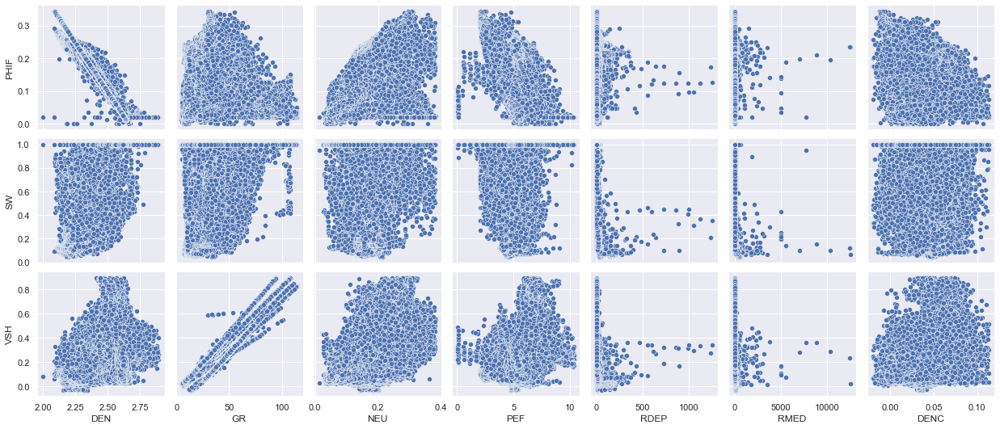

In [336]:
sns.pairplot(rawd_zscore, x_vars = ['DEN', 'GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'DENC'], y_vars = ['PHIF','SW','VSH']);

#### The goal is that after clustering, we want to see some sort of clear distinction in the data points in the pairplots

In [337]:
Clustering_data=rawd_zscore[['GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'DENC']]

In [338]:
Clustering_data.head()

,GR,NEU,PEF,RDEP,RMED,DENC
27637,105.1298,0.356362,7.768260,2.0221,1.9637,0.052640
27638,96.2974,0.284076,7.753789,1.8195,1.9264,0.053326
27639,96.7453,0.289856,7.753789,1.8147,1.8823,0.053326
27643,71.8780,0.276910,8.705012,2.5728,1.9310,0.039208
27644,54.1148,0.286843,7.414469,2.2001,1.5543,0.054152


In [339]:
from sklearn.preprocessing import StandardScaler
scaler_s = StandardScaler()

Clustering_data_scaled = scaler_s.fit_transform(Clustering_data)                              
Clustering_data_scaled_df = pd.DataFrame (Clustering_data_scaled, columns = ['GR','NEU','PEF','RDEP','RMED','DENC']) 
Clustering_data_scaled_df.head()

,GR,NEU,PEF,RDEP,RMED,DENC
0,3.055099,2.985954,2.018418,-0.362307,-0.124111,0.335642
1,2.658797,1.777030,2.005852,-0.368326,-0.124332,0.367841
2,2.678894,1.873696,2.005852,-0.368469,-0.124594,0.367841
3,1.563119,1.657185,2.831864,-0.345946,-0.124305,-0.294699
4,0.766099,1.823306,1.711197,-0.357019,-0.126542,0.406607


In [340]:
from sklearn.cluster import KMeans
#log_kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state=150)
#Electrofacies_kmeans = log_kmeans.fit_predict(well_log_scaled)

In [341]:
# lets find the optimal number of clusters for KMeans clustering 

In [342]:
SSW = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_optimal = KMeans(n_clusters = k, random_state=20).fit(Clustering_data_scaled_df) # All the other K-Means options are defaulted
    
    SSW[k] =   kmeans_optimal .inertia_ # Compute the sum of squares within

#inertia is the sum of square within
print('The SSW values are', SSW[1:10])

The SSW values are [219156.         169800.93236912 148246.05635524 125500.70362336
 106656.20065732  89226.95591523  79103.57416136  71689.21527355
  64697.75355197]


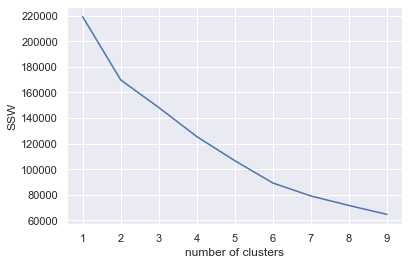

In [343]:
clusters = range(1, 10)
plt.ylabel('SSW')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW[1:10])    

Elbow plot is giving us 2 or 6 different clusters. 
We would validate this with the silhouette analysis 

In [344]:
#from yellowbrick.cluster import SilhouetteVisualizer

In [345]:
####

For n_clusters = 2 The average silhouette_score is : 0.255180052440902
For n_clusters = 3 The average silhouette_score is : 0.27354078060684456
For n_clusters = 4 The average silhouette_score is : 0.2724422974955333
For n_clusters = 5 The average silhouette_score is : 0.28448201290451414
For n_clusters = 6 The average silhouette_score is : 0.3257278704690311


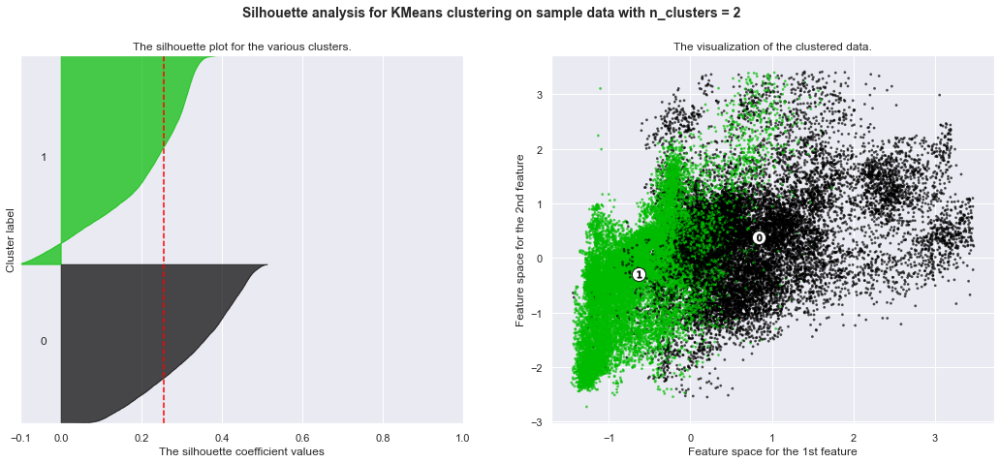

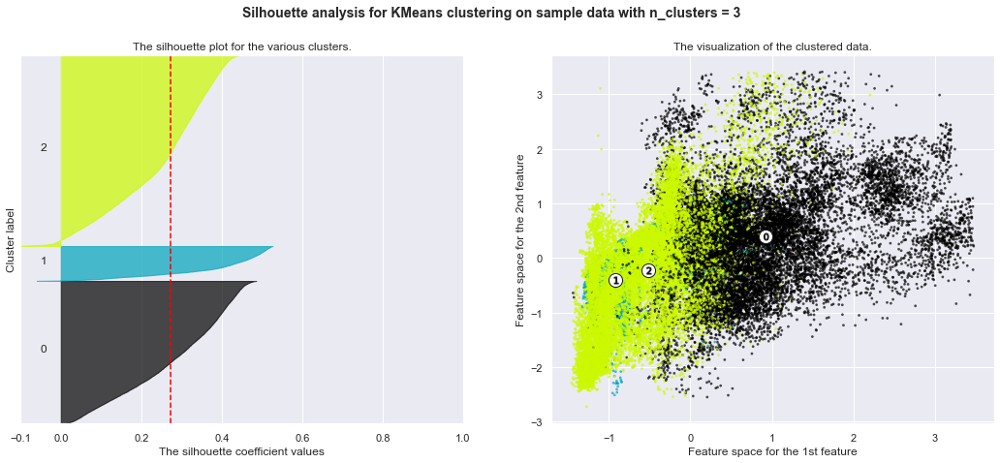

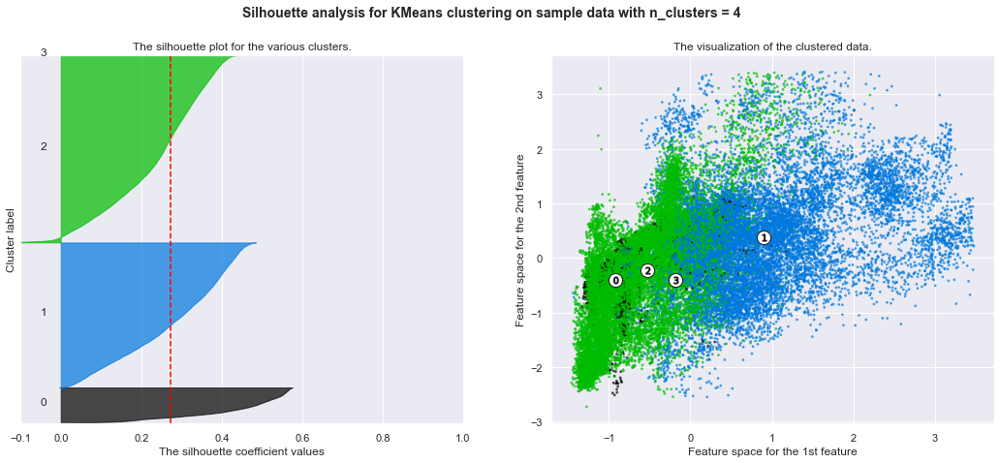

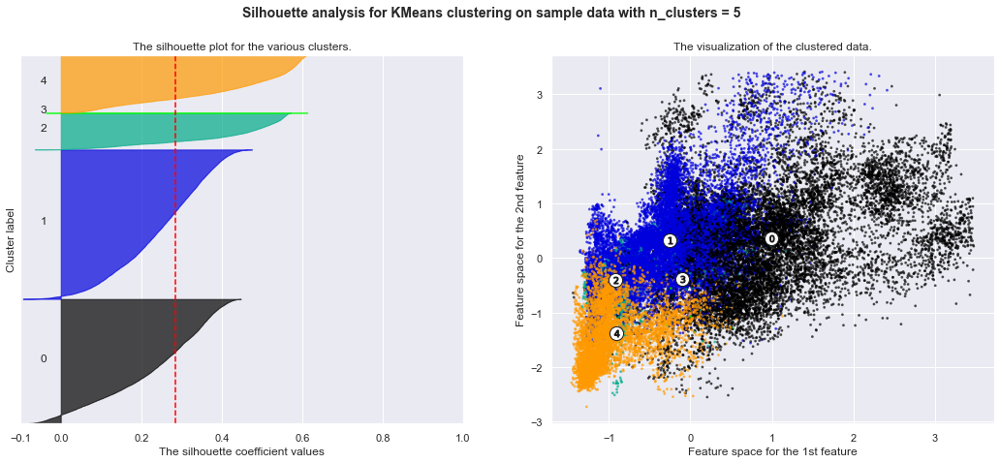

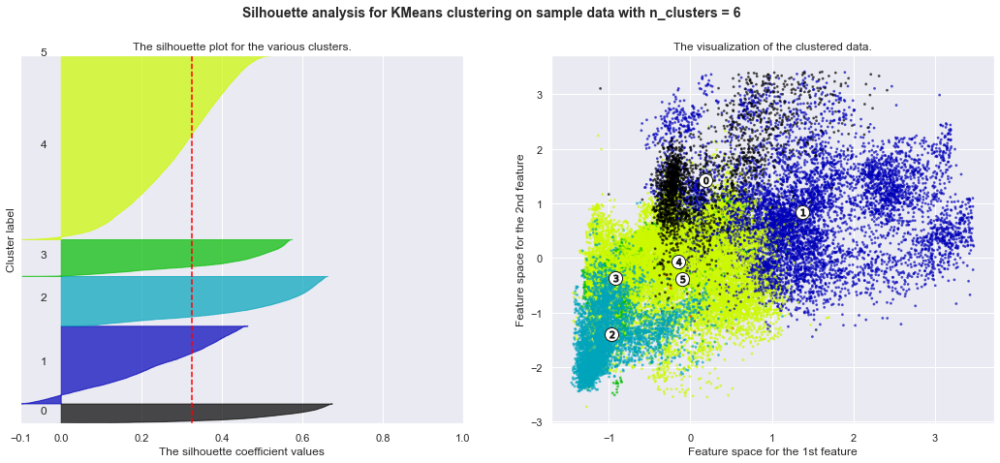

In [346]:
#from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


X = Clustering_data_scaled_df.iloc[:,:].values #Use the x inouts in pandas

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=20,init = 'k-means++', n_init = 10, max_iter = 300)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [347]:
## We would take the optimal number of clusters to be 5 based on silhoutte analysis

In [348]:
Clustering_data_scaled_df.columns

Index(['GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'DENC'], dtype='object')

In [349]:
#Now lets create a clustering algorithm with 4 clusters
km = KMeans(n_clusters = 6, init = 'k-means++', n_init = 10, max_iter = 300, random_state=20)
Electrofacies_kmeans = km.fit_predict(Clustering_data_scaled_df)

In [350]:
#Redifining the original data for labelling purposes
K_labelled_Data=rawd_zscore.copy(deep=True)

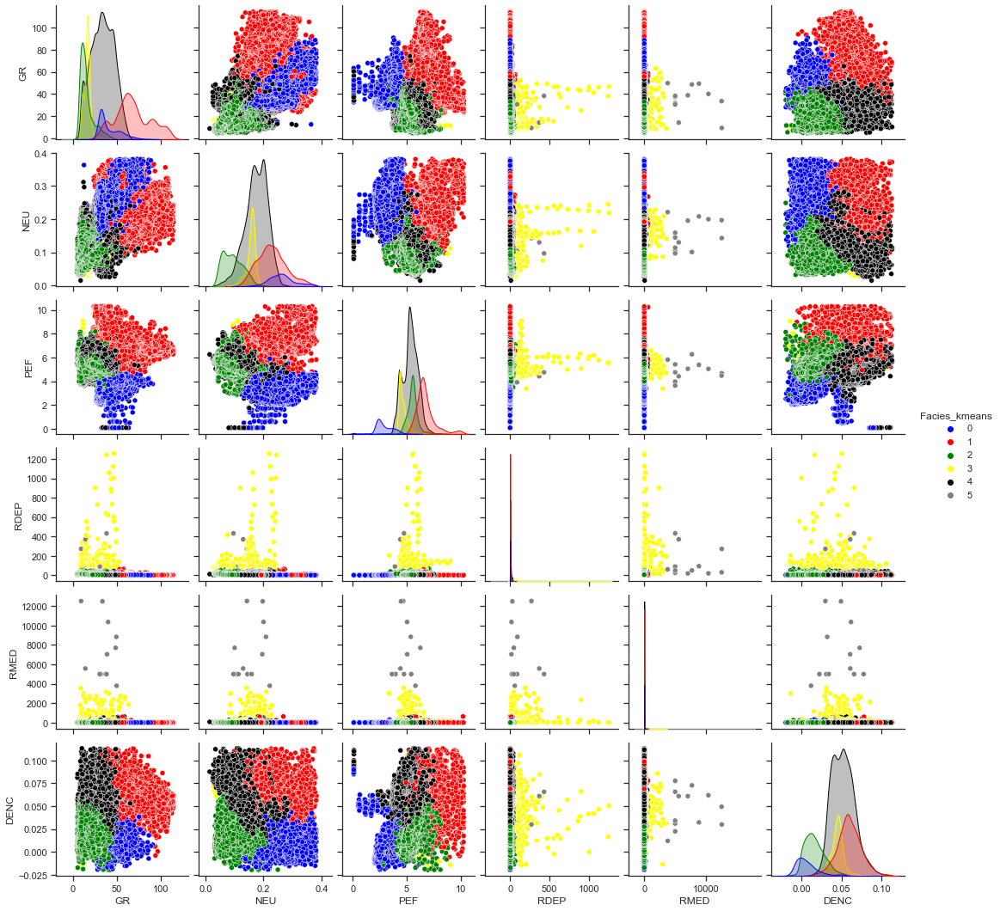

In [351]:
K_labelled_Data['Facies_kmeans'] = Electrofacies_kmeans

sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(K_labelled_Data, vars=['GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'DENC'] ,hue = 'Facies_kmeans', palette=['blue','red','green','yellow','black','grey'])

In [352]:
rawd_zscore.columns

Index(['RMED', 'RDEP', 'SW', 'PHIF', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN',
       'DENC', 'CALI', 'VSH', 'PEF', 'ROP'],
      dtype='object')

##### We are seeing some distiction. 


In [353]:
#K_labelled_Data.head()

##### Lets further visualize with other plots

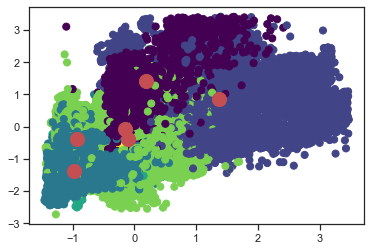

In [354]:
plt.scatter(Clustering_data_scaled_df.iloc[:, 0], Clustering_data_scaled_df.iloc[:, 1], c=Electrofacies_kmeans, s=50, cmap='viridis')

plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='r', s=200); 

##### Boxplots

<AxesSubplot:xlabel='Facies_kmeans', ylabel='DENC'>

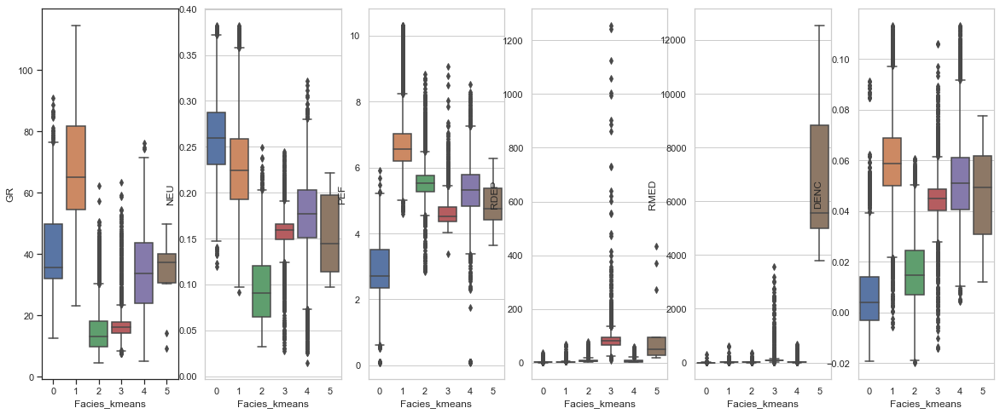

In [355]:
plt.figure(figsize = (20,8)) 
plt.subplot(1, 6, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['GR'])

plt.subplot(1, 6, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['NEU'])

plt.subplot(1, 6, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['PEF'])

plt.subplot(1, 6, 4)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['RDEP'])

plt.subplot(1, 6, 5)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['RMED'])

plt.subplot(1, 6, 6)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['DENC'])

##### Log Plots

In [356]:
def log_plot(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = logs.DEPTH.max()
    
    f, ax = plt.subplots(nrows=1, ncols=7, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.NEU, logs.DEPTH, color='red')
    ax[2].plot(logs.PEF, logs.DEPTH, color='blue')
    ax[3].plot(logs.RDEP, logs.DEPTH, color='black')
    ax[4].plot(logs.RMED, logs.DEPTH, color='grey')
    ax[5].plot(logs.DENC, logs.DEPTH, color='purple')

    
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 0,color = 'blue')
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 1,color = 'red')
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 2,color = 'green')
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 3,color = 'yellow')
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 4,color = 'black')
    ax[6].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 5,color = 'grey')

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 16)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("NEU", fontsize = 16)
    ax[1].set_xlim(logs.NEU.min(),logs.NEU.max())
    ax[2].set_xlabel("PEF", fontsize = 16)
    ax[2].set_xlim(logs.PEF.min(),logs.PEF.max())
    ax[3].set_xlabel("RDEP", fontsize = 16)
    ax[3].set_xlim(logs.RDEP.min(),logs.RDEP.max())
    ax[4].set_xlabel("RMED", fontsize = 16)
    ax[4].set_xlim(logs.RMED.min(),logs.RMED.max())
    ax[5].set_xlabel("DENC", fontsize = 16)
    ax[5].set_xlim(logs.DENC.min(),logs.DENC.max())
    
    ax[6].set_xlabel("Facies", fontsize = 16)
#    ax[3].set_xlim(logs.Facies.min(),logs.Facies.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]);  ax[4].set_yticklabels([]); ax[5].set_yticklabels([]);
    legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0'),
                       Patch(facecolor='red', edgecolor='red',   label='1'),
                       Patch(facecolor='green', edgecolor='green', label='2'),
                      Patch(facecolor='yellow', edgecolor='yellow', label='3'),
                     Patch(facecolor='black', edgecolor='black', label='4'),
                      Patch(facecolor='grey', edgecolor='grey', label='5')]
    ax[6].legend(handles=legend_elements, loc='upper left')
    
    f.suptitle('Welllogs', fontsize=20,y=0.94)

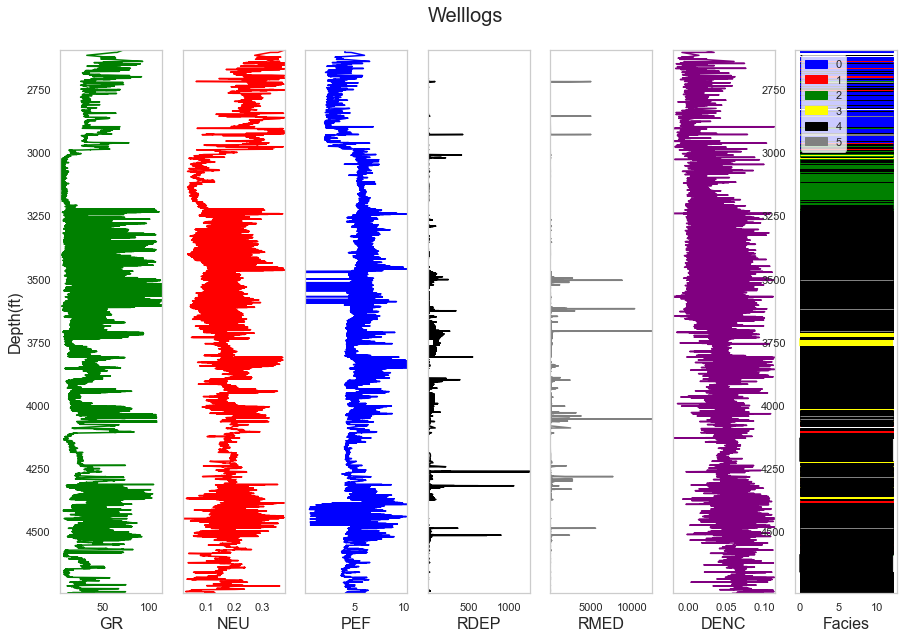

In [357]:
log_plot(K_labelled_Data)

##### Add Comments

1. Although the Elbow plot and silhoutte analysis suggest that optimal number of clusters is 5, the clusters are not distinct. 
2. The clusters have different sizes from the silhoutte analysis. Cluster labels 4 and 5 have very few datapoints.
3. The boxplots are also not distinct. 
4. The boxplot also shows that RDEP and RMED highly affects the clustering. 
5. We would explore taking one of them out as both are resistivity logs. We may also take both of them out based on results obtained. 

##### Lets take RMED out

In [358]:
Clustering_data1=rawd_zscore[['GR', 'NEU', 'PEF']]

In [359]:
Clustering_data_scaled1 = scaler_s.fit_transform(Clustering_data1)                              
Clustering_data_scaled1_df = pd.DataFrame (Clustering_data_scaled1, columns = ['GR','NEU','PEF']) 
Clustering_data_scaled1_df.head()

,GR,NEU,PEF
0,3.055099,2.985954,2.018418
1,2.658797,1.777030,2.005852
2,2.678894,1.873696,2.005852
3,1.563119,1.657185,2.831864
4,0.766099,1.823306,1.711197


In [360]:
SSW = np.zeros(10) # Initialize the list SSW to be empty

for k in range(1,10):
    
    kmeans_optimal = KMeans(n_clusters = k, random_state=20).fit(Clustering_data_scaled1_df) # All the other K-Means options are defaulted
    
    SSW[k] =   kmeans_optimal .inertia_ # Compute the sum of squares within

#inertia is the sum of square within
print('The SSW values are', SSW[1:10])

The SSW values are [109578.          68541.06988679  52235.44508465  42944.76821567
  34175.01293927  28805.65070842  24396.03649244  22190.40482234
  20382.87457515]


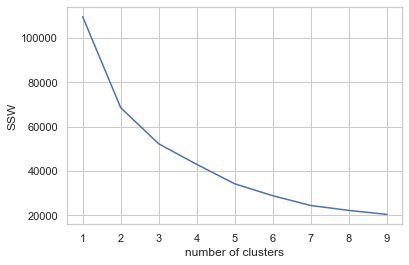

In [361]:
clusters = range(1, 10)
plt.ylabel('SSW')
plt.xlabel('number of clusters')
plt.plot(clusters, SSW[1:10])    

In [362]:
#Optimal clusters is 2 or 3 from elbow plot

For n_clusters = 2 The average silhouette_score is : 0.36233963713412254
For n_clusters = 3 The average silhouette_score is : 0.30258455950946456
For n_clusters = 4 The average silhouette_score is : 0.3035794536632665
For n_clusters = 5 The average silhouette_score is : 0.3364657585611226
For n_clusters = 6 The average silhouette_score is : 0.3489490246493836


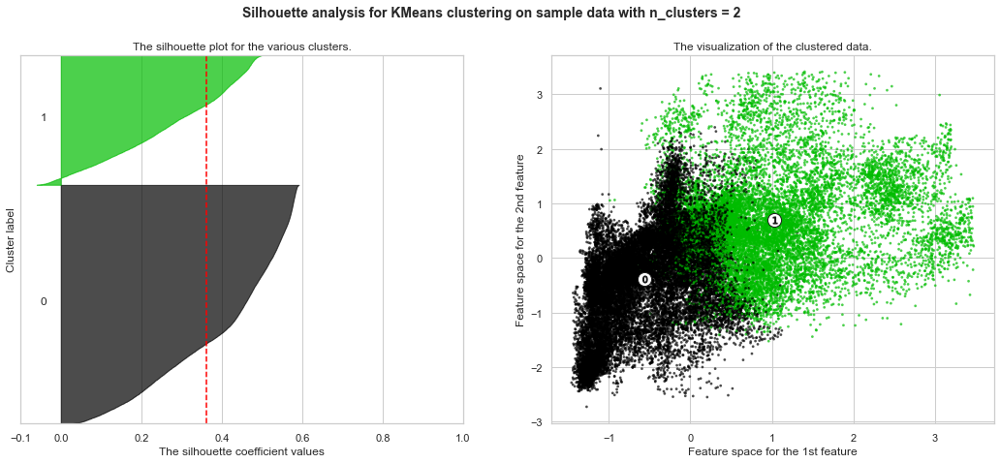

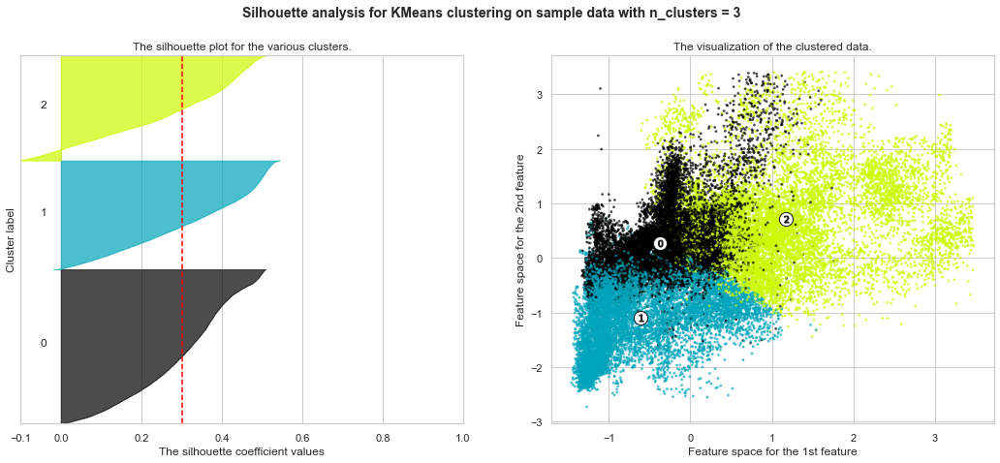

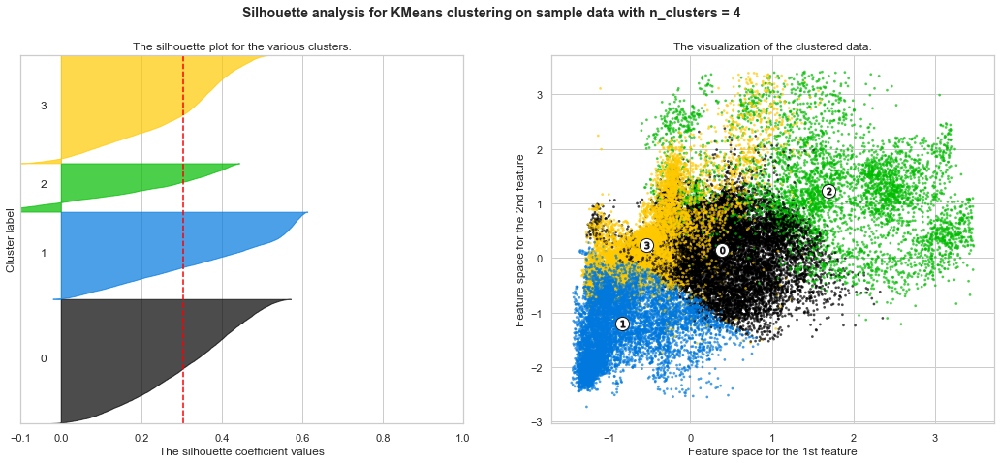

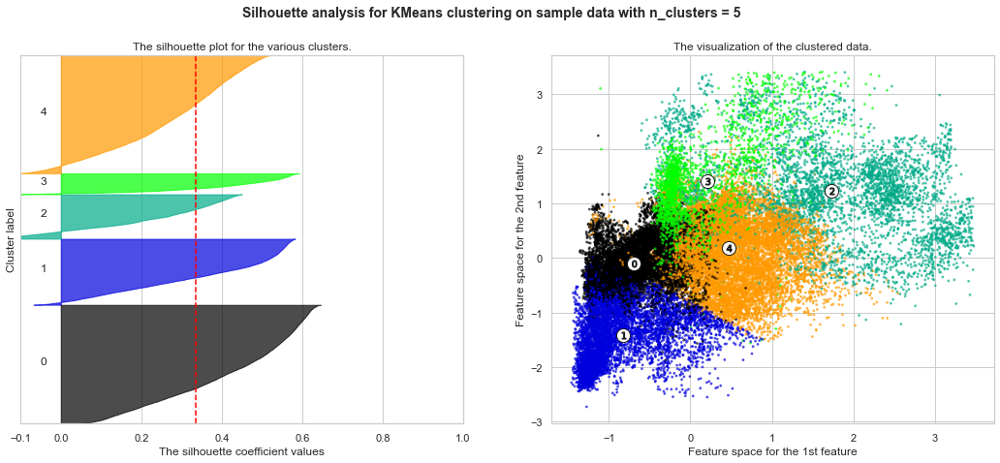

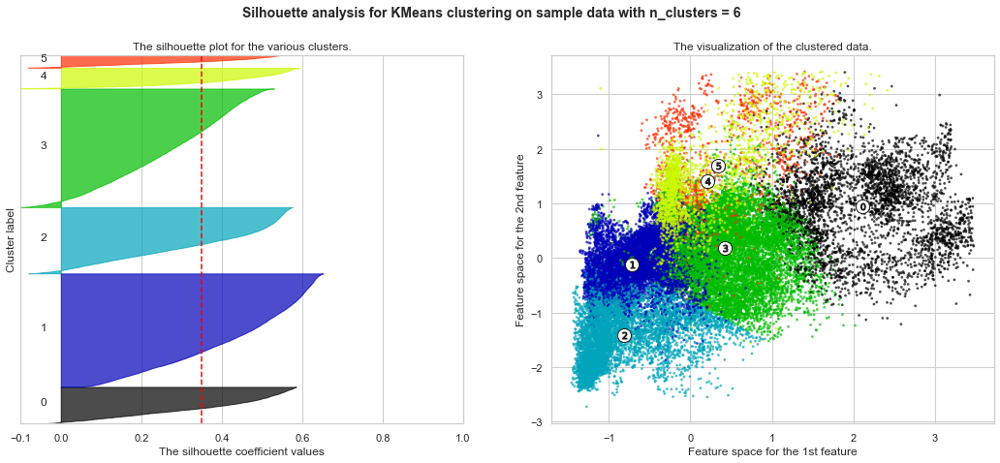

In [363]:
#from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np


X = Clustering_data_scaled1_df.iloc[:,:].values #Use the x inouts in pandas

range_n_clusters = [2, 3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=20,init = 'k-means++', n_init = 10, max_iter = 300)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

In [364]:
#Now lets create a clustering algorithm with 3 clusters
km_3 = KMeans(n_clusters = 3, init = 'k-means++', n_init = 10, max_iter = 300, random_state=20)
Electrofacies_kmeans1 = km_3.fit_predict(Clustering_data_scaled1_df)

In [365]:
K_labelled_Data1=rawd_zscore.copy(deep=True)

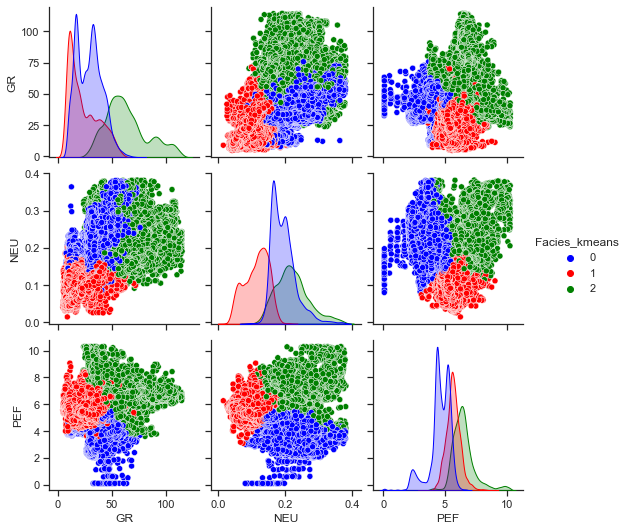

In [366]:
K_labelled_Data1['Facies_kmeans'] = Electrofacies_kmeans1

sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(K_labelled_Data1, vars=['GR', 'NEU', 'PEF'] ,hue = 'Facies_kmeans', palette=['blue','red','green'])

In [367]:
K_labelled_Data1.head()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP,Facies_kmeans
27637,1.9637,2.0221,1.0,0.0,105.1298,0.356362,4314.035462,124.25676,85.0392,2.5663,0.052640,9.4895,0.729942,7.768260,21.58960,2
27638,1.9264,1.8195,1.0,0.0,96.2974,0.284076,4314.187862,123.91767,84.4883,2.5792,0.053326,9.4286,0.718504,7.753789,23.78268,2
27639,1.8823,1.8147,1.0,0.0,96.7453,0.289856,4314.340262,123.91767,84.2962,2.5838,0.053326,9.4657,0.702326,7.753789,23.43445,2
27643,1.9310,2.5728,1.0,0.0,71.8780,0.276910,4314.949862,125.02049,72.9828,2.6588,0.039208,9.4809,0.404779,8.705012,26.66953,2
27644,1.5543,2.2001,1.0,0.0,54.1148,0.286843,4315.102262,123.22248,75.0524,2.6628,0.054152,9.4286,0.310032,7.414469,24.96039,2


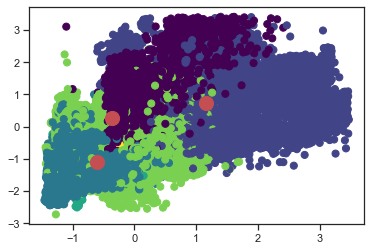

In [368]:
plt.scatter(Clustering_data_scaled1_df.iloc[:, 0], Clustering_data_scaled1_df.iloc[:, 1], c=Electrofacies_kmeans, s=50, cmap='viridis')

plt.scatter(km_3.cluster_centers_[:, 0], km_3.cluster_centers_[:, 1], c='r', s=200); 

<AxesSubplot:xlabel='Facies_kmeans', ylabel='PEF'>

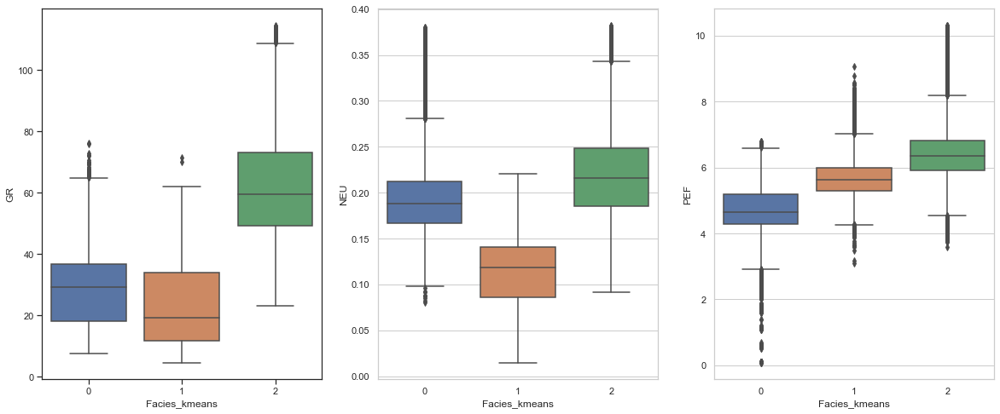

In [369]:
plt.figure(figsize = (20,8)) 
plt.subplot(1, 3, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data1['Facies_kmeans'], y=K_labelled_Data1['GR'])

plt.subplot(1, 3, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data1['Facies_kmeans'], y=K_labelled_Data1['NEU'])

plt.subplot(1, 3, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=K_labelled_Data1['Facies_kmeans'], y=K_labelled_Data1['PEF'])

#plt.subplot(1, 5, 4)  
##sns.boxplot(x=K_labelled_Data['Facies_kmeans1'], y=K_labelled_Data['RDEP'])

#plt.subplot(1, 6, 5)  
#sns.set(style="whitegrid")
#sns.boxplot(x=K_labelled_Data['Facies_kmeans'], y=K_labelled_Data['RMED'])

#plt.subplot(1, 4, 4)  
#sns.set(style="whitegrid")
#sns.boxplot(x=K_labelled_Data1['Facies_kmeans'], y=K_labelled_Data1['DENC'])

In [370]:
def log_plot_cl(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = logs.DEPTH.max()
    
    f, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.NEU, logs.DEPTH, color='red')
    ax[2].plot(logs.PEF, logs.DEPTH, color='blue')

    
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 0,color = 'blue')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 1,color = 'red')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 2,color = 'green')

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 16)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("NEU", fontsize = 16)
    ax[1].set_xlim(logs.NEU.min(),logs.NEU.max())
    ax[2].set_xlabel("PEF", fontsize = 16)
    ax[2].set_xlim(logs.PEF.min(),logs.PEF.max())
    
    ax[3].set_xlabel("Facies", fontsize = 16)
#    ax[3].set_xlim(logs.Facies.min(),logs.Facies.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]); 
    legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0'),
                       Patch(facecolor='red', edgecolor='red',   label='1'),
                       Patch(facecolor='green', edgecolor='green', label='2')]
    ax[3].legend(handles=legend_elements, loc='upper left')
    
    f.suptitle('Well Logs', fontsize=20,y=0.94)

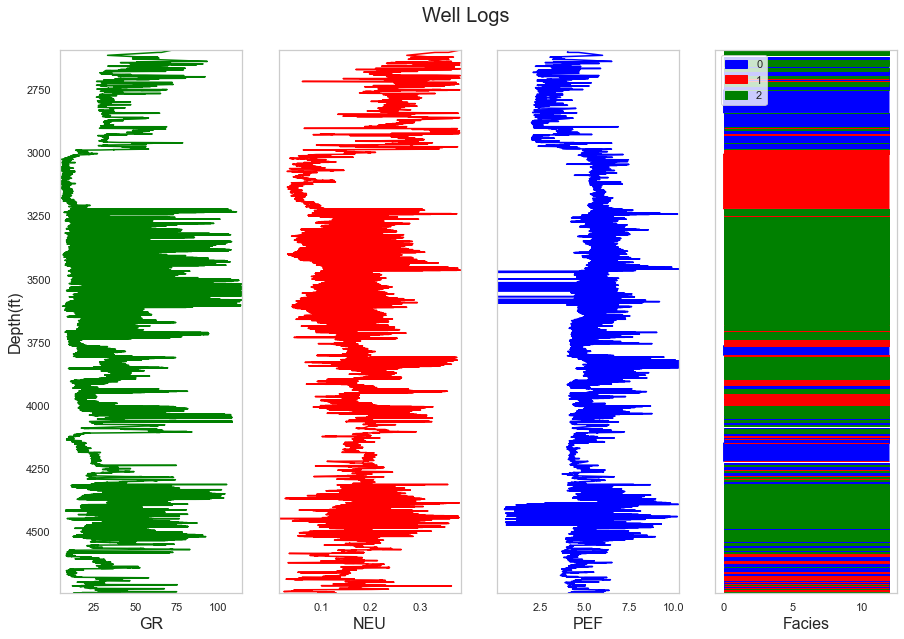

In [371]:
log_plot_cl(K_labelled_Data1)

In [609]:
def logs_plot_cl(logs):
    from matplotlib.patches import Patch
    logs = logs.sort_values(by='DEPTH')
    top = logs.DEPTH.min()
    bot = 3500
    
    f, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
    ax[0].plot(logs.GR, logs.DEPTH, color='green')
    ax[1].plot(logs.NEU, logs.DEPTH, color='red')
    ax[2].plot(logs.PEF, logs.DEPTH, color='blue')

    
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 0,color = 'blue')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 1,color = 'red')
    ax[3].fill_betweenx(logs.DEPTH, x1 = 0, x2=12, where= logs.Facies_kmeans == 2,color = 'green')

    
    for i in range(len(ax)):
        ax[i].set_ylim(top,bot)
        ax[i].invert_yaxis()
        ax[i].grid()
        
    ax[0].set_xlabel("GR", fontsize = 16)
    ax[0].set_xlim(logs.GR.min(),logs.GR.max())
    ax[0].set_ylabel("Depth(ft)",fontsize = 16)
    ax[1].set_xlabel("NEU", fontsize = 16)
    ax[1].set_xlim(logs.NEU.min(),logs.NEU.max())
    ax[2].set_xlabel("PEF", fontsize = 16)
    ax[2].set_xlim(logs.PEF.min(),logs.PEF.max())
    
    ax[3].set_xlabel("Facies", fontsize = 16)
#    ax[3].set_xlim(logs.Facies.min(),logs.Facies.max())
    
    ax[1].set_yticklabels([]); ax[2].set_yticklabels([]);
    ax[3].set_yticklabels([]); 
    legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='0'),
                       Patch(facecolor='red', edgecolor='red',   label='1'),
                       Patch(facecolor='green', edgecolor='green', label='2')]
    ax[3].legend(handles=legend_elements, loc='upper left')
    
    f.suptitle('Well Logs', fontsize=20,y=0.94)

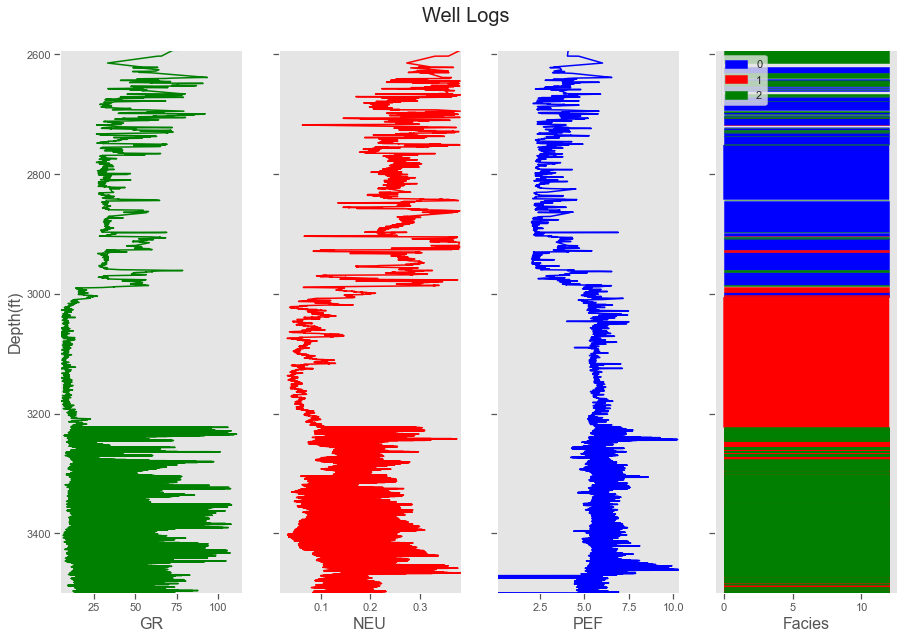

In [610]:
logs_plot_cl(K_labelled_Data1)

In [372]:
# Minerological plots

In [373]:
PHIF_= K_labelled_Data1['PHIF']
VSH_= K_labelled_Data1['VSH']
SW_= K_labelled_Data1['SW']
DEPTH_ = K_labelled_Data1['DEPTH']

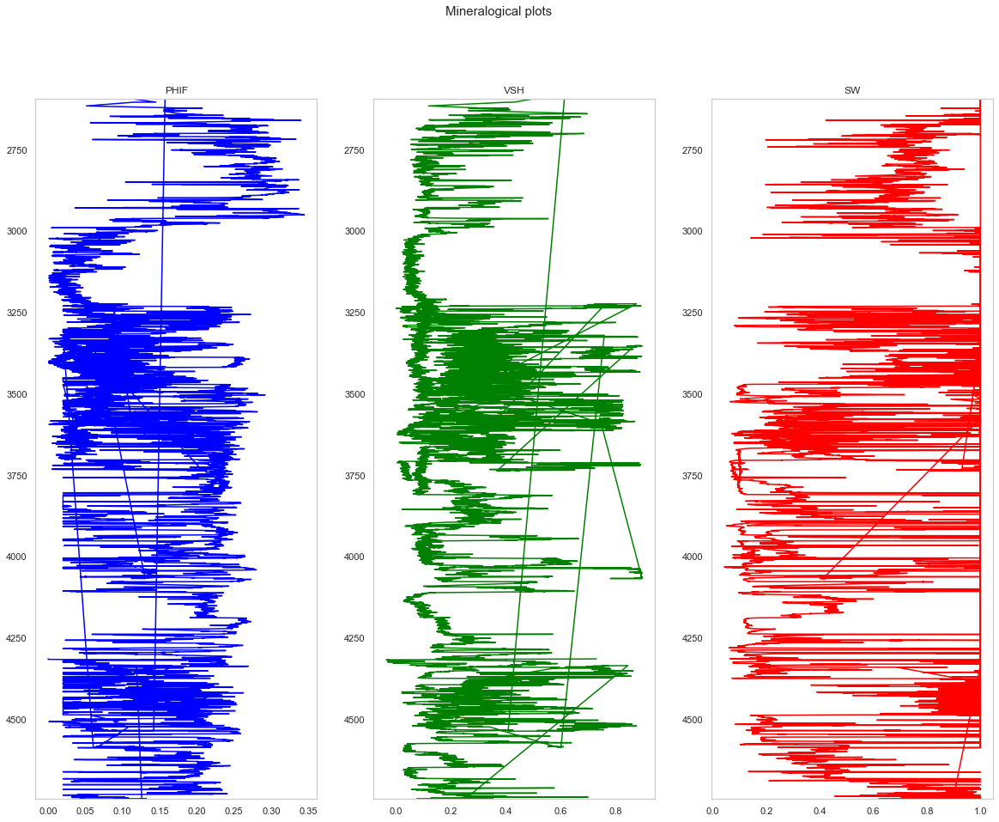

In [374]:
plt.figure(figsize=(20,15))

plt.suptitle('Mineralogical plots', size=15)

plt.subplot(1,3,1)
plt.plot(PHIF_, DEPTH_, color='blue')
plt.ylim(max(DEPTH_), min(DEPTH_))
plt.title('PHIF')
plt.grid()

plt.subplot(1,3,2)
plt.plot(VSH_, DEPTH_, color='green')
plt.ylim(max(DEPTH_), min(DEPTH_))
plt.title('VSH')
plt.grid()

plt.subplot(1,3,3)
plt.plot(SW_, DEPTH_, color='red')
plt.ylim(max(DEPTH_), min(DEPTH_))
plt.title('SW')
plt.grid()

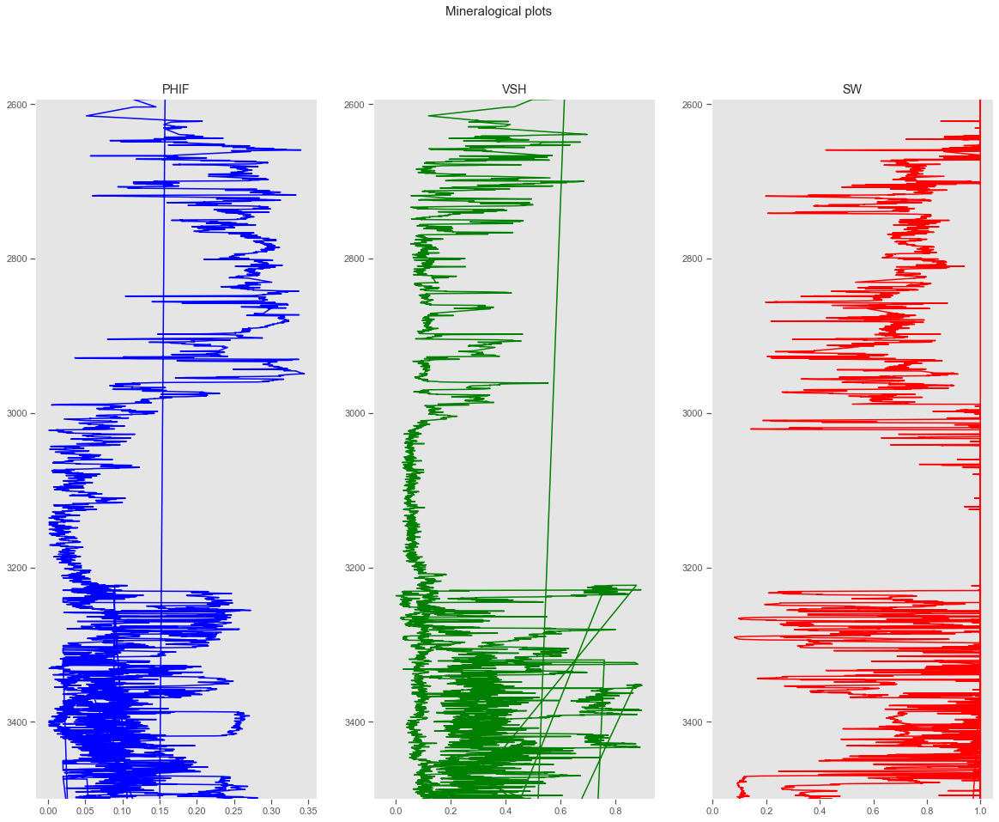

In [611]:
plt.figure(figsize=(20,15))

plt.suptitle('Mineralogical plots', size=15)

plt.subplot(1,3,1)
plt.plot(PHIF_, DEPTH_, color='blue')
plt.ylim(3500, min(DEPTH_))
plt.title('PHIF')
plt.grid()

plt.subplot(1,3,2)
plt.plot(VSH_, DEPTH_, color='green')
plt.ylim(3500, min(DEPTH_))
plt.title('VSH')
plt.grid()

plt.subplot(1,3,3)
plt.plot(SW_, DEPTH_, color='red')
plt.ylim(3500, min(DEPTH_))
plt.title('SW')
plt.grid()

#### Hierarchical Clustering

In [375]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [376]:
### Agglomerative clustering gave memory error
### So we create just a sample of rawdata_new and use for sampling.

In [377]:
#Clustering_data_scaled1_df.shape

In [378]:
rawd_zscore.shape

(36526, 15)

In [379]:
# We get a random sample of 60% of the original data but with proportionate stratification
sampled_data=rawd_zscore.groupby('DEPTH', group_keys=False).apply(lambda x: x.sample(frac=0.6))

In [380]:
sampled_data.shape

(25901, 15)

In [381]:
sampled_data.describe()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP
count,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000,25901.000000
mean,21.735054,13.437905,0.652822,0.145839,34.983432,0.174087,3729.275946,128.511881,76.680363,2.402171,0.042955,8.623624,0.236665,5.298534,23.139056
std,149.599314,34.826961,0.351358,0.083479,21.645284,0.062916,519.973896,10.673104,10.111038,0.160432,0.022720,0.107690,0.176776,1.166080,8.057399
min,0.186300,0.168977,0.043000,0.000000,4.588597,0.014900,2592.781117,95.518910,51.879600,2.001000,-0.019600,8.304600,-0.035820,0.085000,1.772680
25%,1.725200,1.661900,0.296000,0.067000,17.011900,0.136300,3376.726692,121.384120,70.579460,2.252500,0.029593,8.556900,0.101000,4.609000,18.310600
50%,3.968509,3.653664,0.751900,0.151300,31.582900,0.172700,3632.453884,129.539280,76.021410,2.402600,0.045957,8.625000,0.192000,5.373800,24.815300
75%,11.668500,9.704600,1.000000,0.221100,46.851800,0.212200,4164.698675,136.603810,82.751150,2.546826,0.058500,8.671900,0.320000,5.939480,29.922700
max,12503.600000,1254.730000,1.000000,0.344653,114.449000,0.381900,4744.800112,163.859680,108.567700,2.885600,0.113000,9.489500,0.896000,10.300500,46.187300


In [382]:
sampled_clustering=sampled_data[['GR','NEU','PEF']]

In [383]:
sampled_clustering_scaled = scaler_s.fit_transform(sampled_clustering)                              
sampled_clustering_scaled_df = pd.DataFrame (sampled_clustering_scaled, columns = ['GR','NEU','PEF']) 
sampled_clustering_scaled_df.head()

,GR,NEU,PEF
0,2.295936,2.738076,-1.198066
1,1.970710,2.769484,-0.962400
2,1.731660,3.290016,-1.042516
3,1.417840,2.915969,-1.076322
4,1.309133,2.478709,-0.537567


In [384]:
log_HC = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')

Electrofacies_HC = log_HC.fit_predict(sampled_data)

print(log_HC .labels_)

[2 2 2 ... 1 1 1]


In [385]:
Electrofacies_HC_df = pd.DataFrame (Electrofacies_HC, columns = ['Labels'])

In [386]:
Electrofacies_HC_df.head()

,Labels
0,2
1,2
2,2
3,2
4,2


In [387]:
TTL=(Electrofacies_HC_df['Labels'].value_counts())

In [388]:
TTL.head()

0    12284
2     7396
1     6221
Name: Labels, dtype: int64

In [389]:
# Hierarchical clustering is not doing a really good job

In [390]:
#Redifining the original data for labelling purposes
HC_labelled_Data=sampled_data

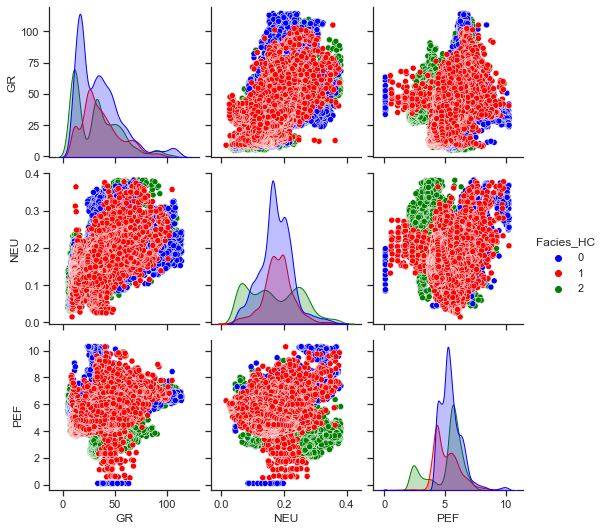

In [391]:
HC_labelled_Data['Facies_HC'] = Electrofacies_HC

sns.set(style = 'ticks') # Set the background to dark
sns.pairplot(HC_labelled_Data, vars=['GR', 'NEU', 'PEF'] ,hue = 'Facies_HC', palette=['blue','red','green'])

<AxesSubplot:xlabel='Facies_HC', ylabel='PEF'>

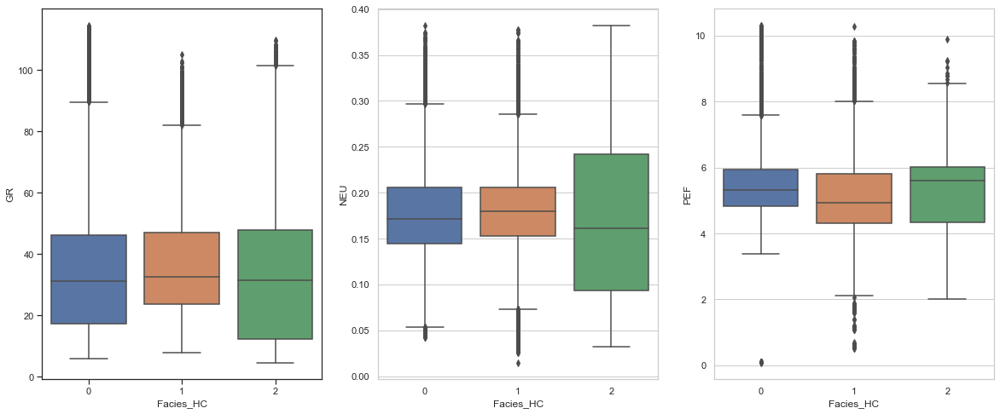

In [392]:
plt.figure(figsize = (20,8)) 
plt.subplot(1, 3, 1)  
sns.set(style="whitegrid")
sns.boxplot(x=HC_labelled_Data['Facies_HC'], y=HC_labelled_Data['GR'])

plt.subplot(1, 3, 2)  
sns.set(style="whitegrid")
sns.boxplot(x=HC_labelled_Data['Facies_HC'], y=HC_labelled_Data['NEU'])

plt.subplot(1, 3, 3)  
sns.set(style="whitegrid")
sns.boxplot(x=HC_labelled_Data['Facies_HC'], y=HC_labelled_Data['PEF'])

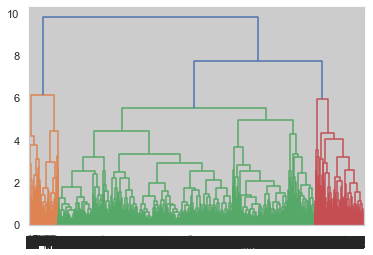

In [393]:
dendrogram = sch.dendrogram(sch.linkage(sampled_clustering_scaled, method='complete'))

In [394]:
# Heirarchichal clustering not performing well. 

### Summary of Clustering Results

1. Both KMeans and Heirarchical clustering was experimented

#### KMeans Clustering

1. A new dataset called "Clustering_Data" was created from rawdata_new consisting of selected well logs. i.e. 'GR', 'NEU', 'PEF', 'RDEP', 'RMED', 'DENC'
2. The data was scaled with a standard scaler. 
3. For the selected dataset, the elbow plot and silhouette analysis was used in determing the optimal number of clusters. 
4. Five (5) clusters were chosen, however, these clusters were not distinct as seen in electrofacie plots and boxplots. Boxplots significantly overlapped. 
5. KMeans was improved by selecting only signifcant well logs in electrofacie determination. i.e. GR, NEU and PEF. 
The algorithm had the following parameters (State them). 
6. A more distinct clusers were obtained. 

#### Heirarchical Clustering 

1. HC could not be carried out on the entire dataset due to time and space complexity. HC is computationally expensive. 
2. A stratified sample of the dataset was created consisting of 28694 datapoints from the original dataset.
3. HC did not do well in clustering the dataset as seen in the dendogram. 

# REGRESSION

In [395]:
#### Regression with rawdata_new

#### Preparing Training data

In [396]:
Train_data=rawd_zscore.copy()

In [397]:
Train_data.head()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP
27637,1.9637,2.0221,1.0,0.0,105.1298,0.356362,4314.035462,124.25676,85.0392,2.5663,0.052640,9.4895,0.729942,7.768260,21.58960
27638,1.9264,1.8195,1.0,0.0,96.2974,0.284076,4314.187862,123.91767,84.4883,2.5792,0.053326,9.4286,0.718504,7.753789,23.78268
27639,1.8823,1.8147,1.0,0.0,96.7453,0.289856,4314.340262,123.91767,84.2962,2.5838,0.053326,9.4657,0.702326,7.753789,23.43445
27643,1.9310,2.5728,1.0,0.0,71.8780,0.276910,4314.949862,125.02049,72.9828,2.6588,0.039208,9.4809,0.404779,8.705012,26.66953
27644,1.5543,2.2001,1.0,0.0,54.1148,0.286843,4315.102262,123.22248,75.0524,2.6628,0.054152,9.4286,0.310032,7.414469,24.96039


In [398]:
Train_data.isna().sum() # No missing data was found in the training data

RMED     0
RDEP     0
SW       0
PHIF     0
GR       0
NEU      0
DEPTH    0
DTS      0
DTC      0
DEN      0
DENC     0
CALI     0
VSH      0
PEF      0
ROP      0
dtype: int64

In [399]:
Train_data.shape

(36526, 15)

In [400]:
Train_data.describe()

,RMED,RDEP,SW,PHIF,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,VSH,PEF,ROP
count,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000,36526.000000
mean,22.863682,14.217041,0.642839,0.145851,37.040742,0.177821,3733.794659,129.316889,77.182171,2.401200,0.045488,8.624235,0.253626,5.443882,23.355919
std,168.400254,33.659584,0.357788,0.081524,22.287326,0.059794,481.446842,10.386406,9.449785,0.159258,0.021310,0.101218,0.184674,1.151600,7.663842
min,0.186300,0.168977,0.043000,0.000000,4.588597,0.014900,2592.781117,95.518910,51.879600,2.001000,-0.019700,8.304600,-0.035820,0.084600,0.337400
25%,1.701150,1.623525,0.275600,0.070000,18.334715,0.143900,3400.123139,122.731943,71.833250,2.252700,0.034600,8.556900,0.106000,4.762600,18.627875
50%,3.815112,3.325662,0.737000,0.151000,33.406800,0.175000,3639.849856,130.714250,76.450470,2.402000,0.047500,8.625000,0.213300,5.458615,24.983400
75%,12.156350,9.921500,1.000000,0.221200,49.091025,0.213400,4065.674492,136.730575,82.736253,2.541099,0.059500,8.671900,0.338175,6.093975,29.919575
max,12532.400000,1254.730000,1.000000,0.344653,114.449000,0.381900,4744.800112,163.879630,108.567700,2.893100,0.113100,9.489500,0.896700,10.305100,46.187300


In [401]:
Train_data.columns

Index(['RMED', 'RDEP', 'SW', 'PHIF', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN',
       'DENC', 'CALI', 'VSH', 'PEF', 'ROP'],
      dtype='object')

In [402]:
first_column= Train_data.pop('VSH')
second_column= Train_data.pop('PHIF')
third_column= Train_data.pop('SW')

In [403]:
Train_data.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,ROP
27637,1.9637,2.0221,105.1298,0.356362,4314.035462,124.25676,85.0392,2.5663,0.052640,9.4895,7.768260,21.58960
27638,1.9264,1.8195,96.2974,0.284076,4314.187862,123.91767,84.4883,2.5792,0.053326,9.4286,7.753789,23.78268
27639,1.8823,1.8147,96.7453,0.289856,4314.340262,123.91767,84.2962,2.5838,0.053326,9.4657,7.753789,23.43445
27643,1.9310,2.5728,71.8780,0.276910,4314.949862,125.02049,72.9828,2.6588,0.039208,9.4809,8.705012,26.66953
27644,1.5543,2.2001,54.1148,0.286843,4315.102262,123.22248,75.0524,2.6628,0.054152,9.4286,7.414469,24.96039


In [404]:
Train_data.insert(12, 'VSH', first_column)
Train_data.insert(13, 'PHIF', second_column)
Train_data.insert(14, 'SW', third_column)

In [405]:
Train_data

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,ROP,VSH,PHIF,SW
27637,1.963700,2.022100,105.12980,0.356362,4314.035462,124.25676,85.03920,2.566300,0.052640,9.489500,7.768260,21.58960,0.729942,0.000000,1.0
27638,1.926400,1.819500,96.29740,0.284076,4314.187862,123.91767,84.48830,2.579200,0.053326,9.428600,7.753789,23.78268,0.718504,0.000000,1.0
27639,1.882300,1.814700,96.74530,0.289856,4314.340262,123.91767,84.29620,2.583800,0.053326,9.465700,7.753789,23.43445,0.702326,0.000000,1.0
27643,1.931000,2.572800,71.87800,0.276910,4314.949862,125.02049,72.98280,2.658800,0.039208,9.480900,8.705012,26.66953,0.404779,0.000000,1.0
27644,1.554300,2.200100,54.11480,0.286843,4315.102262,123.22248,75.05240,2.662800,0.054152,9.428600,7.414469,24.96039,0.310032,0.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318962,3.646631,4.081079,32.91600,0.109335,3701.033882,115.60906,64.57612,2.613020,0.026474,8.550179,5.207650,10.43060,0.273600,0.028313,1.0
318963,3.936356,4.120065,28.76523,0.099368,3701.186282,114.60627,66.20669,2.614332,0.024994,8.520521,5.230460,9.47309,0.234400,0.027530,1.0
318964,4.245169,4.662224,25.70403,0.097774,3701.338682,115.83357,67.43187,2.620479,0.027400,8.521563,5.335860,8.96010,0.205400,0.023795,1.0
318965,4.372118,4.810604,22.94222,0.089295,3701.491082,116.91990,66.56465,2.623435,0.027175,8.522397,5.346350,8.80637,0.179300,0.022048,1.0


In [406]:
Train_data.isna().sum()

RMED     0
RDEP     0
GR       0
NEU      0
DEPTH    0
DTS      0
DTC      0
DEN      0
DENC     0
CALI     0
PEF      0
ROP      0
VSH      0
PHIF     0
SW       0
dtype: int64

In [407]:
#Train_data.SW.unique

In [408]:
Train_data.columns

Index(['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC',
       'CALI', 'PEF', 'ROP', 'VSH', 'PHIF', 'SW'],
      dtype='object')

In [409]:
# Separate the predictors from the target variables.
predictors=Train_data[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']]
targets=Train_data[['VSH', 'PHIF', 'SW']]

In [410]:
targets.head()

,VSH,PHIF,SW
27637,0.729942,0.0,1.0
27638,0.718504,0.0,1.0
27639,0.702326,0.0,1.0
27643,0.404779,0.0,1.0
27644,0.310032,0.0,1.0


In [411]:
targets.isna().sum()

VSH     0
PHIF    0
SW      0
dtype: int64

##### Scaling the data

In [412]:
from sklearn.preprocessing import StandardScaler

scaler_s = StandardScaler()

predictors_num= predictors[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']].to_numpy()                    
predictors_scaled = scaler_s.fit_transform(predictors_num)                              
predictors_scaled_df = pd.DataFrame (predictors_scaled, columns = ['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']) 

In [413]:
predictors_scaled_df.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF
0,-0.124111,-0.362307,3.055099,2.985954,1.205219,-0.487194,0.831462,1.036700,0.335642,8.548639,2.018418
1,-0.124332,-0.368326,2.658797,1.777030,1.205535,-0.519842,0.773164,1.117702,0.367841,7.946960,2.005852
2,-0.124594,-0.368469,2.678894,1.873696,1.205852,-0.519842,0.752835,1.146586,0.367841,8.313500,2.005852
3,-0.124305,-0.345946,1.563119,1.657185,1.207118,-0.413662,-0.444394,1.617527,-0.294699,8.463673,2.831864
4,-0.126542,-0.357019,0.766099,1.823306,1.207435,-0.586776,-0.225381,1.642644,0.406607,7.946960,1.711197


In [414]:
predictors_scaled_df.isna().sum()

RMED     0
RDEP     0
GR       0
NEU      0
DEPTH    0
DTS      0
DTC      0
DEN      0
DENC     0
CALI     0
PEF      0
dtype: int64

In [415]:
predictors_scaled_df.shape

(36526, 11)

<AxesSubplot:title={'center':'After Standard Scaler'}, xlabel='RMED', ylabel='Density'>

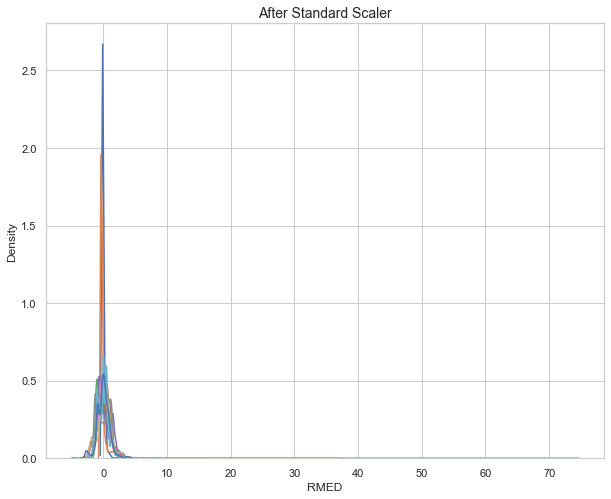

In [416]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))

ax1.set_title('After Standard Scaler', fontsize = 14)
sns.kdeplot(predictors_scaled_df['RMED'], ax=ax1)
sns.kdeplot(predictors_scaled_df['RDEP'], ax=ax1)
sns.kdeplot(predictors_scaled_df['GR'], ax=ax1)
sns.kdeplot(predictors_scaled_df['NEU'], ax=ax1)
sns.kdeplot(predictors_scaled_df['DEPTH'], ax=ax1)
sns.kdeplot(predictors_scaled_df['DTS'], ax=ax1)
sns.kdeplot(predictors_scaled_df['DTC'], ax=ax1)
sns.kdeplot(predictors_scaled_df['DEN'], ax=ax1)
sns.kdeplot(predictors_scaled_df['DENC'], ax=ax1)
sns.kdeplot(predictors_scaled_df['CALI'], ax=ax1)
sns.kdeplot(predictors_scaled_df['PEF'], ax=ax1)



In [417]:
targets.head()

,VSH,PHIF,SW
27637,0.729942,0.0,1.0
27638,0.718504,0.0,1.0
27639,0.702326,0.0,1.0
27643,0.404779,0.0,1.0
27644,0.310032,0.0,1.0


In [418]:
VSH_raw = targets[['VSH']].to_numpy() # Creating unscaled output as a separate numpy array
VSH_raw_df = pd.DataFrame(VSH_raw , columns = ['VSH'])# Converting it to a pandas dataframe
predictors_scaled_df['VSH'] = VSH_raw_df

In [419]:
predictors_scaled_df.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,VSH
0,-0.124111,-0.362307,3.055099,2.985954,1.205219,-0.487194,0.831462,1.036700,0.335642,8.548639,2.018418,0.729942
1,-0.124332,-0.368326,2.658797,1.777030,1.205535,-0.519842,0.773164,1.117702,0.367841,7.946960,2.005852,0.718504
2,-0.124594,-0.368469,2.678894,1.873696,1.205852,-0.519842,0.752835,1.146586,0.367841,8.313500,2.005852,0.702326
3,-0.124305,-0.345946,1.563119,1.657185,1.207118,-0.413662,-0.444394,1.617527,-0.294699,8.463673,2.831864,0.404779
4,-0.126542,-0.357019,0.766099,1.823306,1.207435,-0.586776,-0.225381,1.642644,0.406607,7.946960,1.711197,0.310032


In [420]:
PHIF_raw = targets[['PHIF']].to_numpy() # Creating unscaled output as a separate numpy array
PHIF_raw_df = pd.DataFrame(PHIF_raw , columns = ['PHIF'])# Converting it to a pandas dataframe
predictors_scaled_df['PHIF'] = PHIF_raw_df

In [421]:
predictors_scaled_df.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,VSH,PHIF
0,-0.124111,-0.362307,3.055099,2.985954,1.205219,-0.487194,0.831462,1.036700,0.335642,8.548639,2.018418,0.729942,0.0
1,-0.124332,-0.368326,2.658797,1.777030,1.205535,-0.519842,0.773164,1.117702,0.367841,7.946960,2.005852,0.718504,0.0
2,-0.124594,-0.368469,2.678894,1.873696,1.205852,-0.519842,0.752835,1.146586,0.367841,8.313500,2.005852,0.702326,0.0
3,-0.124305,-0.345946,1.563119,1.657185,1.207118,-0.413662,-0.444394,1.617527,-0.294699,8.463673,2.831864,0.404779,0.0
4,-0.126542,-0.357019,0.766099,1.823306,1.207435,-0.586776,-0.225381,1.642644,0.406607,7.946960,1.711197,0.310032,0.0


In [422]:
SW_raw = targets[['SW']].to_numpy() # Creating unscaled output as a separate numpy array
SW_raw_df = pd.DataFrame(SW_raw , columns = ['SW'])# Converting it to a pandas dataframe
predictors_scaled_df['SW'] = SW_raw_df

In [423]:
predictors_scaled_df.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,VSH,PHIF,SW
0,-0.124111,-0.362307,3.055099,2.985954,1.205219,-0.487194,0.831462,1.036700,0.335642,8.548639,2.018418,0.729942,0.0,1.0
1,-0.124332,-0.368326,2.658797,1.777030,1.205535,-0.519842,0.773164,1.117702,0.367841,7.946960,2.005852,0.718504,0.0,1.0
2,-0.124594,-0.368469,2.678894,1.873696,1.205852,-0.519842,0.752835,1.146586,0.367841,8.313500,2.005852,0.702326,0.0,1.0
3,-0.124305,-0.345946,1.563119,1.657185,1.207118,-0.413662,-0.444394,1.617527,-0.294699,8.463673,2.831864,0.404779,0.0,1.0
4,-0.126542,-0.357019,0.766099,1.823306,1.207435,-0.586776,-0.225381,1.642644,0.406607,7.946960,1.711197,0.310032,0.0,1.0


In [424]:
reg_train_new=predictors_scaled_df.copy()

In [425]:
reg_train_new.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF,VSH,PHIF,SW
0,-0.124111,-0.362307,3.055099,2.985954,1.205219,-0.487194,0.831462,1.036700,0.335642,8.548639,2.018418,0.729942,0.0,1.0
1,-0.124332,-0.368326,2.658797,1.777030,1.205535,-0.519842,0.773164,1.117702,0.367841,7.946960,2.005852,0.718504,0.0,1.0
2,-0.124594,-0.368469,2.678894,1.873696,1.205852,-0.519842,0.752835,1.146586,0.367841,8.313500,2.005852,0.702326,0.0,1.0
3,-0.124305,-0.345946,1.563119,1.657185,1.207118,-0.413662,-0.444394,1.617527,-0.294699,8.463673,2.831864,0.404779,0.0,1.0
4,-0.126542,-0.357019,0.766099,1.823306,1.207435,-0.586776,-0.225381,1.642644,0.406607,7.946960,1.711197,0.310032,0.0,1.0


In [426]:
reg_train_new.isna().sum() # Enduring that there is no missing data

RMED     0
RDEP     0
GR       0
NEU      0
DEPTH    0
DTS      0
DTC      0
DEN      0
DENC     0
CALI     0
PEF      0
VSH      0
PHIF     0
SW       0
dtype: int64

In [427]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [428]:
X = reg_train_new[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC',
       'CALI', 'PEF']]
y = reg_train_new[['VSH', 'PHIF', 'SW']]

In [429]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0) 
# split the training data into train and test split. 

In [430]:
y_train.head()

,VSH,PHIF,SW
27772,0.4790,0.1840,0.8060
1518,0.2966,0.0572,1.0000
7510,0.1976,0.2459,0.7053
25281,0.2540,0.0210,1.0000
11746,0.5239,0.2250,0.3770


In [431]:
print("TRAINING DATA")
print("Size of x_train is:", X_train.shape)
print("Size of y_train is:", y_train.shape)
print("VALIDATION DATA")
print("Size of X_val is:", X_val.shape)
print("Size of y_val is:", y_val.shape)

TRAINING DATA
Size of x_train is: (29220, 11)
Size of y_train is: (29220, 3)
VALIDATION DATA
Size of X_val is: (7306, 11)
Size of y_val is: (7306, 3)


In [432]:
X_col = ['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC',
       'CALI', 'PEF']
y_col = ['VSH', 'PHIF', 'SW']

#### LINEAR REGRESSION

In [433]:
#X_train= sm.add_constant(X_train[X_col])
#est = sm.OLS(y_train[y_col], X_train[X_col]).fit()
#est.summary()

In [434]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [435]:
lm = LinearRegression(normalize = True)
lm.fit(X_train,y_train)

LinearRegression(normalize=True)

In [436]:
# Predict the target variables using the training data
y_pred_train = lm.predict(X_train)

In [437]:
#y_pred_train

In [438]:
#Calculating R^2
training_R2=lm.score(X_train,y_train)
print("The R^2 value is:", training_R2)

#Calculating the adjusted R^2
Adjusted_training_R2= 1 - (1-training_R2)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("The R^2 value is:", Adjusted_training_R2)

The R^2 value is: 0.8856321667326125
The R^2 value is: 0.8855890947603466


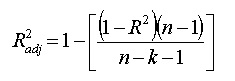

In [439]:
#Calculating R^2 for validation set
validation_R2=lm.score(X_val,y_val)
print("The R^2 value is:", validation_R2)

#Calculating the adjusted R^2 for validation set
Adjusted_validation_R2= 1 - (1-validation_R2)*(len(y_val)-1)/(len(y_val)-X_val.shape[1]-1)
print("The adjusted R^2 value is:", Adjusted_validation_R2)

The R^2 value is: 0.8863326804652081
The adjusted R^2 value is: 0.8861612600491288


In [440]:
#Calculating the adjusted R^2
#Adjusted_training_R2=1 - (1-training_R2*(33657-1)/(33657-11-1))
#print(Adjusted_training_R2)

In [441]:
# Predict the target variables using the validation data
y_val_pred = lm.predict(X_val)

In [442]:
# Calculating the RMSE value for validation set
lm_error = sqrt(mean_squared_error(y_val, y_val_pred))
print("The root_mean_square error is:", lm_error)

The root_mean_square error is: 0.11032582703304927


In [443]:
# Define a function to plot the results. 
def result_plot(y_predict, y_real, n_points=1000):
    names = ['VSH', 'PHIF', 'SW']
    RMSE, R2 = [], []
    
    for i,name in enumerate(names):
        RMSE.append(np.sqrt(mean_squared_error(y_real[:,i], y_predict[:,i])))
        R2.append(r2_score(y_real[:,i], y_predict[:,i])) # Find the R2 and RMSE for each of the predicted variable 
        er=abs(y_real[:,i]- y_predict[:,i])
    
    # check the accuracy of predicted data and plot the result
    print('RMSE:', '{:.5f}'.format(np.sqrt(mean_squared_error(y_real, y_predict))))
    for i,name in enumerate(names):
        print(f'    {name:5s} : {RMSE[i]:.5f}')
#     print("-"*65)
    
    print( 'R^2: ', r2_score(y_real, y_predict))
    for i,name in enumerate(names):
        print(f'    {name:5s} : {R2[i]:.5f}')
    
    plt.subplots(nrows=3, ncols=2, figsize=(16,16))

    for i,name in enumerate(names):       
        plt.subplot(3, 2, i*2+1)
        plt.plot(y_real[:n_points, i])
        plt.plot(y_predict[:n_points, i])
        plt.legend(['True', 'Predicted'])
        plt.xlabel('Sample')
        plt.ylabel(name)
        plt.title(name+' Prediction Comparison')

        plt.subplot(3, 2, i*2+2)
        plt.scatter(y_real[:, i], y_predict[:, i], c=er)
        plt.xlabel('Real Value')
        plt.ylabel('Predicted Value')
        plt.title(name+' Prediction Comparison')
    
    plt.show()

RMSE: 0.11024
    VSH   : 0.03686
    PHIF  : 0.01422
    SW    : 0.18680
R^2:  0.8856321667326125
    VSH   : 0.96022
    PHIF  : 0.96960
    SW    : 0.72708


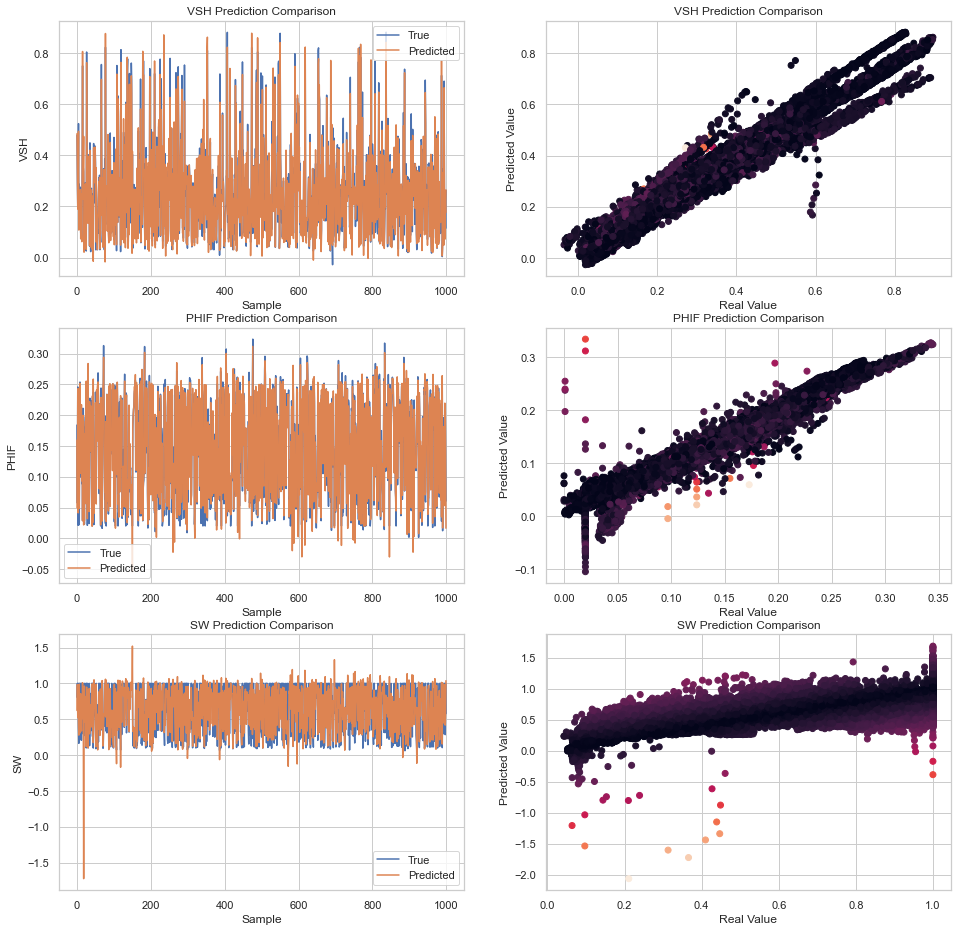

In [444]:
result_plot(y_pred_train, y_train.to_numpy(), n_points=1000) #The correlation for SW is low

In [445]:
#Calculating R^2
training_R2=lm.score(X_train,y_train)
print("The R^2 value is:", training_R2)

#Calculating the adjusted R^2
Adjusted_training_R2= 1 - (1-training_R2)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("The R^2 value is:", Adjusted_training_R2)

The R^2 value is: 0.8856321667326125
The R^2 value is: 0.8855890947603466


In [446]:
# Adjusted R2 codes
#1 - (1-model.score(X, y))*(len(y)-1)/(len(y)-X.shape[1]-1)

In [447]:
### Lets plot the results for the validation set as well 

RMSE: 0.11033
    VSH   : 0.03720
    PHIF  : 0.01373
    SW    : 0.18693
R^2:  0.8863326804652081
    VSH   : 0.95922
    PHIF  : 0.97146
    SW    : 0.72831


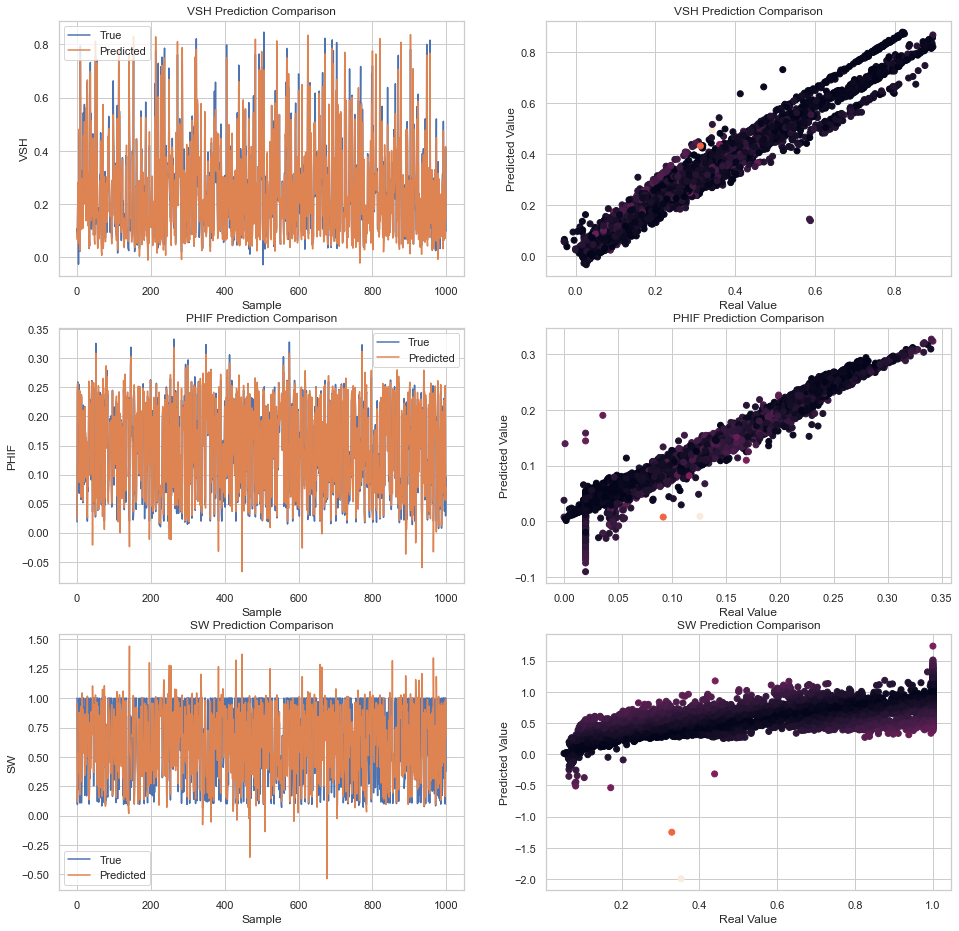

In [448]:
result_plot(y_val_pred, y_val.to_numpy(), n_points=1000)

In [449]:
#Calculating R^2 for validation set
validation_R2=lm.score(X_val,y_val)
print("The R^2 value is:", validation_R2)

#Calculating the adjusted R^2 for validation set
Adjusted_validation_R2= 1 - (1-validation_R2)*(len(y_val)-1)/(len(y_val)-X_val.shape[1]-1)
print("The adjusted R^2 value is:", Adjusted_validation_R2)

The R^2 value is: 0.8863326804652081
The adjusted R^2 value is: 0.8861612600491288


In [450]:
# Let us explore other plots for the results from the validation set

In [451]:
#er1=abs(y_val['VSH'] - y_val_pred['VSH'])  
#er2=abs(y_val['SW'] - y_val_pred['SW'])
#er3=abs(y_val['PHIF'] - y_val_pred['PHIF'])
   
# A plot of predicted and actual ROP values for different number of neighbors (K-values)
#fig = plt.figure( figsize=(6, 6))
#plt.axis([0, 50, 0, 50])
#plt.scatter(y_val, y_val_pred, c = (er1,er2,er3))
#plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
#plt.ylabel('Predicted ROP') # Predicted values on y axis
#plt.xlabel('Measured ROP') 
#plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%( training_R2, test_R2))/// """"

### K-Nearest Neighbours

In [452]:
# We would deploy a build a basic model and boost with cross-validation
from sklearn import neighbors
KNN_regressor= neighbors.KNeighborsRegressor(n_neighbors = 5)

In [453]:
from sklearn.model_selection import KFold
cv = KFold(n_splits=5, shuffle = True, random_state=125) #We would employ a 5-fold cross-validation

from sklearn.model_selection import GridSearchCV

param_grid = { 'n_neighbors': [10, 20, 30], 'weights': ['uniform', 'distance'], 'metric':['euclidean','manhattan','minkowski']}
grid = GridSearchCV(KNN_regressor, param_grid=param_grid, cv=cv, verbose=3)

In [454]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV 1/5] END metric=euclidean, n_neighbors=10, weights=uniform;, score=0.979 total time=   0.9s
[CV 2/5] END metric=euclidean, n_neighbors=10, weights=uniform;, score=0.977 total time=   0.8s
[CV 3/5] END metric=euclidean, n_neighbors=10, weights=uniform;, score=0.975 total time=   0.8s
[CV 4/5] END metric=euclidean, n_neighbors=10, weights=uniform;, score=0.975 total time=   0.8s
[CV 5/5] END metric=euclidean, n_neighbors=10, weights=uniform;, score=0.979 total time=   1.2s
[CV 1/5] END metric=euclidean, n_neighbors=10, weights=distance;, score=0.983 total time=   0.8s
[CV 2/5] END metric=euclidean, n_neighbors=10, weights=distance;, score=0.981 total time=   0.8s
[CV 3/5] END metric=euclidean, n_neighbors=10, weights=distance;, score=0.979 total time=   0.9s
[CV 4/5] END metric=euclidean, n_neighbors=10, weights=distance;, score=0.979 total time=   0.8s
[CV 5/5] END metric=euclidean, n_neighbors=10, weights=distance;, score

[CV 1/5] END metric=minkowski, n_neighbors=30, weights=distance;, score=0.973 total time=   1.1s
[CV 2/5] END metric=minkowski, n_neighbors=30, weights=distance;, score=0.971 total time=   1.2s
[CV 3/5] END metric=minkowski, n_neighbors=30, weights=distance;, score=0.969 total time=   1.9s
[CV 4/5] END metric=minkowski, n_neighbors=30, weights=distance;, score=0.969 total time=   1.8s
[CV 5/5] END metric=minkowski, n_neighbors=30, weights=distance;, score=0.972 total time=   1.6s


GridSearchCV(cv=KFold(n_splits=5, random_state=125, shuffle=True),
             estimator=KNeighborsRegressor(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [10, 20, 30],
                         'weights': ['uniform', 'distance']},
             verbose=3)

In [455]:
KNN_cv_results = pd.DataFrame(grid.cv_results_)

cv_results_slct=KNN_cv_results[['param_n_neighbors','param_weights','param_metric','mean_test_score']] #add mean_test_score to data
cv_results_slct.sort_values(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

,param_n_neighbors,param_weights,param_metric,mean_test_score
7,10,distance,manhattan,0.985578
6,10,uniform,manhattan,0.982085
9,20,distance,manhattan,0.980770
13,10,distance,minkowski,0.980727
1,10,distance,euclidean,0.980727


In [456]:
# The best is shown below
KNN_best_model=grid.best_estimator_

In [457]:
y_best_model_train_pred=KNN_best_model.predict(X_train)

In [458]:
y_best_model_val_pred=KNN_best_model.predict(X_val)

RMSE: 0.00000
    VSH   : 0.00000
    PHIF  : 0.00000
    SW    : 0.00000
R^2:  1.0
    VSH   : 1.00000
    PHIF  : 1.00000
    SW    : 1.00000


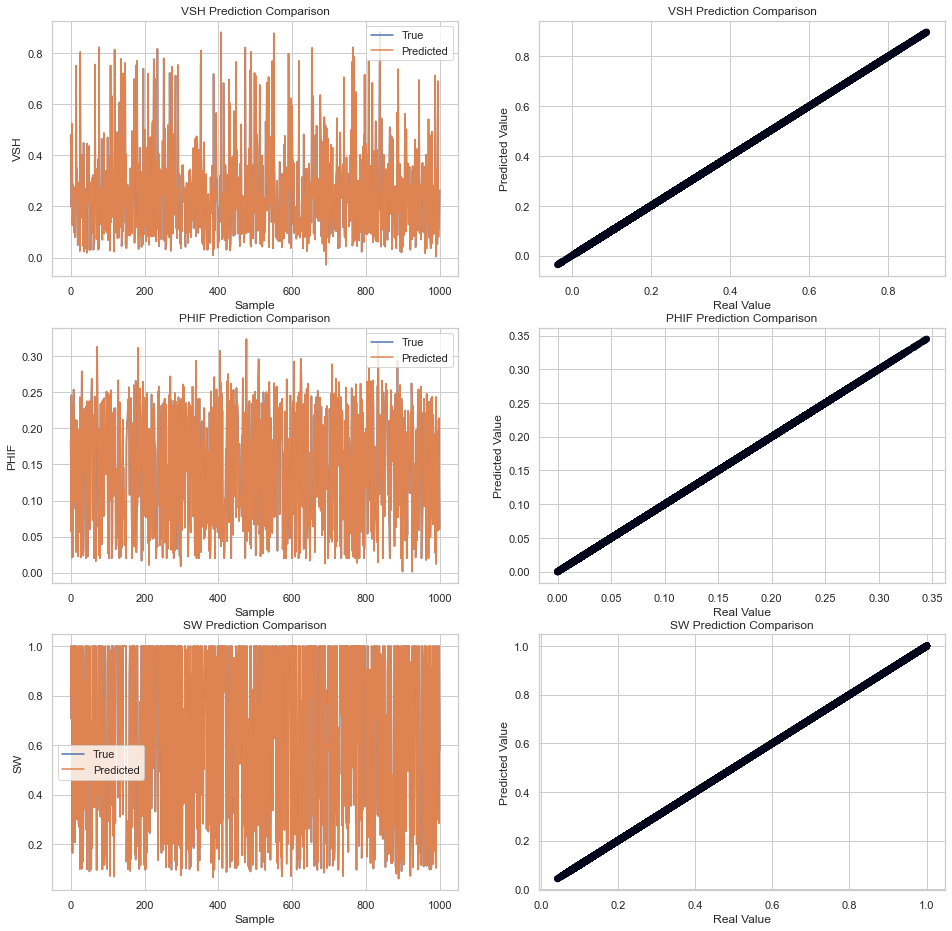

In [459]:
# Now lets see the performance of the best estimator
result_plot(y_best_model_train_pred, y_train.to_numpy(), n_points=1000)

In [460]:
#Calculating R^2
KNN_training_R2=KNN_best_model.score(X_train,y_train)
print("The R^2 value is:", KNN_training_R2)

#Calculating the adjusted R^2
Adjusted_KNN_training_R2= 1 - (1-KNN_training_R2)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("The R^2 value is:", Adjusted_KNN_training_R2)

The R^2 value is: 1.0
The R^2 value is: 1.0


RMSE: 0.03111
    VSH   : 0.01879
    PHIF  : 0.00763
    SW    : 0.04992
R^2:  0.9871395212107937
    VSH   : 0.98959
    PHIF  : 0.99120
    SW    : 0.98063


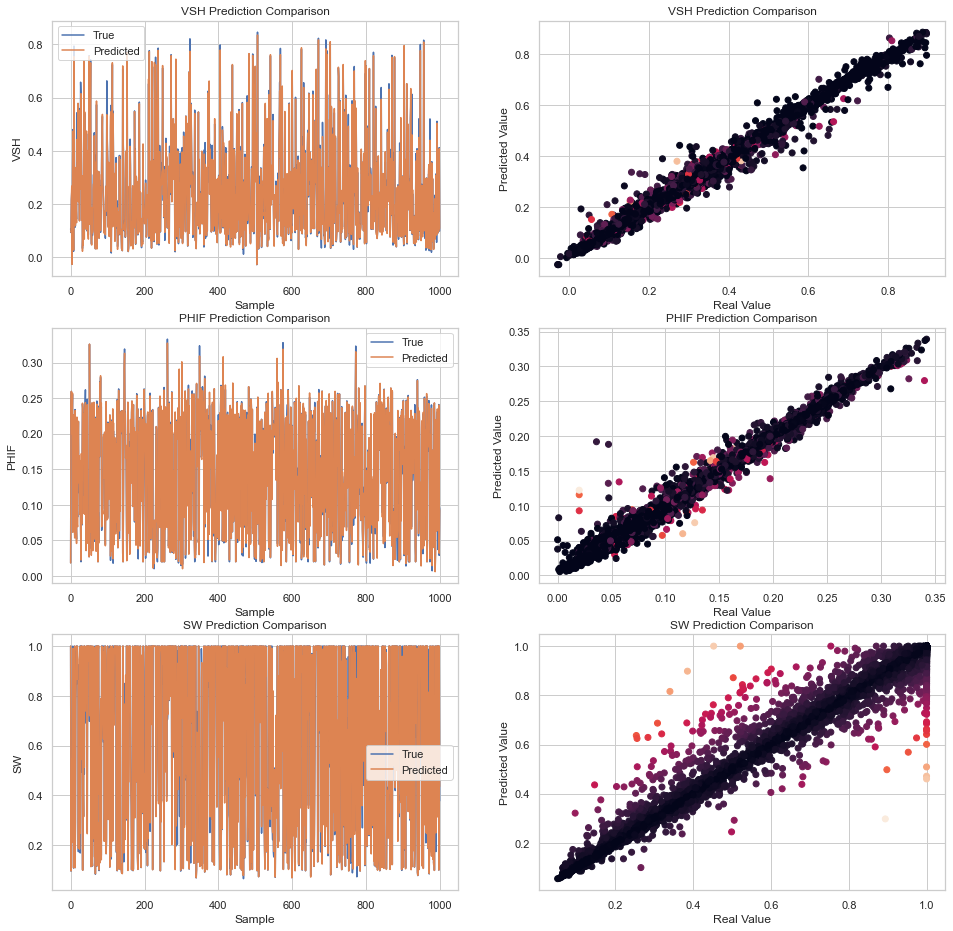

In [461]:
result_plot(y_best_model_val_pred, y_val.to_numpy(), n_points=1000)

In [462]:
#Calculating R^2 for validation set
KNN_validation_R2=KNN_best_model.score(X_val,y_val)
print("The R^2 value is:", KNN_validation_R2)

#Calculating the adjusted R^2 for validation set
KNN_Adjusted_validation_R2= 1 - (1-KNN_validation_R2)*(len(y_val)-1)/(len(y_val)-X_val.shape[1]-1)
print("The adjusted R^2 value is:", KNN_Adjusted_validation_R2)

The R^2 value is: 0.9871395212107937
The adjusted R^2 value is: 0.9871201264662528


#### Support Vector Machine

In [463]:
from sklearn.svm import SVR
SVM_regressor = SVR(kernel = 'rbf')

In [464]:
SVM_cv = KFold(n_splits=5, shuffle = True, random_state=200)

In [465]:
param_grid_SVM = { 'kernel': ['rbf','poly','sigmoid'], 'gamma': ['scale','auto']}

grid_SVM=GridSearchCV(SVM_regressor,param_grid_SVM, cv=SVM_cv, verbose=3 )

##### Train for Volume of Shale

In [466]:
grid_SVM.fit(X_train,y_train['VSH'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.944 total time=   0.9s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.943 total time=   0.9s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.940 total time=   0.9s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.941 total time=   0.9s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.939 total time=   0.9s
[CV 1/5] END ..........gamma=scale, kernel=poly;, score=0.814 total time= 1.2min
[CV 2/5] END .........gamma=scale, kernel=poly;, score=-0.417 total time= 1.5min
[CV 3/5] END .........gamma=scale, kernel=poly;, score=-0.067 total time= 2.4min
[CV 4/5] END ..........gamma=scale, kernel=poly;, score=0.886 total time= 2.2min
[CV 5/5] END ..........gamma=scale, kernel=poly;, score=0.813 total time= 1.9min
[CV 1/5] END gamma=scale, kernel=sigmoid;, score=-1496143.640 total time= 1.1min
[CV 2/5] END gamma=scale, kernel=sigmoid;, score=

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [467]:
#SVM_cv_results = pd.DataFrame(grid.cv_results_)

#cv_results_SVM=SVM_cv_results[['param_kernel','param_gamma','mean_test_score']] #add mean_test_score to data
#cv_results_SVM.sort_values(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

In [468]:
grid_SVM.best_estimator_

SVR(gamma='auto')

In [469]:
SVM_regressor_best=grid_SVM.best_estimator_

In [470]:
y_SVM_train_pred_VSH=SVM_regressor_best.predict(X_train)

y_SVM_val_pred_VSH=SVM_regressor_best.predict(X_val)

In [471]:
#plt.scatter(X_val, y_val, color = 'magenta')
#plt.plot(X_val, y_SVM_val_pred_VSH, color = 'green')
#plt.title('Support Vector Prediction for Volume of Shale')
#plt.xlabel('Predictors')
#plt.ylabel('Volume of Shale')
#plt.show()

In [472]:
y_SVM_train_pred_VSH

array([0.43344743, 0.35905759, 0.23629287, ..., 0.39876638, 0.06476987,
       0.80477475])

##### Train for Volume of Porosity

In [473]:
grid_SVM.fit(X_train,y_train['PHIF'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.511 total time=   0.1s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.520 total time=   0.1s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.535 total time=   0.1s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.515 total time=   0.1s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.517 total time=   0.1s
[CV 1/5] END ..........gamma=scale, kernel=poly;, score=0.481 total time=   0.4s
[CV 2/5] END ..........gamma=scale, kernel=poly;, score=0.477 total time=   0.4s
[CV 3/5] END ..........gamma=scale, kernel=poly;, score=0.483 total time=   0.3s
[CV 4/5] END ..........gamma=scale, kernel=poly;, score=0.494 total time=   0.5s
[CV 5/5] END ..........gamma=scale, kernel=poly;, score=0.490 total time=   0.5s
[CV 1/5] END gamma=scale, kernel=sigmoid;, score=-7918708.492 total time=  46.7s
[CV 2/5] END gamma=scale, kernel=sigmoid;, score=

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [474]:
SVM_regressor_best1=grid_SVM.best_estimator_

In [475]:
y_SVM_train_pred_PHIF=SVM_regressor_best1.predict(X_train)

y_SVM_val_pred_PHIF=SVM_regressor_best1.predict(X_val)

In [476]:
y_SVM_train_pred_PHIF_df=pd.DataFrame(y_SVM_train_pred_PHIF, columns=['A'])

In [477]:
y_SVM_train_pred_PHIF_df.isna().sum()

A    0
dtype: int64

#### Train for water saturation

In [478]:
grid_SVM.fit(X_train,y_train['SW'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.951 total time=  10.8s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.949 total time=  10.6s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.949 total time=  11.0s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.951 total time=  10.9s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.951 total time=  10.7s
[CV 1/5] END .........gamma=scale, kernel=poly;, score=-0.238 total time= 2.6min
[CV 2/5] END .........gamma=scale, kernel=poly;, score=-7.316 total time= 3.7min
[CV 3/5] END .........gamma=scale, kernel=poly;, score=-0.841 total time= 3.5min
[CV 4/5] END .........gamma=scale, kernel=poly;, score=-0.784 total time= 3.1min
[CV 5/5] END ..........gamma=scale, kernel=poly;, score=0.120 total time= 2.8min
[CV 1/5] END .gamma=scale, kernel=sigmoid;, score=-496702.773 total time=  46.8s
[CV 2/5] END .gamma=scale, kernel=sigmoid;, score

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [479]:
SVM_regressor_best2=grid_SVM.best_estimator_

In [480]:
y_SVM_train_pred_SW=SVM_regressor_best2.predict(X_train)

y_SVM_val_pred_SW=SVM_regressor_best2.predict(X_val)

In [481]:
y_SVM_train_pred_VSH_df=pd.DataFrame(y_SVM_train_pred_VSH, columns=['b'])

In [482]:
y_SVM_train_pred_VSH_df.isna().sum()

b    0
dtype: int64

In [483]:
y_SVM_train_pred_VSH_df = pd.DataFrame (y_SVM_train_pred_VSH, columns = ['VSH']) 
y_SVM_train_pred_PHIF_df = pd.DataFrame (y_SVM_train_pred_PHIF, columns = ['PHIF']) 
y_SVM_train_pred_SW_df = pd.DataFrame (y_SVM_train_pred_SW, columns = ['SW'])


In [484]:
y_SVM_train_pred=y_SVM_train_pred_VSH_df.join(y_SVM_train_pred_PHIF_df['PHIF'])

In [485]:
y_SVM_train_pred=y_SVM_train_pred.join(y_SVM_train_pred_SW_df['SW'])

In [486]:
y_SVM_train_pred

,VSH,PHIF,SW
0,0.433447,0.136263,0.848474
1,0.359058,0.105541,1.054796
2,0.236293,0.175901,0.741842
3,0.261638,0.113119,1.068860
4,0.465718,0.159142,0.336522
...,...,...,...
29215,0.084573,0.151380,0.174317
29216,0.122870,0.098029,0.883820
29217,0.398766,0.210180,0.553867
29218,0.064770,0.125853,0.074473


In [487]:
y_SVM_val_pred_VSH_df = pd.DataFrame (y_SVM_val_pred_VSH, columns = ['VSH']) 
y_SVM_val_pred_PHIF_df = pd.DataFrame (y_SVM_val_pred_PHIF, columns = ['PHIF']) 
y_SVM_val_pred_SW_df = pd.DataFrame (y_SVM_val_pred_SW, columns = ['SW'])

In [488]:
y_SVM_val_pred=y_SVM_val_pred_VSH_df.join(y_SVM_val_pred_PHIF_df['PHIF'])

y_SVM_val_pred=y_SVM_val_pred.join(y_SVM_val_pred_SW_df['SW'])

y_SVM_val_pred

,VSH,PHIF,SW
0,0.138890,0.099831,1.019661
1,0.109320,0.175916,0.150817
2,0.190389,0.183769,0.367817
3,0.284900,0.141738,0.519347
4,0.051985,0.144997,0.307088
...,...,...,...
7301,0.094133,0.147380,0.931654
7302,0.092320,0.139757,0.427592
7303,0.159357,0.138534,0.306541
7304,0.244259,0.141116,0.365087


In [489]:
y_SVM_train_pred.isna().sum()

VSH     0
PHIF    0
SW      0
dtype: int64

RMSE: 0.05982
    VSH   : 0.04403
    PHIF  : 0.05632
    SW    : 0.07499
R^2:  0.8075183256610893
    VSH   : 0.94322
    PHIF  : 0.52332
    SW    : 0.95601


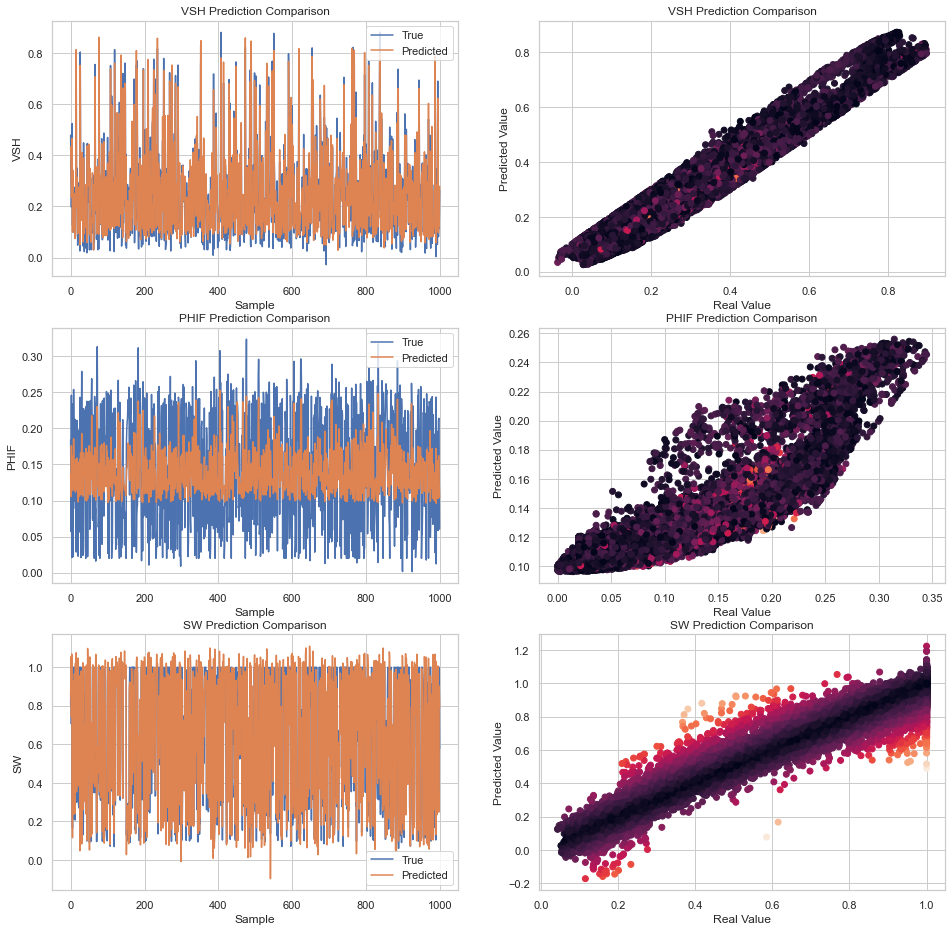

In [490]:
# Now lets see the performance of the best estimator
result_plot(y_SVM_train_pred.to_numpy(), y_train.to_numpy(), n_points=1000)

RMSE: 0.06153
    VSH   : 0.04515
    PHIF  : 0.05614
    SW    : 0.07854
R^2:  0.805089438020619
    VSH   : 0.93992
    PHIF  : 0.52330
    SW    : 0.95204


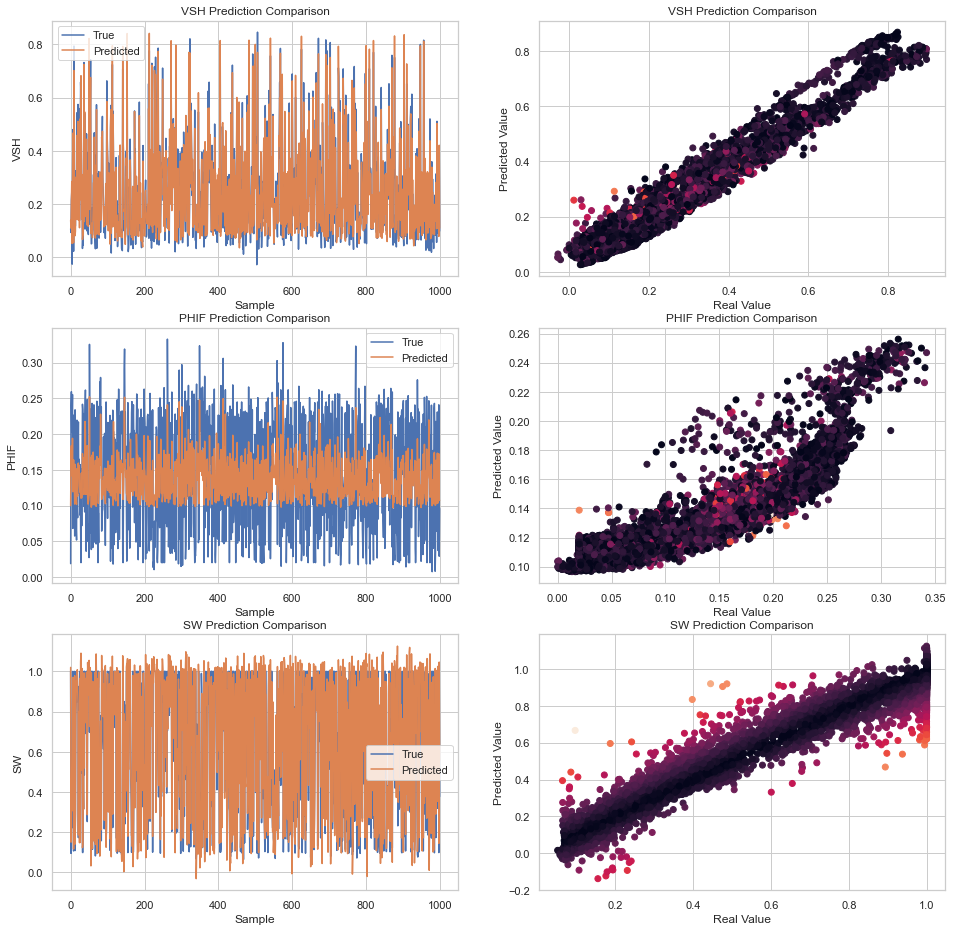

In [491]:
result_plot(y_SVM_val_pred.to_numpy(), y_val.to_numpy(), n_points=1000)

#### Support Vector Machine with PCA

In [492]:
# Creating a new dataset

In [579]:
PCA_train_data=reg_train_new[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF','VSH','PHIF','SW']]

In [580]:
PCA_train_Predictors=PCA_train_data[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']]

In [581]:
from sklearn.decomposition import PCA

In [582]:
# Apply PCA to reduce the dimensionality
pca = PCA(n_components=9)
SVM_pca = pca.fit_transform(PCA_train_Predictors)

In [583]:
print('Variance of each component:', pca.explained_variance_ratio_)
print('\n Total Variance Explained:', (sum(list(pca.explained_variance_ratio_))*100))

Variance of each component: [0.26701953 0.23269613 0.15594746 0.09640176 0.06300273 0.05363157
 0.0377136  0.03256486 0.02591114]

 Total Variance Explained: 96.48887918709063


In [584]:
SVM_pca_df=pd.DataFrame(SVM_pca, columns=['PCA_1','PCA_2','PCA_3','PCA_4','PCA_5','PCA_6','PCA_7','PCA_8','PCA_9'])

In [585]:
SVM_pca_df.head()

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9
0,-1.742828,-6.988318,1.999572,0.109555,0.744232,6.256613,0.695326,-0.986769,0.615044
1,-2.129860,-6.099302,1.957476,0.008724,0.730849,5.528568,0.996998,-1.195492,0.094560
2,-2.185881,-6.272408,2.069056,-0.016379,0.784401,5.818033,1.044979,-1.284006,0.128738
3,-3.220124,-5.493369,1.982962,-0.015195,0.701266,6.319424,-0.067298,-1.888095,-0.405760
4,-2.819689,-4.914353,2.386155,-0.405028,0.948815,5.671028,0.277265,-1.845701,0.460867


In [586]:
SVM_pca_df=SVM_pca_df.join(PCA_train_data[['VSH','PHIF','SW']])

In [587]:
SVM_pca_df

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,VSH,PHIF,SW
0,-1.742828,-6.988318,1.999572,0.109555,0.744232,6.256613,0.695326,-0.986769,0.615044,0.729942,0.000000,1.0
1,-2.129860,-6.099302,1.957476,0.008724,0.730849,5.528568,0.996998,-1.195492,0.094560,0.718504,0.000000,1.0
2,-2.185881,-6.272408,2.069056,-0.016379,0.784401,5.818033,1.044979,-1.284006,0.128738,0.702326,0.000000,1.0
3,-3.220124,-5.493369,1.982962,-0.015195,0.701266,6.319424,-0.067298,-1.888095,-0.405760,0.404779,0.000000,1.0
4,-2.819689,-4.914353,2.386155,-0.405028,0.948815,5.671028,0.277265,-1.845701,0.460867,0.310032,0.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
36521,-1.956334,1.522824,-0.950622,-0.118122,0.299509,0.031460,0.079610,0.907945,-0.208979,0.273600,0.028313,1.0
36522,-1.929178,1.784028,-1.048159,-0.118388,0.276671,-0.193071,0.030432,0.876006,-0.176332,0.234400,0.027530,1.0
36523,-1.892833,1.731856,-0.996704,-0.108088,0.232860,-0.283269,0.008830,0.682243,-0.196425,0.205400,0.023795,1.0
36524,-1.946573,1.847305,-0.950698,-0.141269,0.240260,-0.302430,0.000704,0.580029,-0.336510,0.179300,0.022048,1.0


In [588]:
SVM_pca_df.isna().sum()

PCA_1    0
PCA_2    0
PCA_3    0
PCA_4    0
PCA_5    0
PCA_6    0
PCA_7    0
PCA_8    0
PCA_9    0
VSH      0
PHIF     0
SW       0
dtype: int64

In [589]:
from sklearn.model_selection import train_test_split
train2 , test2 = train_test_split(SVM_pca_df, test_size = 0.15, random_state = 30)

x2_train = train2.drop('VSH', axis=1)
x2_train = train2.drop('PHIF', axis=1)
x2_train = train2.drop('SW', axis=1)
y2_train = train2[['VSH','PHIF','SW']]             

x2_val = test2.drop('VSH', axis=1)
x2_val = test2.drop('PHIF', axis=1)
x2_val = test2.drop('SW', axis=1)
y2_val = test2[['VSH','PHIF','SW']]

In [590]:
#y2_train.head()

In [591]:
from sklearn.svm import SVR
from sklearn.model_selection import KFold
SVM_reg_PCA = SVR(kernel = 'rbf')

SVM_pca_cv = KFold(n_splits=5, shuffle = True, random_state=200)

param_grid_svm_pca = { 'kernel': ['rbf','poly','sigmoid'], 'gamma': ['scale','auto']}

grid_SVM_pca =GridSearchCV(SVM_reg_PCA, param_grid_svm_pca, cv=SVM_pca_cv, verbose=3 )

#### Train for VSH

In [592]:
grid_SVM_pca.fit(x2_train,y2_train['VSH'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.947 total time=   0.5s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.951 total time=   0.6s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.952 total time=   0.5s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.949 total time=   0.6s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.953 total time=   0.5s
[CV 1/5] END ..........gamma=scale, kernel=poly;, score=0.529 total time= 1.4min
[CV 2/5] END ..........gamma=scale, kernel=poly;, score=0.867 total time= 1.8min
[CV 3/5] END ..........gamma=scale, kernel=poly;, score=0.260 total time= 1.1min
[CV 4/5] END ..........gamma=scale, kernel=poly;, score=0.629 total time= 1.0min
[CV 5/5] END ..........gamma=scale, kernel=poly;, score=0.914 total time= 1.8min
[CV 1/5] END gamma=scale, kernel=sigmoid;, score=-2065969.203 total time=  56.7s
[CV 2/5] END gamma=scale, kernel=sigmoid;, score=

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [593]:
SVM_reg_pca_best=grid_SVM_pca.best_estimator_



y_SVM_pca_train_pred_VSH=SVM_reg_pca_best.predict(x2_train)

y_SVM_pca_val_pred_VSH=SVM_reg_pca_best.predict(x2_val)

#plt.scatter(X_val, y_val, color = 'magenta')
#plt.plot(X_val, y_SVM_val_pred_VSH, color = 'green')
#plt.title('Support Vector Prediction for Volume of Shale')
#plt.xlabel('Predictors')
#plt.ylabel('Volume of Shale')
#plt.show()

#### Train for Porosity

In [594]:
grid_SVM_pca.fit(x2_train,y2_train['PHIF'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.528 total time=   0.1s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.511 total time=   0.1s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.525 total time=   0.0s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.515 total time=   0.1s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.521 total time=   0.1s
[CV 1/5] END ..........gamma=scale, kernel=poly;, score=0.567 total time=   0.9s
[CV 2/5] END ..........gamma=scale, kernel=poly;, score=0.547 total time=   1.9s
[CV 3/5] END ..........gamma=scale, kernel=poly;, score=0.518 total time=   1.1s
[CV 4/5] END ..........gamma=scale, kernel=poly;, score=0.563 total time=   1.7s
[CV 5/5] END ..........gamma=scale, kernel=poly;, score=0.576 total time=   0.9s
[CV 1/5] END gamma=scale, kernel=sigmoid;, score=-10676072.010 total time=  54.8s
[CV 2/5] END gamma=scale, kernel=sigmoid;, score

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [595]:
SVM_reg_pca_best1=grid_SVM_pca.best_estimator_



y_SVM_pca_train_pred_PHIF=SVM_reg_pca_best1.predict(x2_train)

y_SVM_pca_val_pred_PHIF=SVM_reg_pca_best1.predict(x2_val)

#plt.scatter(X_val, y_val, color = 'magenta')
#plt.plot(X_val, y_SVM_val_pred_VSH, color = 'green')
#plt.title('Support Vector Prediction for Volume of Shale')
#plt.xlabel('Predictors')
#plt.ylabel('Volume of Shale')
#plt.show()

#### Train for Water Saturation (SW)

In [596]:
grid_SVM_pca.fit(x2_train,y2_train['SW'])

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END ...........gamma=scale, kernel=rbf;, score=0.944 total time=  12.2s
[CV 2/5] END ...........gamma=scale, kernel=rbf;, score=0.945 total time=  13.9s
[CV 3/5] END ...........gamma=scale, kernel=rbf;, score=0.944 total time=  13.2s
[CV 4/5] END ...........gamma=scale, kernel=rbf;, score=0.945 total time=  12.8s
[CV 5/5] END ...........gamma=scale, kernel=rbf;, score=0.948 total time=  13.4s
[CV 1/5] END .........gamma=scale, kernel=poly;, score=-4.518 total time= 7.7min
[CV 2/5] END ..........gamma=scale, kernel=poly;, score=0.123 total time= 3.1min
[CV 3/5] END ..........gamma=scale, kernel=poly;, score=0.069 total time= 4.8min
[CV 4/5] END .........gamma=scale, kernel=poly;, score=-8.068 total time= 2.8min
[CV 5/5] END .........gamma=scale, kernel=poly;, score=-0.686 total time= 7.0min
[CV 1/5] END .gamma=scale, kernel=sigmoid;, score=-566800.790 total time=  56.8s
[CV 2/5] END .gamma=scale, kernel=sigmoid;, score

GridSearchCV(cv=KFold(n_splits=5, random_state=200, shuffle=True),
             estimator=SVR(),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=3)

In [597]:
SVM_reg_pca_best2=grid_SVM_pca.best_estimator_



y_SVM_pca_train_pred_SW=SVM_reg_pca_best2.predict(x2_train)

y_SVM_pca_val_pred_SW=SVM_reg_pca_best2.predict(x2_val)

#plt.scatter(X_val, y_val, color = 'magenta')
#plt.plot(X_val, y_SVM_val_pred_VSH, color = 'green')
#plt.title('Support Vector Prediction for Volume of Shale')
#plt.xlabel('Predictors')
#plt.ylabel('Volume of Shale')
#plt.show()

In [598]:
y_SVM_pca_train_pred_VSH_df = pd.DataFrame (y_SVM_pca_train_pred_VSH, columns = ['VSH']) 
y_SVM_pca_train_pred_PHIF_df = pd.DataFrame (y_SVM_pca_train_pred_PHIF, columns = ['PHIF']) 
y_SVM_pca_train_pred_SW_df = pd.DataFrame (y_SVM_pca_train_pred_SW, columns = ['SW'])


y_SVM_PCA_train_pred=y_SVM_pca_train_pred_VSH_df.join(y_SVM_pca_train_pred_PHIF_df['PHIF'])

y_SVM_PCA_train_pred=y_SVM_PCA_train_pred.join(y_SVM_pca_train_pred_SW_df['SW'])

RMSE: 0.05980
    VSH   : 0.04019
    PHIF  : 0.05302
    SW    : 0.07940
R^2:  0.8268091735657471
    VSH   : 0.95247
    PHIF  : 0.57729
    SW    : 0.95067


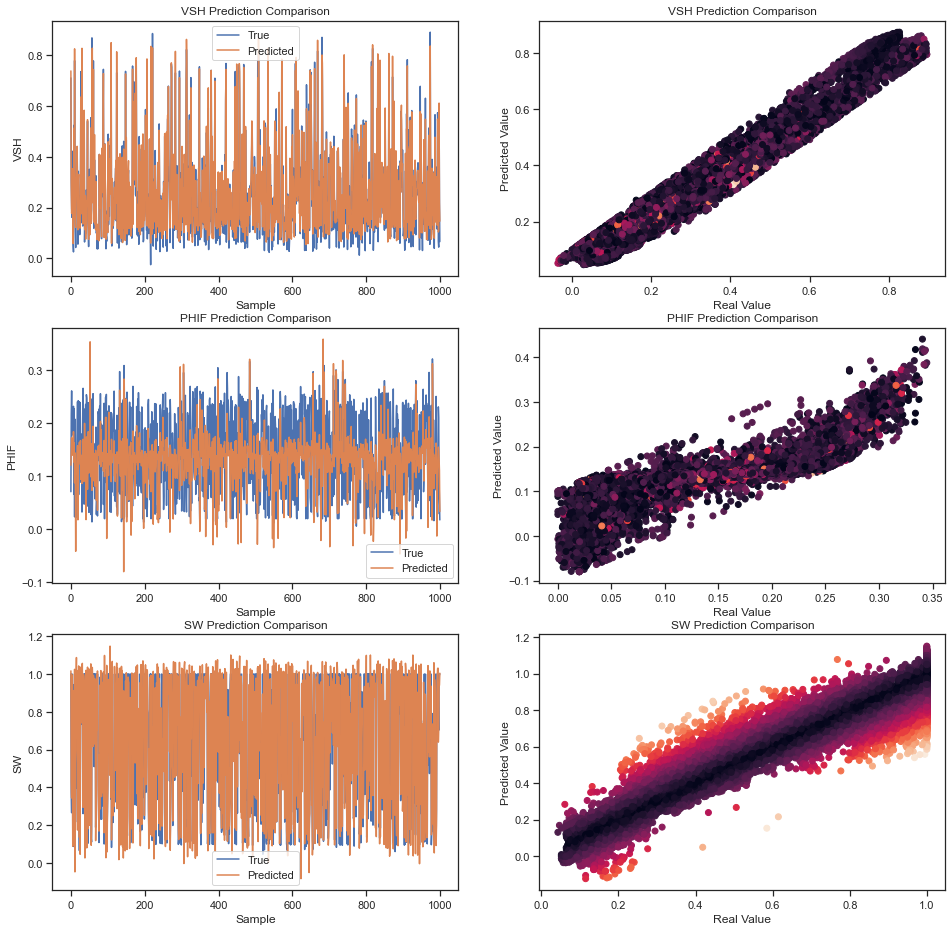

In [599]:
result_plot(y_SVM_PCA_train_pred.to_numpy(), y2_train.to_numpy(), n_points=1000)

In [600]:
y_SVM_pca_val_pred_VSH_df = pd.DataFrame (y_SVM_pca_val_pred_VSH, columns = ['VSH']) 
y_SVM_pca_val_pred_PHIF_df = pd.DataFrame (y_SVM_pca_val_pred_PHIF, columns = ['PHIF']) 
y_SVM_pca_val_pred_SW_df = pd.DataFrame (y_SVM_pca_val_pred_SW, columns = ['SW'])


y_SVM_PCA_val_pred=y_SVM_pca_val_pred_VSH_df.join(y_SVM_pca_val_pred_PHIF_df['PHIF'])

y_SVM_PCA_val_pred=y_SVM_PCA_val_pred.join(y_SVM_pca_val_pred_SW_df['SW'])

RMSE: 0.06122
    VSH   : 0.04020
    PHIF  : 0.05335
    SW    : 0.08235
R^2:  0.8238941086674162
    VSH   : 0.95356
    PHIF  : 0.57060
    SW    : 0.94752


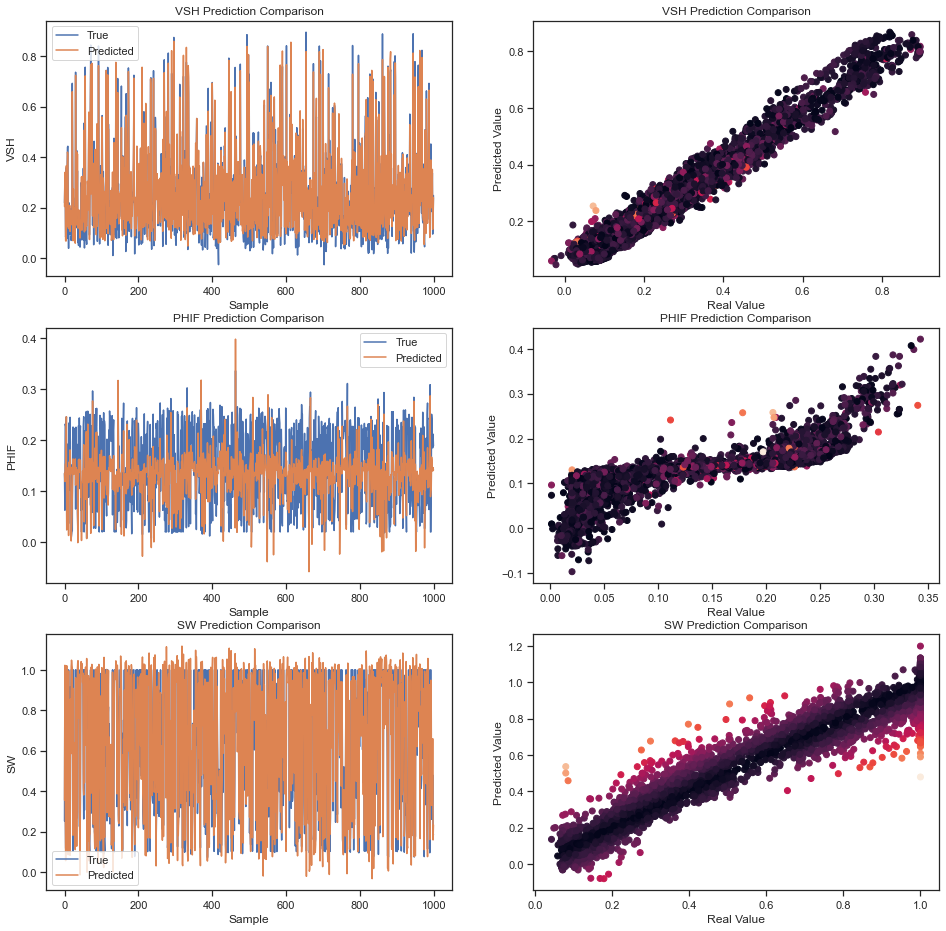

In [601]:
result_plot(y_SVM_PCA_val_pred.to_numpy(), y2_val.to_numpy(), n_points=1000)

##### Random Forest

In [519]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 


RandFst = RandomForestRegressor(n_estimators=100, max_depth=4) # Random Forest model with random hyperparameters


# Going ahead to conduct cross-validation to get a best estimator 

rfcv = KFold(n_splits=5, shuffle = True, random_state=400)


param_grid_rf = { 'bootstrap': [True], 'max_depth': [3,4,5], 'min_samples_split': [5,10,15],'max_samples': [2000, 3000, 4000], 'n_estimators': [100, 500, 1000]}
# dictionary with keys

grid_rf = GridSearchCV(RandFst, param_grid=param_grid_rf, cv=rfcv, verbose=3)


In [520]:
grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[CV 1/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100;, score=0.837 total time=   0.8s
[CV 2/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100;, score=0.822 total time=   0.6s
[CV 3/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100;, score=0.825 total time=   0.6s
[CV 4/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100;, score=0.831 total time=   0.6s
[CV 5/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=100;, score=0.824 total time=   0.7s
[CV 1/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=500;, score=0.837 total time=   3.5s
[CV 2/5] END bootstrap=True, max_depth=3, max_samples=2000, min_samples_split=5, n_estimators=500;, score=0.825 total time=   4.0s
[CV 3/5] END bootstra

[CV 3/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=100;, score=0.822 total time=   0.8s
[CV 4/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=100;, score=0.831 total time=   0.8s
[CV 5/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=100;, score=0.819 total time=   0.8s
[CV 1/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500;, score=0.833 total time=   4.6s
[CV 2/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500;, score=0.822 total time=   4.5s
[CV 3/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500;, score=0.824 total time=   4.5s
[CV 4/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_split=10, n_estimators=500;, score=0.831 total time=   4.6s
[CV 5/5] END bootstrap=True, max_depth=3, max_samples=3000, min_samples_spli

[CV 1/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500;, score=0.830 total time=   5.7s
[CV 2/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500;, score=0.820 total time=   5.7s
[CV 3/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500;, score=0.822 total time=   5.9s
[CV 4/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500;, score=0.830 total time=   5.7s
[CV 5/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=500;, score=0.817 total time=   5.8s
[CV 1/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=1000;, score=0.831 total time=  11.5s
[CV 2/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_split=15, n_estimators=1000;, score=0.819 total time=  11.8s
[CV 3/5] END bootstrap=True, max_depth=3, max_samples=4000, min_samples_sp

[CV 4/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=500;, score=0.900 total time=   7.4s
[CV 5/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=500;, score=0.893 total time=   5.7s
[CV 1/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=1000;, score=0.900 total time=  11.8s
[CV 2/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=1000;, score=0.894 total time=  12.3s
[CV 3/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=1000;, score=0.892 total time=  12.0s
[CV 4/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=1000;, score=0.899 total time=  11.6s
[CV 5/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=5, n_estimators=1000;, score=0.893 total time=  12.3s
[CV 1/5] END bootstrap=True, max_depth=4, max_samples=3000, min_samples_split=

[CV 2/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000;, score=0.892 total time=  15.4s
[CV 3/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000;, score=0.891 total time=  14.5s
[CV 4/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000;, score=0.897 total time=  14.7s
[CV 5/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=10, n_estimators=1000;, score=0.891 total time=  14.7s
[CV 1/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=15, n_estimators=100;, score=0.898 total time=   1.4s
[CV 2/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=15, n_estimators=100;, score=0.891 total time=   1.5s
[CV 3/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_split=15, n_estimators=100;, score=0.890 total time=   1.4s
[CV 4/5] END bootstrap=True, max_depth=4, max_samples=4000, min_samples_

[CV 5/5] END bootstrap=True, max_depth=5, max_samples=2000, min_samples_split=15, n_estimators=1000;, score=0.924 total time=   9.4s
[CV 1/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=100;, score=0.924 total time=   1.3s
[CV 2/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=100;, score=0.919 total time=   1.5s
[CV 3/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=100;, score=0.917 total time=   1.3s
[CV 4/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=100;, score=0.924 total time=   1.2s
[CV 5/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=100;, score=0.920 total time=   1.3s
[CV 1/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, n_estimators=500;, score=0.924 total time=   6.7s
[CV 2/5] END bootstrap=True, max_depth=5, max_samples=3000, min_samples_split=5, 

[CV 3/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=100;, score=0.917 total time=   1.6s
[CV 4/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=100;, score=0.921 total time=   1.6s
[CV 5/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=100;, score=0.919 total time=   1.7s
[CV 1/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=500;, score=0.922 total time=   8.7s
[CV 2/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=500;, score=0.918 total time=   8.8s
[CV 3/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=500;, score=0.916 total time=   8.6s
[CV 4/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_split=10, n_estimators=500;, score=0.921 total time=   8.8s
[CV 5/5] END bootstrap=True, max_depth=5, max_samples=4000, min_samples_spli

GridSearchCV(cv=KFold(n_splits=5, random_state=400, shuffle=True),
             estimator=RandomForestRegressor(max_depth=4),
             param_grid={'bootstrap': [True], 'max_depth': [3, 4, 5],
                         'max_samples': [2000, 3000, 4000],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [100, 500, 1000]},
             verbose=3)

In [521]:
RF_cv_results = pd.DataFrame(grid_rf.cv_results_)

In [522]:
RF_cv_results_slct=RF_cv_results[['param_max_depth','param_min_samples_split','param_n_estimators','param_max_samples','mean_test_score']] #add mean_test_score to data
RF_cv_results_slct.sort_values(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

# The best is shown below
RF_best_model=grid_rf.best_estimator_

y_RF_train_pred=RF_best_model.predict(X_train)

y_RF_val_pred=RF_best_model.predict(X_val)

RMSE: 0.05507
    VSH   : 0.05031
    PHIF  : 0.02694
    SW    : 0.07643
R^2:  0.9237182850970717
    VSH   : 0.92589
    PHIF  : 0.89095
    SW    : 0.95432


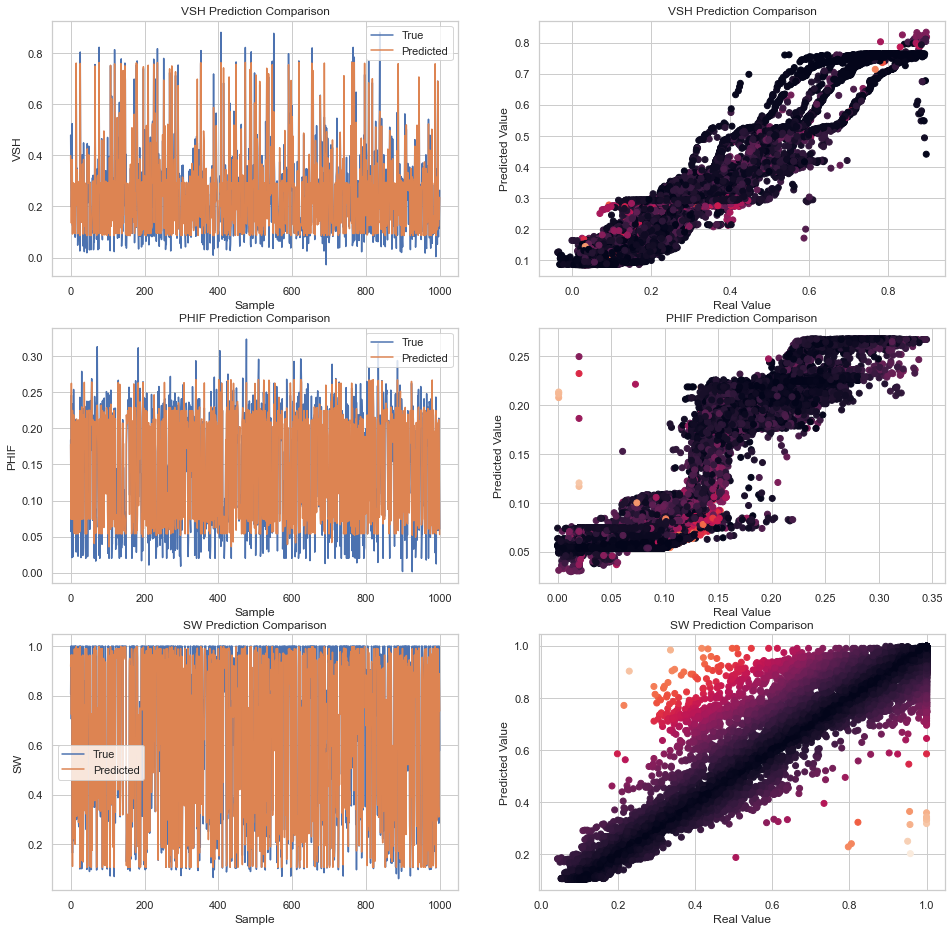

In [523]:
# Now lets see the performance of the best estimator
result_plot(y_RF_train_pred, y_train.to_numpy(), n_points=1000)

In [524]:
#Calculating R^2
RF_training_R2=RF_best_model.score(X_train,y_train)
print("The R^2 value is:", RF_training_R2)

#Calculating the adjusted R^2
Adjusted_RF_training_R2= 1 - (1-RF_training_R2)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("The Adjusted R^2 value is:", Adjusted_RF_training_R2)

The R^2 value is: 0.9237182850970717
The Adjusted R^2 value is: 0.9236895567054004


RMSE: 0.05518
    VSH   : 0.05081
    PHIF  : 0.02689
    SW    : 0.07636
R^2:  0.9230629484835312
    VSH   : 0.92392
    PHIF  : 0.89060
    SW    : 0.95467


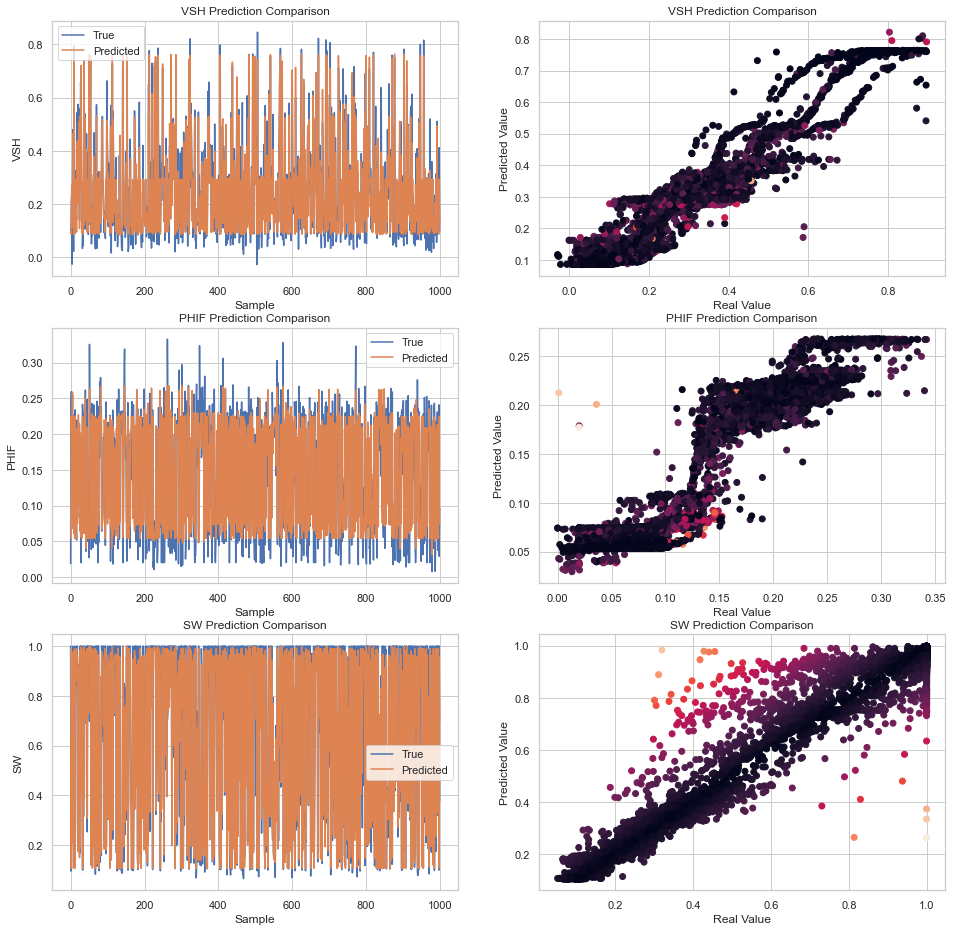

In [525]:
# Now lets see the performance of the best estimator
result_plot(y_RF_val_pred, y_val.to_numpy(), n_points=1000)

In [526]:
#Calculating R^2
RF_validation_R2=RF_best_model.score(X_val,y_val)
print("The R^2 value is:", RF_validation_R2)

#Calculating the adjusted R^2
Adjusted_RF_validation_R2= 1 - (1-RF_validation_R2)*(len(y_val)-1)/(len(y_val)-X_train.shape[1]-1)
print("The R^2 value is:", Adjusted_RF_validation_R2)

The R^2 value is: 0.9230629484835312
The R^2 value is: 0.9229469205747457


#### Feature engineering in random forest

In [527]:
importances = list(RF_best_model.feature_importances_)

Variable: DEN                  Importance: 0.53
Variable: RDEP                 Importance: 0.17
Variable: GR                   Importance: 0.16
Variable: RMED                 Importance: 0.14
Variable: NEU                  Importance: 0.0
Variable: DEPTH                Importance: 0.0
Variable: DTS                  Importance: 0.0
Variable: DTC                  Importance: 0.0
Variable: DENC                 Importance: 0.0
Variable: CALI                 Importance: 0.0
Variable: PEF                  Importance: 0.0


<AxesSubplot:xlabel='Importance', ylabel='Features'>

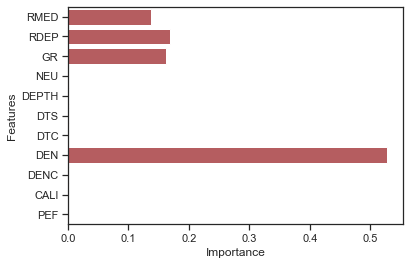

In [528]:
feature_list=list(Train_data[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']].columns)

feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

feature_dataframe = pd.DataFrame(data = feature_list, columns = ['Features'])
feature_dataframe['Importance'] = importances

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="r")

In [529]:
# RMED,RDEP,GR,DENC,NEU,DEPTH,DTC,CALI best predicting parameters
# We would predict using the best parameters and retrain

In [530]:
Param_best=reg_train_new[['RMED','RDEP','GR','DENC','NEU','DEPTH','DTC','CALI','VSH','PHIF','SW']]

In [531]:
#Param_best.head()

In [532]:
from sklearn.model_selection import train_test_split
train1 , test1 = train_test_split(Param_best, test_size = 0.15, random_state = 30)

In [533]:
x1_train = train1.drop('VSH', axis=1)
x1_train = train1.drop('PHIF', axis=1)
x1_train = train1.drop('SW', axis=1)
# Drop DT from the x-variables 
y1_train = train1[['VSH','PHIF','SW']]              # DT is the value being predicted, the y-variable

x1_test = test1.drop('VSH', axis=1)
x1_test = test1.drop('PHIF', axis=1)
x1_test = test1.drop('SW', axis=1)
y1_test = test1[['VSH','PHIF','SW']]

In [534]:
rfTrialMod_bestP= RF_best_model

In [535]:
rfTrialMod_bestP.fit(x1_train, y1_train)

RandomForestRegressor(max_depth=5, max_samples=2000, min_samples_split=5)

In [536]:
ImpFeatures_R2 = rfTrialMod_bestP.score(x1_train, y1_train)

print(ImpFeatures_R2)

0.9389682460782405


In [537]:
Imp_predicted_train= rfTrialMod_bestP.predict(x1_train)
Imp_predicted_test= rfTrialMod_bestP.predict(x1_test)

RMSE: 0.05021
    VSH   : 0.04017
    PHIF  : 0.02499
    SW    : 0.07297
R^2:  0.9389682460782405
    VSH   : 0.95252
    PHIF  : 0.90605
    SW    : 0.95834


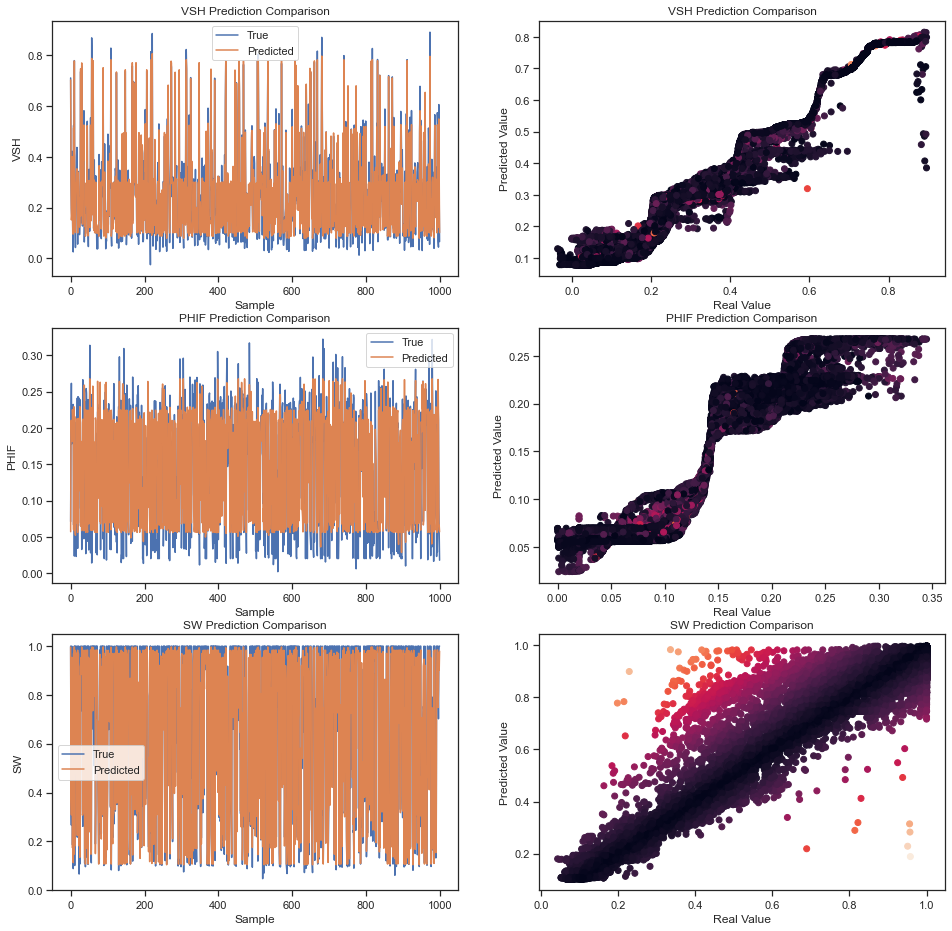

In [538]:
result_plot(Imp_predicted_train, y1_train.to_numpy(), n_points=1000)

In [540]:
#Calculating R^2
RF1_training_R2=rfTrialMod_bestP.score(x1_train, y1_train)
print("The R^2 value is:", RF1_training_R2)

#Calculating the adjusted R^2
Adjusted_RF1_training_R2= 1 - (1-RF1_training_R2)*(len(y1_train)-1)/(len(y1_train)-X_train.shape[1]-1)
print("The Adjusted R^2 value is:", Adjusted_RF1_training_R2)

The R^2 value is: 0.9389682460782405
The Adjusted R^2 value is: 0.9389466140726617


RMSE: 0.04942
    VSH   : 0.03869
    PHIF  : 0.02503
    SW    : 0.07214
R^2:  0.9407182214227056
    VSH   : 0.95697
    PHIF  : 0.90546
    SW    : 0.95973


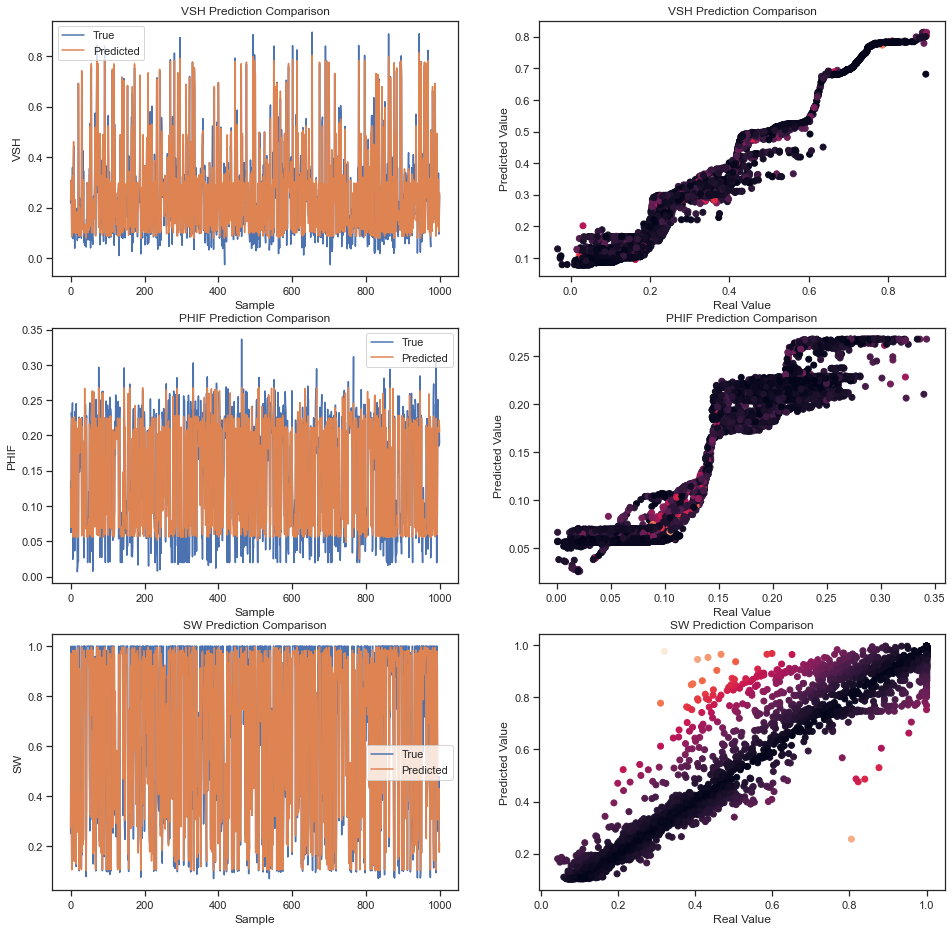

In [541]:
result_plot(Imp_predicted_test, y1_test.to_numpy(), n_points=1000)

In [542]:
#Calculating R^2
RF1_validation_R2=rfTrialMod_bestP.score(x1_test, y1_test)
print("The R^2 value is:", RF1_validation_R2)

#Calculating the adjusted R^2
Adjusted_RF1_validation_R2= 1 - (1-RF1_validation_R2)*(len(y1_test)-1)/(len(y1_test)-X_train.shape[1]-1)
print("The Adjusted R^2 value is:", Adjusted_RF1_validation_R2)

The R^2 value is: 0.9407182214227056
The Adjusted R^2 value is: 0.9405989421901557


#### Gradient Boosting

In [543]:
# GradientBoosting model
from sklearn.multioutput import MultiOutputRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import GradientBoostingRegressor

GBR = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))


In [544]:
gbcv = KFold(n_splits=5, shuffle = True, random_state=250)


param_grid_gb = {'n_jobs':[0,1,2]}
# dictionary with keys

grid_gb = GridSearchCV(GBR, param_grid=param_grid_gb, cv=gbcv, verbose=3)

In [545]:
grid_gb.fit(X_train, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END ............................n_jobs=0;, score=nan total time=   0.0s
[CV 2/5] END ............................n_jobs=0;, score=nan total time=   0.0s
[CV 3/5] END ............................n_jobs=0;, score=nan total time=   0.0s
[CV 4/5] END ............................n_jobs=0;, score=nan total time=   0.0s
[CV 5/5] END ............................n_jobs=0;, score=nan total time=   0.0s
[CV 1/5] END ..........................n_jobs=1;, score=0.986 total time=  22.0s
[CV 2/5] END ..........................n_jobs=1;, score=0.986 total time=  22.2s
[CV 3/5] END ..........................n_jobs=1;, score=0.986 total time=  22.5s
[CV 4/5] END ..........................n_jobs=1;, score=0.988 total time=  20.4s
[CV 5/5] END ..........................n_jobs=1;, score=0.986 total time=  20.8s
[CV 1/5] END ..........................n_jobs=2;, score=0.986 total time=  16.5s
[CV 2/5] END ..........................n_jobs=2;,

GridSearchCV(cv=KFold(n_splits=5, random_state=250, shuffle=True),
             estimator=MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42)),
             param_grid={'n_jobs': [0, 1, 2]}, verbose=3)

In [546]:
GBR_cv_results = pd.DataFrame(grid_gb.cv_results_)
GBR_cv_results.head()

GBR_cv_results_slct=GBR_cv_results[['param_n_jobs','mean_test_score']] #add mean_test_score to data
GBR_cv_results_slct.sort_values(by='mean_test_score', ascending=False).head(5) # ranking the best parameters based on thier scores

,param_n_jobs,mean_test_score
1,1,0.986467
2,2,0.986467
0,0,NaN


In [547]:
# The best is shown below
GBR_best_model=grid_gb.best_estimator_

y_GBR_train_pred=GBR_best_model.predict(X_train)

y_GBR_val_pred=GBR_best_model.predict(X_val)

RMSE: 0.02939
    VSH   : 0.02082
    PHIF  : 0.00665
    SW    : 0.04598
R^2:  0.9880444306314821
    VSH   : 0.98731
    PHIF  : 0.99336
    SW    : 0.98346


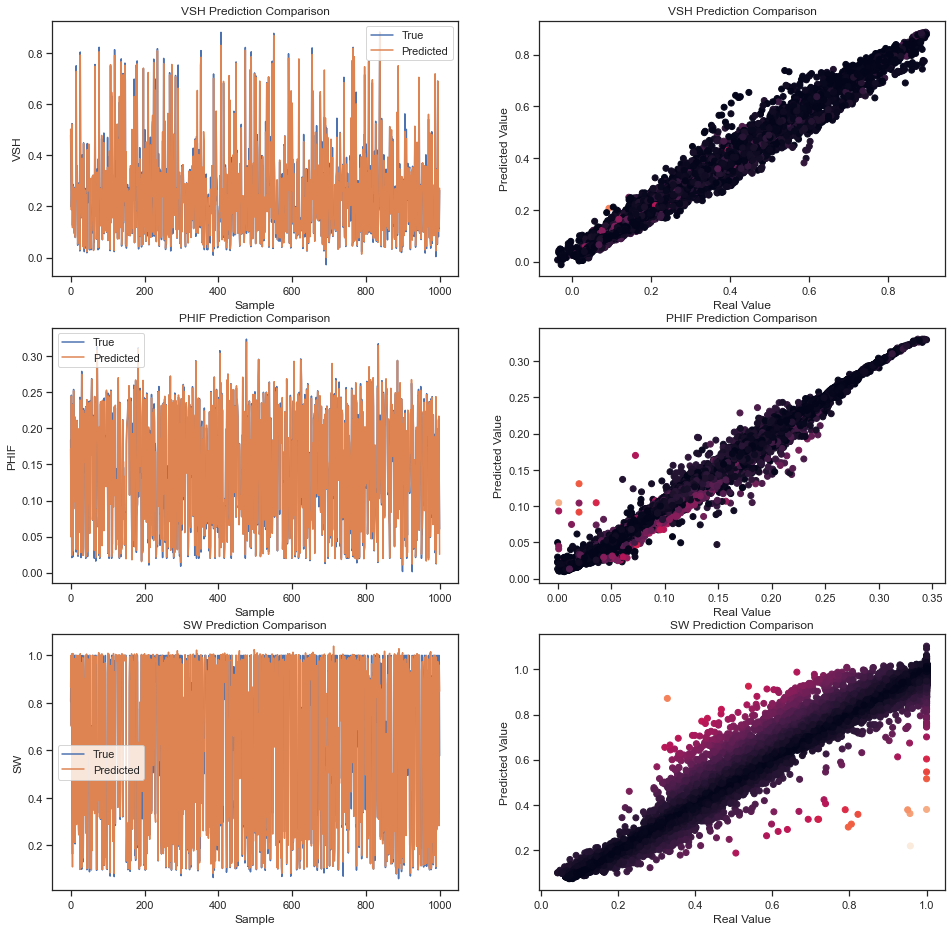

In [548]:
result_plot(y_GBR_train_pred, y_train.to_numpy(), n_points=1000)

In [549]:
#Calculating R^2
GBR_training_R2=GBR_best_model.score(X_train,y_train)
print("The R^2 value is:", GBR_training_R2)

#Calculating the adjusted R^2
Adjusted_GBR_training_R2= 1 - (1-GBR_training_R2)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("The Adjusted R^2 value is:", Adjusted_GBR_training_R2)

The R^2 value is: 0.9880444306314821
The Adjusted R^2 value is: 0.9880399280546862


RMSE: 0.03132
    VSH   : 0.02150
    PHIF  : 0.00720
    SW    : 0.04928
R^2:  0.9865505379076899
    VSH   : 0.98638
    PHIF  : 0.99216
    SW    : 0.98112


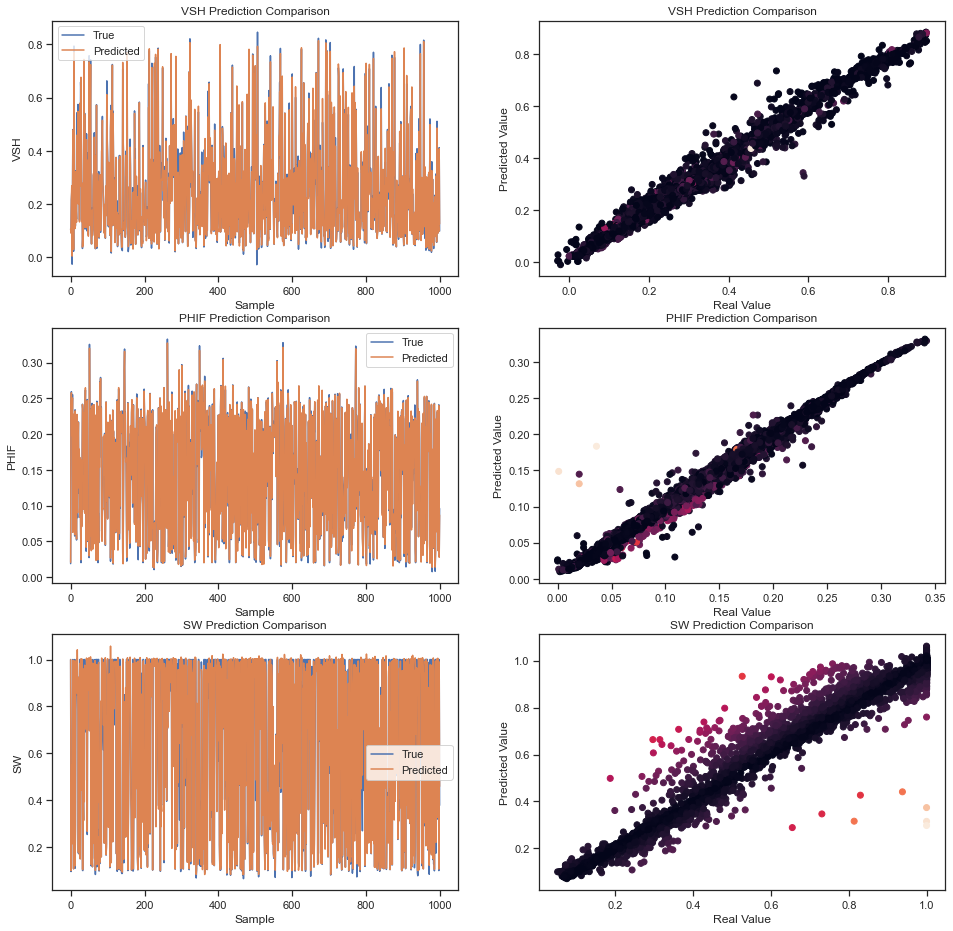

In [550]:
result_plot(y_GBR_val_pred, y_val.to_numpy(), n_points=1000)

In [551]:
#Calculating R^2
GBR_validation_R2=GBR_best_model.score(X_val,y_val)
print("The R^2 value is:", GBR_validation_R2)

#Calculating the adjusted R^2
Adjusted_GBR_validation_R2= 1 - (1-GBR_validation_R2)*(len(y_val)-1)/(len(y_val)-X_train.shape[1]-1)
print("The Adjusted R^2 value is:", Adjusted_GBR_validation_R2)

The R^2 value is: 0.9865505379076899
The Adjusted R^2 value is: 0.9865302549240026


#### Regression Plot Summary

In [602]:
index = ['Linear Regression', 'KNN', 'SVM', 'SVM_PCA','RF','RF_FE','GBR']
Train_R2 = [0.88563,  1, 0.80752,0.82680, 0.92371, 0.93897, 0.98655]
Adjusted_Train_R2= [0.888559,  1, 0.80750,0.82676, 0.92369,0.93894, 0.98653]
RMSE = [0.11024, 0, 0.05982, 0.05980, 0.05507, 0.05021, 0.03132]

Train_score_df = pd.DataFrame({'Training R2': Train_R2, 'Adj_Training R2': Adjusted_Train_R2,
                        'RMSE': RMSE}, index=index)

In [603]:
Train_score_df

,Training R2,Adj_Training R2,RMSE
Linear Regression,0.88563,0.888559,0.11024
KNN,1.00000,1.000000,0.00000
SVM,0.80752,0.807500,0.05982
SVM_PCA,0.82680,0.826760,0.05980
RF,0.92371,0.923690,0.05507
RF_FE,0.93897,0.938940,0.05021
GBR,0.98655,0.986530,0.03132


Text(0, 0.5, 'Score')

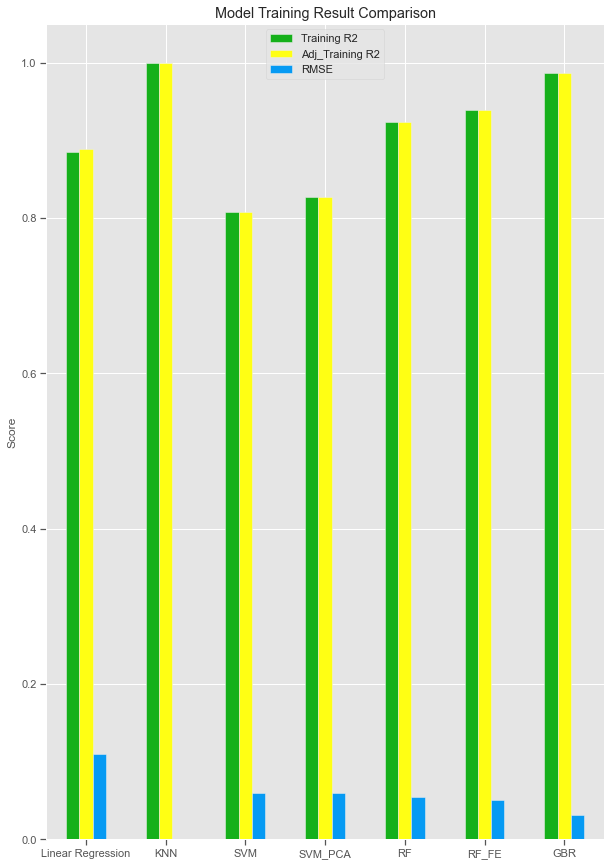

In [604]:
plt.style.use('ggplot')
ax = Train_score_df.plot.bar(rot=0, color= ['#15B01A', '#FFFF14', '#069AF3', '#E50000'], figsize=(10, 15))
plt.title('Model Training Result Comparison')
plt.ylabel('Score')

##### Validation Results

In [605]:
index = ['Linear Regression', 'KNN', 'SVM', 'SVM_PCA','RF','RF_FE','GBR']
Val_R2 = [0.88633,  0.98714, 0.80508,0.82394, 0.92306, 0.940718, 0.98804]
Adjusted_Val_R2= [0.88616,  0.98712, 0.80505,0.82390, 0.92295,0.940599, 0.988039]
RMSE_val = [0.11033, 0.0311, 0.06153, 0.06122, 0.05518, 0.04942, 0.02939]

Val_score_df = pd.DataFrame({'Validation R2': Val_R2, 'Adj_Validation R2': Adjusted_Val_R2,
                        'RMSE': RMSE_val}, index=index)

In [608]:
Val_score_df

,Validation R2,Adj_Validation R2,RMSE
Linear Regression,0.886330,0.886160,0.11033
KNN,0.987140,0.987120,0.03110
SVM,0.805080,0.805050,0.06153
SVM_PCA,0.823940,0.823900,0.06122
RF,0.923060,0.922950,0.05518
RF_FE,0.940718,0.940599,0.04942
GBR,0.988040,0.988039,0.02939


Text(0, 0.5, 'Score')

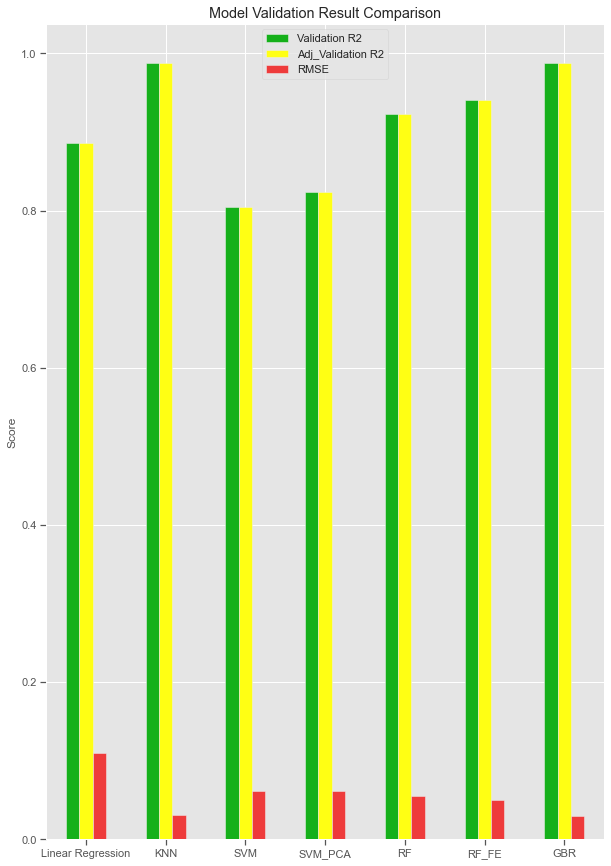

In [607]:
plt.style.use('ggplot')
ax = Val_score_df.plot.bar(rot=0, color= ['#15B01A', '#FFFF14', '#EE3B3B', '#E50000'], figsize=(10, 15))
plt.title('Model Validation Result Comparison')
plt.ylabel('Score')

#### Summary

1. Overfitting was seen in KNN
2. The GradientBoost Regression Performed Optimally. 
3. Support Vector Machine did not perform very well. 
4. GradientBoostRegression is Selected as the best Model

#### Preparing Test Data for Prediction 

In [734]:
test_raw.head()

,WELLNUM,DEPTH,DTC,DTS,BS,CALI,DEN,DENC,GR,NEU,PEF,RDEP,RMED,ROP
0,100,4850.129845,65.46309,136.73971,8.5,8.275658,2.545791,0.051429,9.791040,0.134139,5.858729,2.881351,2.645010,262.2817
1,100,4850.282245,64.56976,136.73971,8.5,8.275658,2.524871,0.043547,11.278870,0.111488,6.021325,2.881351,2.645010,262.0370
2,100,4850.434645,64.43656,136.73971,8.5,8.275658,2.507431,0.037683,9.954506,0.112143,6.060280,3.027379,2.928987,261.9881
3,100,4850.587045,65.03485,136.73971,8.5,8.275658,2.575224,0.064832,8.630137,0.114846,6.202412,3.054653,2.974949,261.7196
4,100,4850.739445,65.13235,136.73971,8.5,8.286819,2.550074,0.017329,7.305769,0.116967,5.179704,3.054653,2.974949,261.5247


In [735]:
final_test_data=test_raw[['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']]

In [736]:
testit=final_test_data.to_numpy()

In [737]:
from sklearn.preprocessing import StandardScaler

scaler_s = StandardScaler()
                  
testit_scaled = scaler_s.fit_transform(testit)                              
testit_scaled_df = pd.DataFrame (testit_scaled, columns = ['RMED', 'RDEP', 'GR', 'NEU', 'DEPTH', 'DTS', 'DTC', 'DEN', 'DENC','CALI', 'PEF']) 

In [738]:
testit_scaled_df.shape

(11189, 11)

In [739]:
testit_scaled_df.head()

,RMED,RDEP,GR,NEU,DEPTH,DTS,DTC,DEN,DENC,CALI,PEF
0,-0.110087,-0.110610,-0.992971,-0.968103,1.292873,-0.745035,-1.462385,0.871505,0.925631,-1.361955,1.202624
1,-0.110087,-0.110610,-0.966620,-1.258903,1.293072,-0.745035,-1.542328,0.734427,0.641237,-1.361955,1.316142
2,-0.109146,-0.110061,-0.990076,-1.250496,1.293271,-0.745035,-1.554248,0.620152,0.429634,-1.361955,1.343339
3,-0.108994,-0.109958,-1.013531,-1.215791,1.293469,-0.745035,-1.500708,1.064364,1.409252,-1.361955,1.442569
4,-0.108994,-0.109958,-1.036987,-1.188562,1.293668,-0.745035,-1.491983,0.899569,-0.304801,-1.302984,0.728557


In [740]:
final_predictions=KNN_best_model.predict(testit_scaled)

final_predictions_df=pd.DataFrame(final_predictions, columns=['VSH_pred_knn','PHIF_pred_knn','SW_pred_knn'])

final_predictions_df.describe()

Train_data[['VSH','PHIF','SW']].describe()







final_predictions_GBR=GBR_best_model.predict(testit_scaled)

final_predictions_GBR_df=pd.DataFrame(final_predictions_GBR, columns=['VSH_pred_GBR','PHIF_pred_GBR','SW_pred_GBR'])

final_predictions_GBR_df.describe()



,VSH_pred_GBR,PHIF_pred_GBR,SW_pred_GBR
count,11189.000000,11189.000000,11189.000000
mean,0.254251,0.142174,0.589021
std,0.150618,0.072917,0.317989
min,0.071524,0.011632,0.077917
25%,0.140485,0.077290,0.290462
50%,0.202924,0.132139,0.619337
75%,0.333919,0.213039,0.900616
max,0.886239,0.289527,1.268572


In [741]:
Train_data[['VSH','PHIF','SW']].describe()

,VSH,PHIF,SW
count,36526.000000,36526.000000,36526.000000
mean,0.253626,0.145851,0.642839
std,0.184674,0.081524,0.357788
min,-0.035820,0.000000,0.043000
25%,0.106000,0.070000,0.275600
50%,0.213300,0.151000,0.737000
75%,0.338175,0.221200,1.000000
max,0.896700,0.344653,1.000000


##### KNN Model

In [575]:
final_predictions=KNN_best_model.predict(testit)

final_predictions_df=pd.DataFrame(final_predictions, columns=['VSH','PHIF','SW'])

final_predictions_df.describe()

,VSH,PHIF,SW
count,11189.000000,11189.000000,11189.000000
mean,0.448717,0.090186,0.767888
std,0.109422,0.029784,0.269862
min,0.136190,0.063942,0.159766
25%,0.478694,0.072133,0.688824
50%,0.503400,0.072135,0.933690
75%,0.503401,0.109311,0.933691
max,0.553270,0.177730,0.952747


##### GBR Model

In [577]:
final_predictions_GBR=GBR_best_model.predict(testit)

final_predictions_GBR_df=pd.DataFrame(final_predictions_GBR, columns=['VSH','PHIF','SW'])

final_predictions_GBR_df.describe()

,VSH,PHIF,SW
count,11189.000000,11189.000000,11189.000000
mean,0.904378,0.031394,0.977702
std,0.012161,0.003272,0.025970
min,0.876268,0.030539,0.895523
25%,0.890939,0.030539,0.950124
50%,0.904688,0.030539,0.967390
75%,0.912385,0.030539,1.007065
max,0.927749,0.048227,1.011028


##### KNN Model

In [564]:
final_predictions1=KNN_best_model.predict(testit)

final_predictions1_df=pd.DataFrame(final1_predictions, columns=['VSH','PHIF','SW'])

final_predictions1_df.describe()



final_predictions_GBR=GBR_best_model.predict(testit)

final_predictions_GBR__df=pd.DataFrame(final_predictions, columns=['VSH','PHIF','SW'])

final_predictions_GBR_df.describe()







# GradientBoosting model
#from sklearn.multioutput import MultiOutputRegressor
#from sklearn.feature_selection import SelectFromModel
#from sklearn.ensemble import GradientBoostingRegressor

#GBR = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))
#GBR_best = grid_search(GBR, {})

,VSH,PHIF,SW
count,11189.000000,11189.000000,11189.000000
mean,0.448717,0.090186,0.767888
std,0.109422,0.029784,0.269862
min,0.136190,0.063942,0.159766
25%,0.478694,0.072133,0.688824
50%,0.503400,0.072135,0.933690
75%,0.503401,0.109311,0.933691
max,0.553270,0.177730,0.952747


In [ ]:
# GradientBoosting model
#from sklearn.multioutput import MultiOutputRegressor
#from sklearn.feature_selection import SelectFromModel
#from sklearn.ensemble import GradientBoostingRegressor

#GBR = MultiOutputRegressor(GradientBoostingRegressor(random_state=42))
#GBR_best = grid_search(GBR, {})

#### REFERENCES

1. Akinnikawe, O., Lyne, S., & Roberts, J. (2018, July). Synthetic well log generation using machine learning techniques. In SPE/AAPG/SEG Unconventional Resources Technology Conference. OnePetro.